<a href="https://colab.research.google.com/github/LaneLewis/pgms-project/blob/main/gpml_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torch
!pip install numpy
!pip install matplotlib

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Apr 28 14:20:48 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import copy
from torch import nn , optim
from torch.nn.modules import Module
from tqdm import tqdm
from torch.utils.data import TensorDataset,DataLoader
import gc
import matplotlib.pyplot as plt
import numpy as np
import torch
import math
import torch.nn as nn
import pickle as pkl
from torch.func import jacrev


In [ ]:
class SquareLeakyReLU(nn.Module):
    def __init__(self,alpha):
        super().__init__()
        self.alpha = alpha
        self.relu = nn.LeakyReLU(alpha)
    def forward(self,x):
        return torch.square(self.relu(x))

class PositiveLinear(nn.Module):
    #from ghub
    def __init__(self, in_features, out_features,device="cpu"):
        super(PositiveLinear, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.log_weight = nn.Parameter(torch.Tensor(out_features, in_features))
        self.reset_parameters()
        self.to(device)

    def reset_parameters(self):
        nn.init.xavier_uniform_(self.log_weight)

    def forward(self, input):
        return nn.functional.linear(input, self.log_weight.exp())

class ConvexLayer(nn.Module):
    def __init__(self,input_size,output_size,activation,first_layer=False,layer_minus_1_size=None,device="cpu"):
        #wasnt sure the proper way to init bias here
        if not first_layer:
            assert not (layer_minus_1_size is None)
        super().__init__()
        self.first_layer = first_layer
        self.input_u_w = PositiveLinear(input_size,output_size,device=device)
        if not first_layer:
            self.input_z_w = PositiveLinear(layer_minus_1_size,output_size,device=device)
        self.activation = activation
        self.bias = nn.Parameter(torch.Tensor(output_size))
        std = 1/math.sqrt(output_size)
        self.bias.data.uniform_(-std,std)
        self.to(device)

    def forward(self,initial_input, layer_minus_1=None):
        if not self.first_layer:
            linear_sum = self.input_u_w(initial_input) + self.input_z_w(layer_minus_1) + self.bias
        else:
            linear_sum = self.input_u_w(initial_input) + self.bias
        return self.activation(linear_sum)

class BrenierMapNN(nn.Module):
    def __init__(self,hidden_layer_sizes,input_size,alpha=0.2,device="cpu"):
        super().__init__()
        self.layers = []
        for index,layer_size in enumerate(hidden_layer_sizes):
            if index == 0:
                l = ConvexLayer(input_size,layer_size,activation=SquareLeakyReLU(alpha),first_layer=True,device=device)
            else:
                l = ConvexLayer(input_size,layer_size,activation=nn.LeakyReLU(alpha),
                                first_layer=False,layer_minus_1_size=hidden_layer_sizes[index-1],device=device)
            self.layers.append(l)
        final_layer = ConvexLayer(input_size,1,nn.LeakyReLU(alpha),first_layer=False,layer_minus_1_size=layer_size,device=device)
        self.layers.append(final_layer)
        self.layers = nn.ModuleList(self.layers)
    def forward_convex(self,u):
        z = u
        for index, l in enumerate(self.layers):
            if index == 0:
                z = l(u)
            else:
                z = l(u, z)
        return z
    def forward(self, u):
        return batched_jacobian(self.forward_convex,u)

def batched_jacobian(func,inputs):
    return torch.squeeze(torch.vmap(jacrev(func))(inputs))

class ConvexFeedforward(nn.Module):
    def __init__(self, first_map_layer_sizes, second_map_layer_sizes,latent_dims,observed_dims,device="cpu"):
        super().__init__()
        self.latent_dims = latent_dims
        self.observed_dims = observed_dims
        self.first_map_layer_sizes = first_map_layer_sizes
        self.second_map_layer_sizes = second_map_layer_sizes
        self.first_map = BrenierMapNN(first_map_layer_sizes,latent_dims,device=device)
        self.second_map = BrenierMapNN(second_map_layer_sizes,observed_dims,device=device)
        self.betas = torch.concat([torch.eye(latent_dims,requires_grad=False,device=device),torch.zeros(observed_dims - latent_dims,latent_dims,requires_grad=False,device=device)])
        self.to(device)
    def forward(self,latent_input):
        collapsed = math.prod(latent_input.shape[0:-1])
        batch_collapsed_input = latent_input.reshape((collapsed,latent_input.shape[-1]))
        out_shape = list(latent_input.shape)
        out_shape[-1] = self.observed_dims
        v = self.first_map.forward(batch_collapsed_input)
        v = torch.matmul(self.betas,v.T).T
        v = self.second_map.forward(v)
        out_v = v.reshape(out_shape)
        return out_v


In [ ]:
class FeedforwardNNDecoder(nn.Module):
    #NOTE this is completely untested!
    def __init__(self,layers_list,latent_dims,observed_dims,device="cpu"):
        super().__init__()
        self.layers = nn.ModuleList()
        self.input_dim = latent_dims
        input_size = latent_dims
        for size,activation in layers_list:
            linear_layer = nn.Linear(input_size,size)
            self.layers.append(linear_layer)
            input_size = size
            if activation is not None:
                assert isinstance(activation, Module),"Each tuples should contain a size (int) and a torch.nn.modules.Module."
                self.layers.append(activation)
        self.layers.append(nn.Linear(input_size,observed_dims))
        self.to(device)

    def forward(self,input_data):
        for layer in self.layers:
            input_data = layer(input_data)
        return input_data

class FeedforwardNNDecoderTau(nn.Module):
    #NOTE this is completely untested!
    def __init__(self,layers_list,latent_dims,observed_dims,device="cpu"):
        super().__init__()
        self.layers = nn.ModuleList()
        self.input_dim = 2*latent_dims
        input_size = 2*latent_dims
        for size,activation in layers_list:
            linear_layer = nn.Linear(input_size,size)
            self.layers.append(linear_layer)
            input_size = size
            if activation is not None:
                assert isinstance(activation, Module),"Each tuples should contain a size (int) and a torch.nn.modules.Module."
                self.layers.append(activation)
        self.layers.append(nn.Linear(input_size,observed_dims))
        self.to(device)

    def forward(self,latent_data,taus):
        batch_size = latent_data.shape[0]
        samples = latent_data.shape[1]
        timesteps = latent_data.shape[2]
        latent_dims = latent_data.shape[3]
        tau_batch_sample_append = torch.ones((batch_size,samples,timesteps,latent_dims))*taus
        #taus_arr = torch.stack(batch_size*[torch.outer(torch.ones(samples,timesteps),taus)])
        latent_data_plus_tau = torch.concat([latent_data,tau_batch_sample_append],dim=3)
        input_data = latent_data_plus_tau
        for layer in self.layers:
            input_data = layer(input_data)
        return input_data

class ParabolaDecoder(nn.Module):
    def __init__(self,alpha,device="cpu"):
        super().__init__()
        self.alpha = torch.nn.Parameter(torch.tensor(alpha,requires_grad=True,device=device))
    def forward(self,Z):
        '''takes in a two dimensional latent variable and embeds it into a 3d parabola
        Z - tensor of shape [batch_size,samples, timesteps, dims_in]
        returns X a tensor of shape [batch_size, samples, timesteps, dims_in+1]
        '''
        extra_dim = torch.linalg.norm(Z,dim=-1)**2
        return torch.cat((Z,self.alpha*extra_dim.unsqueeze(-1)),dim=-1)
        #return torch.cat((self.alpha*Z+10.0,self.alpha*Z+10.0),dim=-1)

class HighDParabolaDecoder(nn.Module):
    def __init__(self,latent_dims,observation_dims,device="cpu",alpha=10.0):
        super().__init__()
        self.alpha = torch.nn.Parameter(torch.tensor(alpha,requires_grad=True,device=device))
        self.parabola_to_embedding_layer = nn.Linear(latent_dims+1,observation_dims,device=device)

    def forward(self,Z):
        '''takes in a k dimensional latent variable and embeds it into an n d parabola
        Z - tensor of shape [batch_size,samples, timesteps, dims_in]
        returns X a tensor of shape [batch_size, samples, timesteps, dims_in+1]
        '''
        extra_dim = torch.linalg.norm(Z,dim=-1)**2
        parabola = torch.cat((Z,self.alpha*extra_dim.unsqueeze(-1)),dim=-1)
        return self.parabola_to_embedding_layer(parabola)

In [ ]:

class GPMLDataStruct():
    def __init__(self,latent_dims,observation_dims,taus=None,R_diag=None,
                 signal_sds=None,noise_sds=None,forward_model=None,device="cpu"):
        self.observation_dims = observation_dims
        self.latent_dims = latent_dims
        if taus == None:
            self.log_taus = torch.rand((latent_dims),requires_grad=False,device=device)
        else:
            assert len(taus) == latent_dims
            log_taus = [math.log(tau) for tau in taus]
            self.log_taus = torch.tensor(log_taus,requires_grad=False,device=device)
        #initializes R
        if R_diag == None:
            self.log_R_diag = torch.rand((self.observation_dims),requires_grad=False,device=device)
        else:
            assert len(R_diag) == observation_dims
            log_R_diag = [math.log(r) for r in R_diag]
            self.log_R_diag = torch.tensor(log_R_diag,requires_grad=False,device=device)
        #initializes signal sds
        if signal_sds == None:
            self.signal_sds = (1.0 - 0.01)*torch.ones((self.latent_dims),requires_grad=False,device=device)
        else:
            assert len(signal_sds) == latent_dims
            self.signal_sds = torch.tensor(signal_sds,requires_grad=False,device=device)
        #initializes noise_sds
        if noise_sds == None:
            self.noise_sds = 0.01*torch.ones((self.latent_dims),requires_grad=False,device=device)
        else:
            assert len(noise_sds) == latent_dims
            self.noise_sds = torch.tensor(noise_sds,requires_grad=False,device=device)
        if forward_model == None:
            self.forward_model = nn.Linear(latent_dims,observation_dims)
        else:
            self.forward_model = forward_model
        self.device=device
        assert self.log_taus.shape == self.signal_sds.shape == self.noise_sds.shape
        assert len(self.log_R_diag) == self.observation_dims

    def sde_kernel_matrices(self,times:torch.Tensor)->torch.Tensor:
        '''implements simultaneous construction of the sde kernal
            for multiple taus, signal_sds, noise_sds

            timesteps - tensor of floats with shape (timesteps)
            taus - tensor of shape (latent_dims): time consts of each GP
            signal_sds - tensor of shape (latent_dims): signal_sds of the GP
            noise_sds - tensor of shape (latent_dims): noise_sds of the GP

            returns kernels - tensor of shape [timesteps,timesteps,latent_dims]:
                                which gives the kernal matrices for each latent_dim
        '''
        #NOTE: this function passes its test cases
        taus = torch.exp(self.log_taus)
        timesteps = times.shape[0]
        data_times_square = torch.outer(torch.square(times),torch.ones(timesteps,device=self.device,requires_grad=False))
        exp_shared_term = -1*(data_times_square + data_times_square.T - 2 * torch.outer(times,times))
        exp_taus_term = 2*torch.square(taus)
        #has shape [timesteps,timesteps,latent_dims]
        signal_term = (self.signal_sds**2)*torch.exp(exp_shared_term.unsqueeze(2)/exp_taus_term)
        noise_term = (self.noise_sds**2)*(torch.eye(timesteps,device=self.device).unsqueeze(2))
        output_matrix =  signal_term + noise_term
        return output_matrix

    def taus(self):
        return torch.exp(self.log_taus)

    def R_diag(self):
        return torch.exp(self.log_R_diag)

    def sample_model(self,samples,times):
        kernel_matrices = self.sde_kernel_matrices(times)
        R = torch.diag(self.R_diag())
        time_steps = torch.zeros(kernel_matrices.shape[0],device=self.device)
        prior_samples = torch.distributions.MultivariateNormal(time_steps,kernel_matrices.permute(2,0,1)).sample((samples,)).permute(0,2,1)
        decoding_manifold_means = self.forward_model.forward(prior_samples)
        data_samples = torch.distributions.MultivariateNormal(decoding_manifold_means,R).sample((1,)).squeeze()
        return prior_samples, data_samples

In [ ]:

def sample_prior(timesteps,Ks,samples,batch_size,device="cpu"):
    '''
    returns prior_samples - shape[batch_size,samples,timesteps,latent_dims]:
                                samples from the prior
    '''
    prior_samples = torch.distributions.MultivariateNormal(torch.zeros(timesteps,device=device),Ks.permute(2,0,1)).rsample((batch_size,samples))
    return prior_samples.permute(0,1,3,2)

def ll_loss(batch_X,decoding_manifold_means,R):
    #decoding_manifold_means shape [batchsize, samples, timesteps, observed_dims]
    data_dist = torch.distributions.MultivariateNormal(decoding_manifold_means.permute(1,0,2,3),R)
    #testing
    data_prob = data_dist.log_prob(batch_X)
    summed_over_time = torch.sum(data_prob,dim=2)
    return summed_over_time.permute(1,0)

class GPML_LLF(nn.Module,GPMLDataStruct):
    def __init__(self,device:str,latent_dims:int,observation_dims:int,times:torch.Tensor,decoder_model:object,
                 signal_sds:list[float]=None, noise_sds:list[float]=None,
                 initial_taus:list[float]=None,initial_R_diag:list[float]=None,
                 train_taus = True, train_R_diag = True, train_decoder=True)->object:
        '''
        Implements the GPML framework.
        device - torch device to use
        latent_dims - int specifying the number of latent dims (Z)
        observation_dims - int specifying the number of observation dims (X)
        times - tensor of times specifying the time of each observation
        signal_sds - list of positive floats (size latent_dims) specifying the signal sd of the GP covariance
                    None initializes all parameters to 1.0 - 0.001
        noise_sds - list of positive floats (size latent_dims) specifying the signal sd of the GP covariance
                    None initializes all parameters to 0.001
        initial_taus - list of positive floats (size latent_dims) specifying the time constant of the GP covariance.
                       None initializes the parameters randomly
        initial_R_diag - list of positive floats (size latent_dims) specifying the diagonal noise of the observations (X)
        encoder_model - object with methods: .parameters() which returns the an iterator on the model parameters
                                             .forward(X) -> mu
                                                This function takes data and returns the mean of the posterior latents.
                                                X has shape [batch_size,timesteps,observation_dims]
                                                mu has shape [batch_size,timesteps,latent_dims]
        decoder_model - .parameters() which returns the an iterator on the model parameters
                        .forward(Z) -> manifold_mean
                            This function takes in samples from the latent space and returns the mean
                            of the random manifold that the data is generated from.
                            Z has shape [batch_size,samples,timesteps,observation_dims]
        '''
        #initialize base classes
        nn.Module.__init__(self)
        GPMLDataStruct.__init__(self,latent_dims,observation_dims,initial_taus,
                                initial_R_diag,signal_sds,noise_sds,decoder_model,device)
        #builds all the passed internal variables
        self.log_R_diag = nn.Parameter(self.log_R_diag)
        self.log_taus = nn.Parameter(self.log_taus)
        #registers them to the nn
        self.decoder_model = decoder_model
        self.times = times
        self.timesteps = times.shape[0]

        if train_taus:
            self.log_taus.requires_grad = True
        else:
            self.log_taus.requires_grad = False
        if train_R_diag:
            self.log_R_diag.requires_grad = True
        else:
            self.log_R_diag.requires_grad = False
        if train_decoder:
            for p in decoder_model.parameters():
                p.requires_grad = True
        else:
            for p in decoder_model.parameters():
                p.requires_grad = False


    def forward(self,X,samples):
        batch_size = X.shape[0]
        R = torch.diag(self.R_diag())
        Ks = self.sde_kernel_matrices(self.times)
        prior_samples = sample_prior(self.timesteps,Ks,samples,batch_size,device=self.device)
        decoding_manifold_means = self.decoder_model(prior_samples)
        log_likelihood_sample_losses = ll_loss(X,decoding_manifold_means,R)
        log_inv_samples = torch.log(torch.tensor(1/samples,requires_grad=False,device=self.device))
        approx_neg_log_likelihood = -1*(torch.logsumexp(log_likelihood_sample_losses,dim=1) + log_inv_samples)
        return approx_neg_log_likelihood

    def fit(self,X_train:torch.Tensor,X_validation=None,epochs=100,batch_size=1,lr=0.001,
                             approx_log_likelihood_loss_samples=100,save_cycle=100,
                              log_save_name="MC_Latest", true_plot_taus=None,true_R_diag=None):
        '''
        X_train- tensor of shape (iid_samples,time_steps,observation_dims): Gives the training data consisting of
                     data assumed to be generated by independent gaussian process latents with an sde kernel and then
                     tranformed onto a nonlinear statistical manifold and then sampled from with a normal distribution.
        encoder_optimizer - optimizer object that implements the method .step() which is called after every batch:
                            optimizer for the encoder model parameters.
        decoder_optimizer - optimizer object that implements the method .step() which is called after every batch:
                            optimizer for the encoder model parameters.
        optimize_taus - bool: indicates whether or not to run the optimizer on taus
        optimize_R - bool: indicates whether or not to run the optimizer on R
        batch_size - int: indicates the batch size to split the data into for each gradient step
        '''
        self.taus_trajectory = []
        self.R_diag_trajectory = []
        self.validation_loss = []
        self.training_loss = []
        optimizer = torch.optim.Adam(self.parameters(),lr=lr)
        #constructs an optimizer for the parameters tau and R, makes a dummy optimizer if none is passed
        #begins the main training loop
        batched_X_train = DataLoader(TensorDataset(X_train),batch_size=batch_size,shuffle=True)
        for epoch in tqdm(range(epochs),desc=f"MC Fit",colour="cyan"):
            batch_total_losses = []
            for (batch_X,) in batched_X_train:
                optimizer.zero_grad()
                batch_neg_lls = self.forward(batch_X,approx_log_likelihood_loss_samples)
                loss = torch.mean(batch_neg_lls)
                loss.backward()
                #steps the grad
                optimizer.step()
                #training loss
                batch_total_losses.append(loss.clone().detach())
            self.training_loss.append(np.mean(torch.stack(batch_total_losses).cpu().numpy()))
            self.taus_trajectory.append(self.taus().clone().detach().cpu().numpy())
            self.R_diag_trajectory.append(self.R_diag().clone().detach().cpu().numpy())
            if not X_validation is None:
                with torch.no_grad():
                    validation_neg_lls = self.forward(X_validation,approx_log_likelihood_loss_samples)
                    self.validation_loss.append(torch.mean(validation_neg_lls).clone().detach().cpu().numpy())
            if epoch%save_cycle == 0 and epoch > 0:
                plot_taus(self.taus_trajectory,log_save_name,true_taus = true_plot_taus)
                plot_loss(self.training_loss,self.validation_loss,log_save_name)
                plot_R_diag(self.R_diag_trajectory,log_save_name,r_diag=true_R_diag)

def plot_taus(epochs_taus,filename,true_taus=None):
    if not true_taus is None:
      for tau in true_taus:
          plt.axhline(tau,color="red",linestyle="--")
    epochs = range(len(epochs_taus))
    plt.title("GPML MC Estimator: Taus Over Epochs")
    epochs_taus = np.array(epochs_taus)
    for tau_i in range(epochs_taus.shape[1]):
      plt.plot(epochs,epochs_taus[:,tau_i],label=f"{epochs_taus[-1,tau_i]}")
    plt.ylabel("Tau")
    plt.legend()
    plt.show()
    plt.savefig(f"./{filename}_Taus.png")
    plt.cla()

def plot_loss(epochs_total_loss,epochs_validation_loss,filename):
    epochs = range(len(epochs_total_loss))
    plt.title("GPML MC Estimator: Loss Over Epochs")
    plt.plot(epochs,epochs_total_loss,color="black",label=f"Total Loss: {epochs_total_loss[-1]}")
    if len(epochs_validation_loss) > 0:
        plt.plot(epochs,epochs_validation_loss,label=f"Test Loss:{epochs_validation_loss[-1]}",color="purple")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()
    plt.savefig(f"./{filename}_Loss.png")
    plt.cla()

def plot_R_diag(epochs_R_diag,filename,r_diag):
    if not r_diag is None:
      for r in r_diag:
          plt.axhline(r,color="red", linestyle="--")
    epochs = range(len(epochs_R_diag))
    plt.title("GPML MC Estimator: R Over Epochs")
    epochs_R_diag = np.array(epochs_R_diag)
    for r_i in range(epochs_R_diag.shape[1]):
      plt.plot(epochs,epochs_R_diag[:,r_i],label=f"{epochs_R_diag[-1,r_i]}")
    plt.ylabel("R")
    plt.legend()
    plt.show()
    plt.savefig(f"./{filename}_R_diag.png")
    plt.cla()

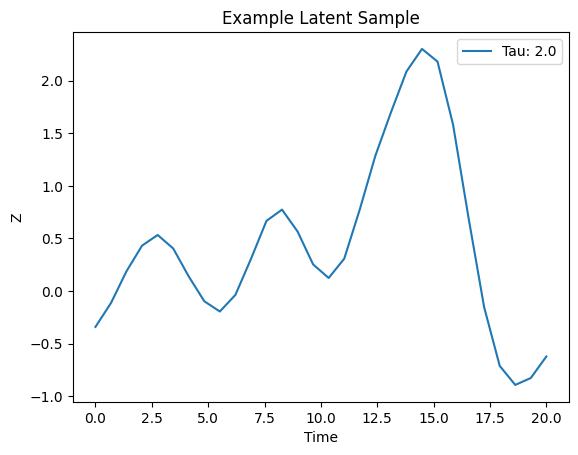

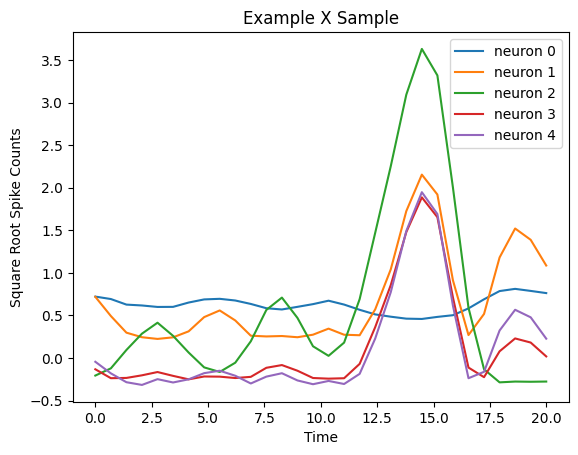

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
MC Fit:   0%|          | 100/100000 [01:55<31:41:24,  1.14s/it]

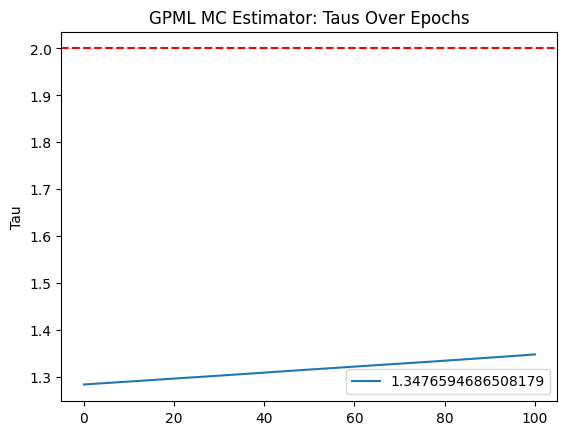

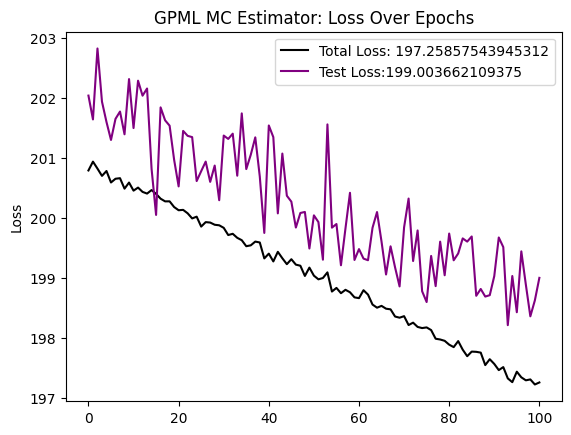

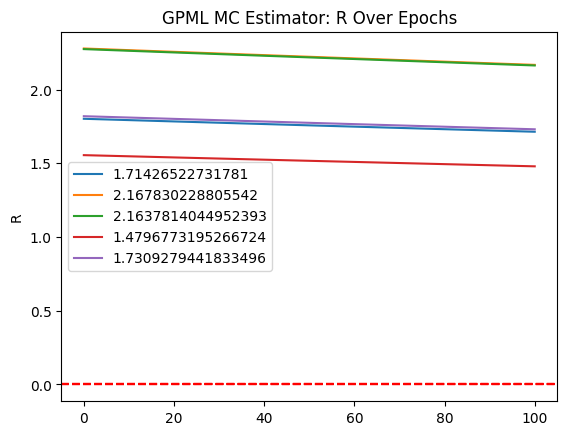

MC Fit:   0%|          | 200/100000 [03:51<31:39:44,  1.14s/it]

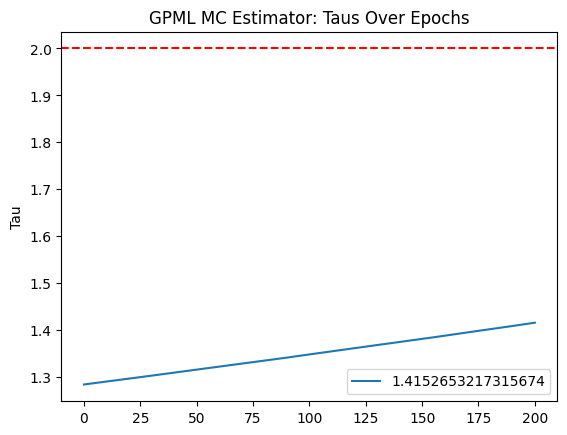

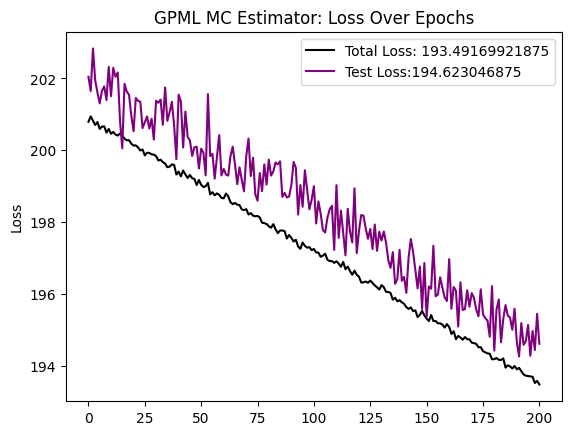

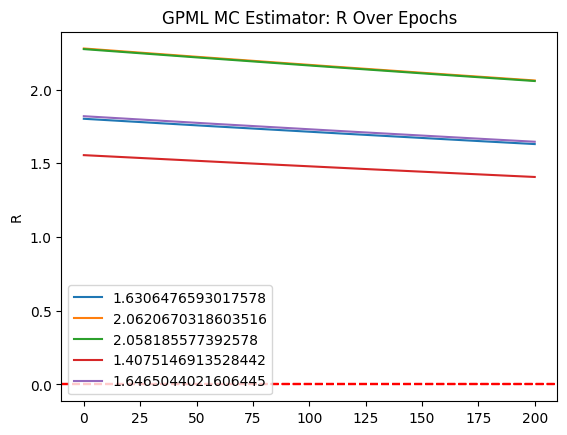

MC Fit:   0%|          | 300/100000 [05:46<31:39:47,  1.14s/it]

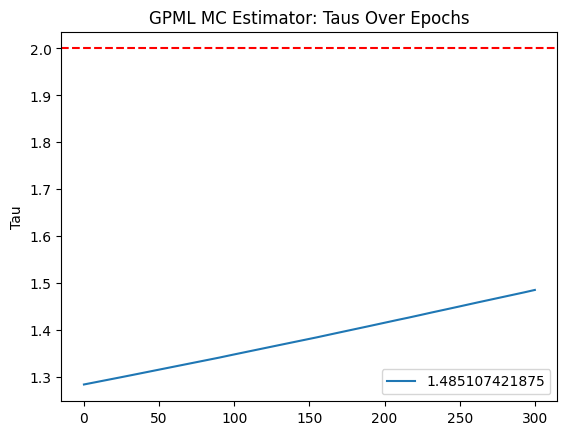

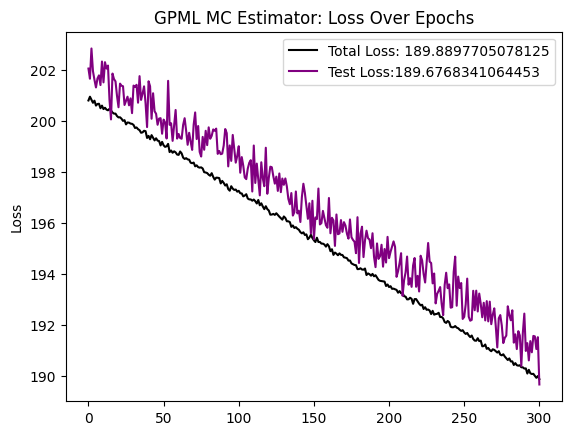

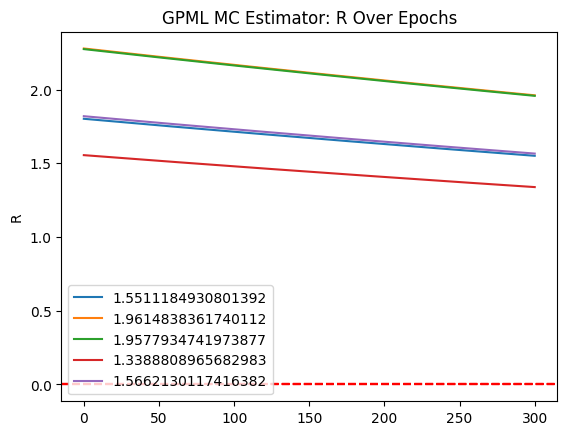

MC Fit:   0%|          | 400/100000 [07:41<31:41:11,  1.15s/it]

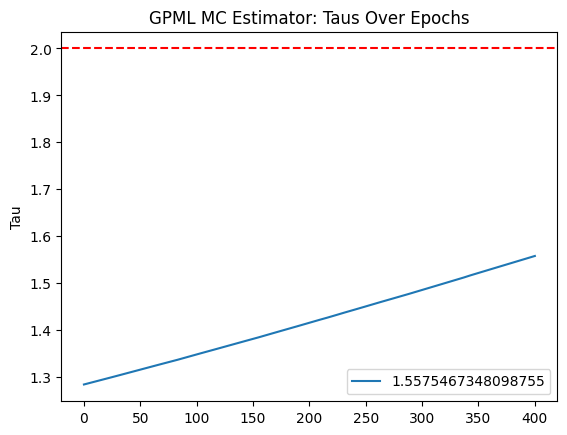

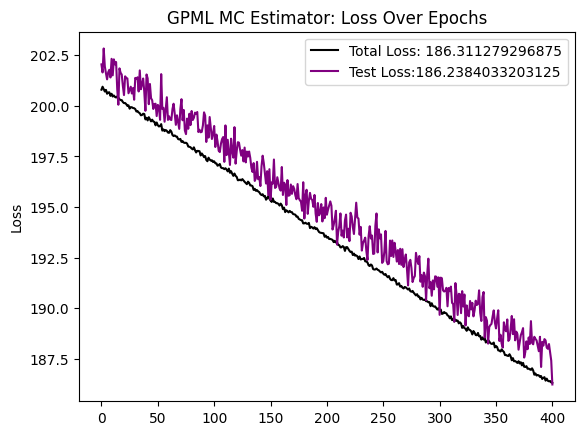

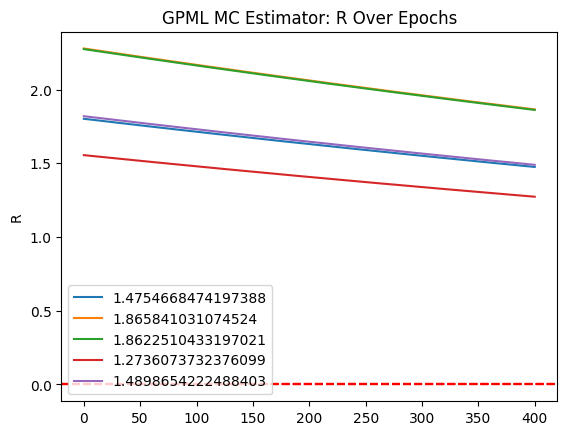

MC Fit:   0%|          | 500/100000 [09:37<31:42:44,  1.15s/it]

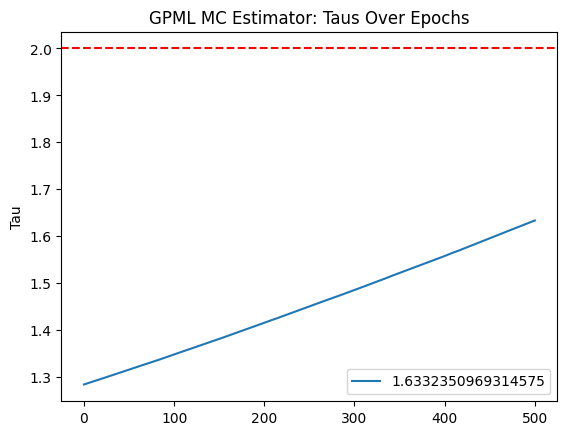

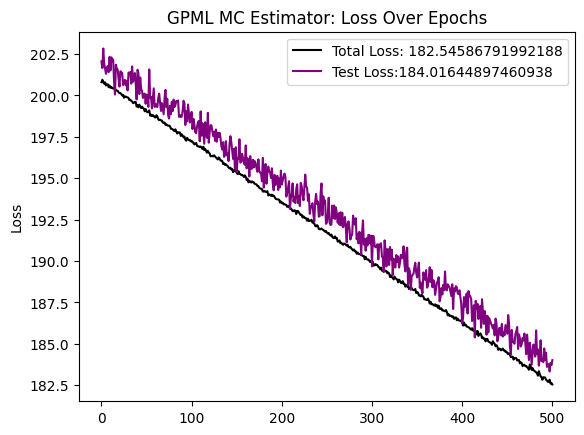

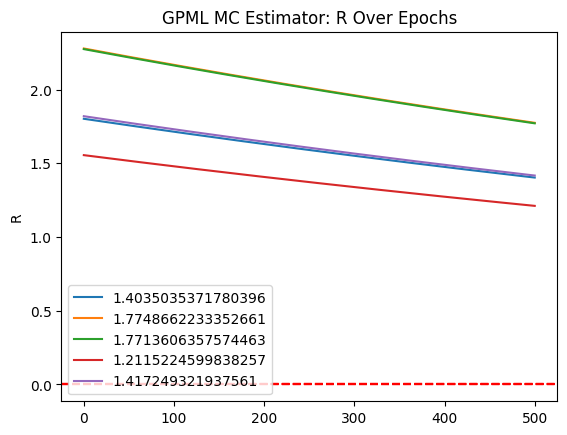

MC Fit:   1%|          | 600/100000 [11:32<31:40:49,  1.15s/it]

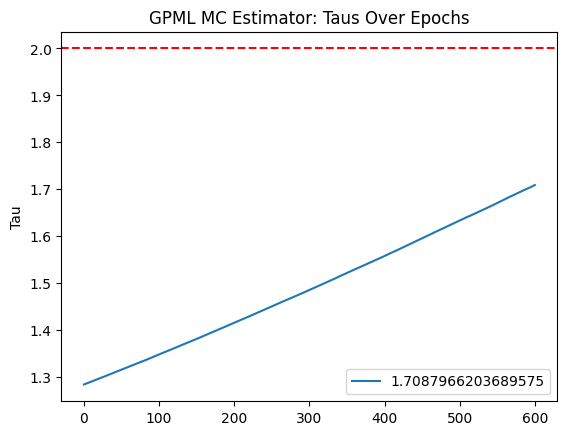

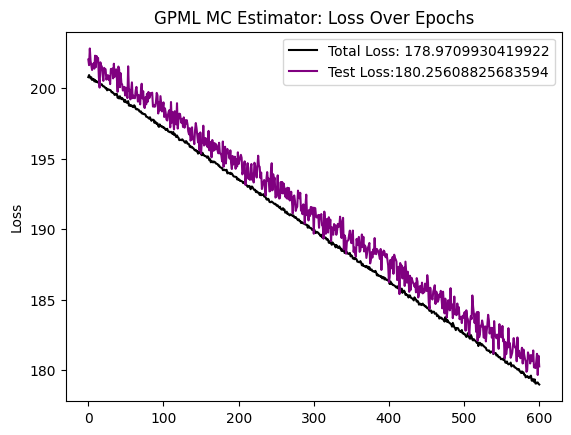

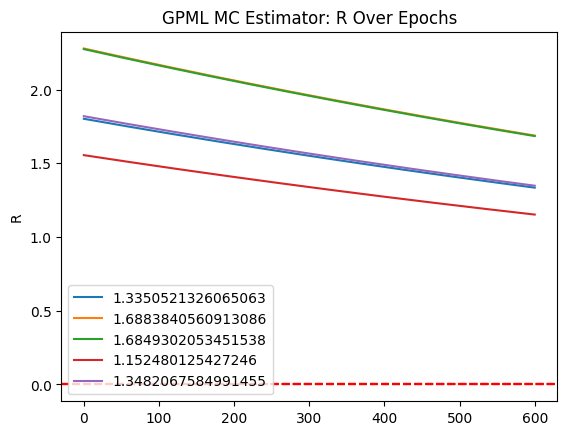

MC Fit:   1%|          | 700/100000 [13:28<31:41:20,  1.15s/it]

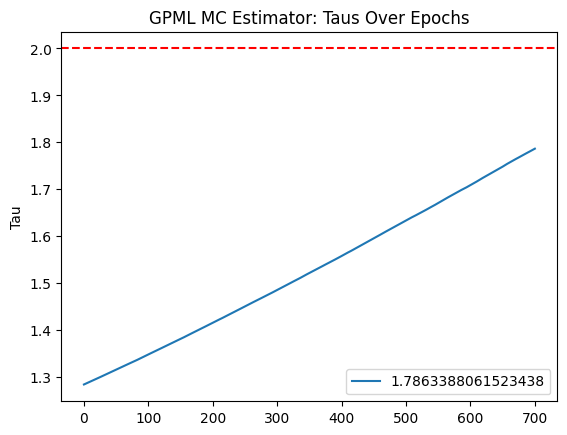

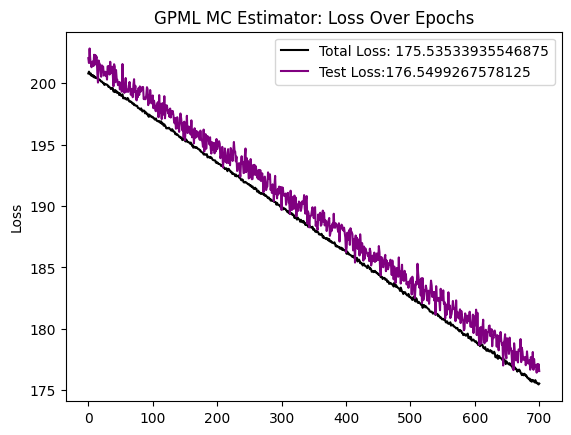

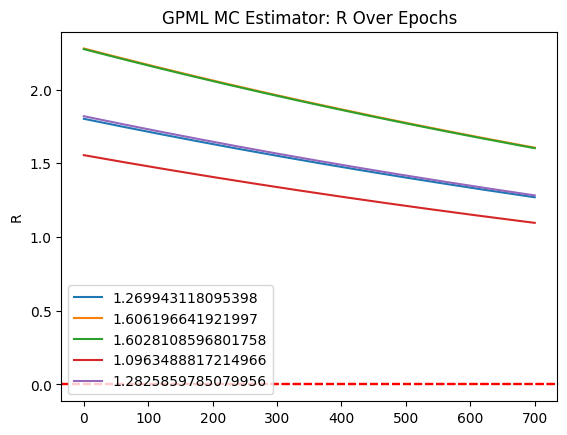

MC Fit:   1%|          | 800/100000 [15:24<31:38:32,  1.15s/it]

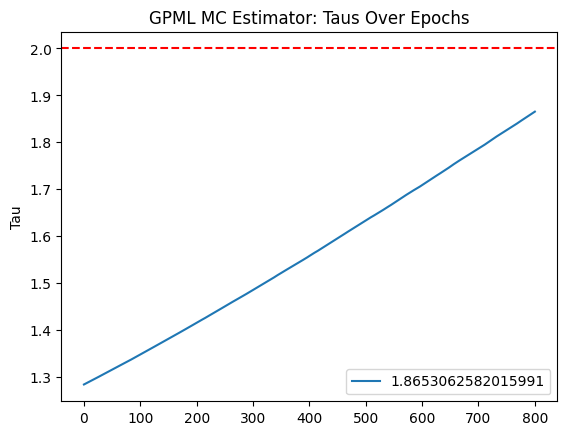

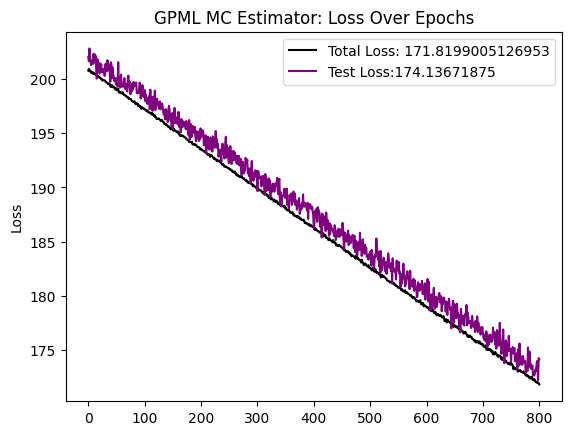

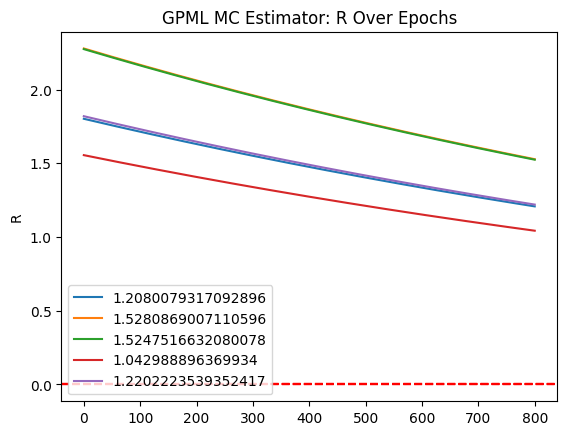

MC Fit:   1%|          | 900/100000 [17:20<31:39:26,  1.15s/it]

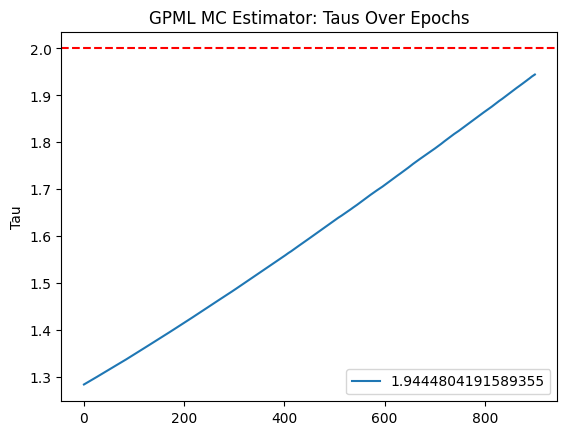

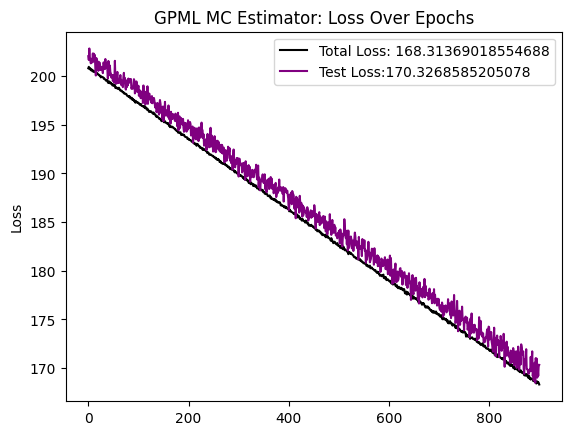

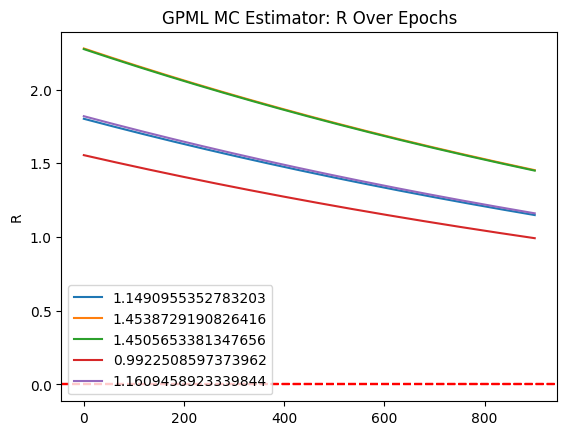

MC Fit:   1%|          | 1000/100000 [19:16<31:41:38,  1.15s/it]

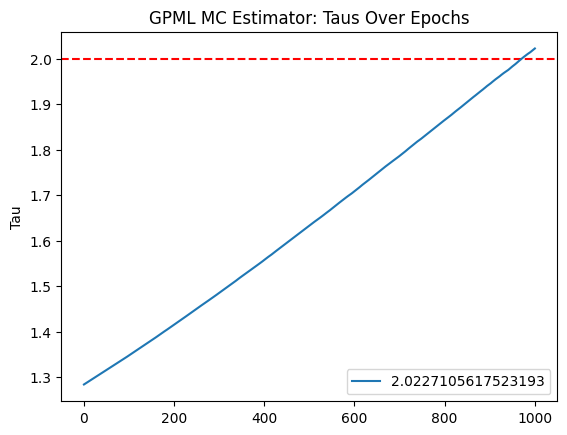

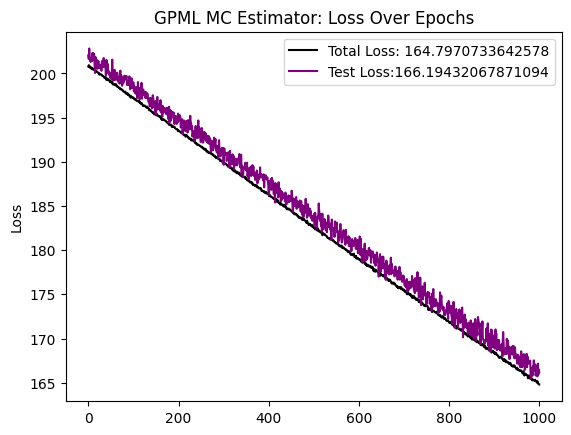

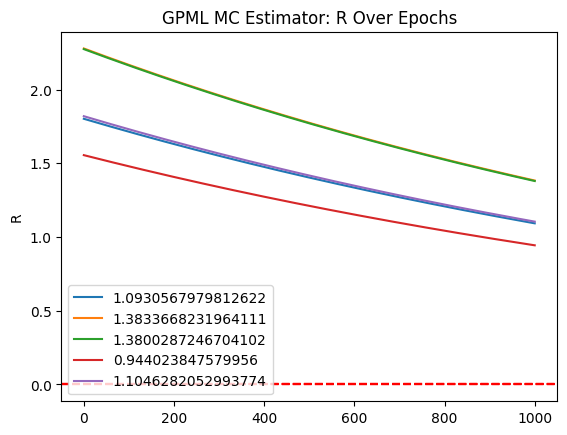

MC Fit:   1%|          | 1100/100000 [21:12<31:37:46,  1.15s/it]

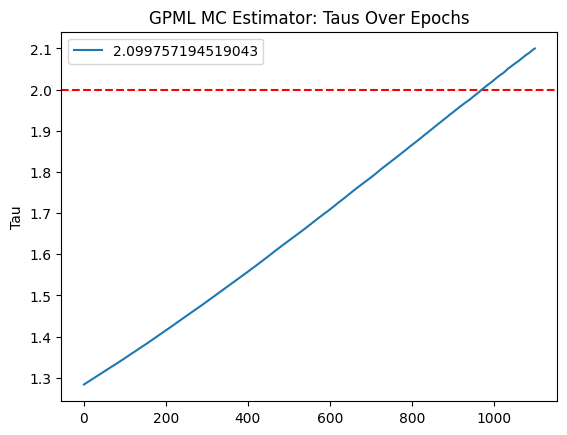

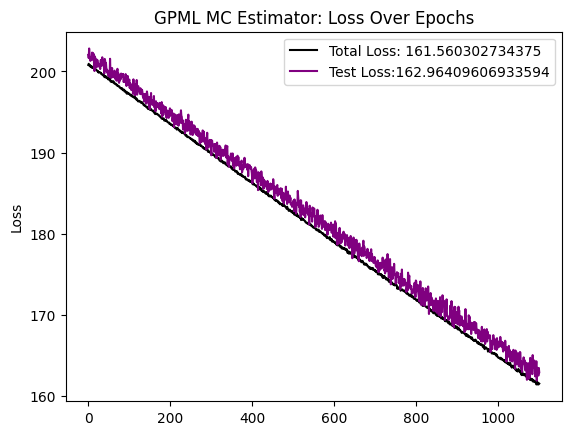

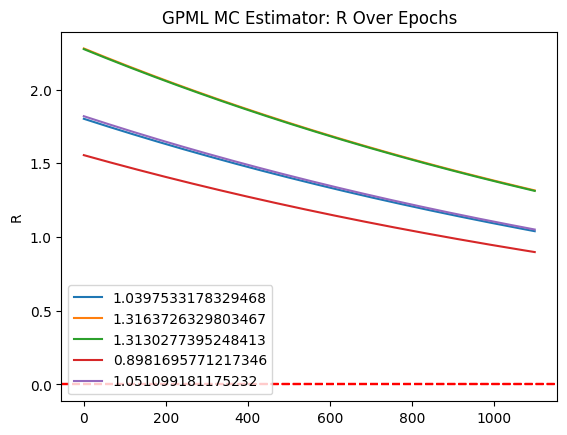

MC Fit:   1%|          | 1200/100000 [23:08<31:39:03,  1.15s/it]

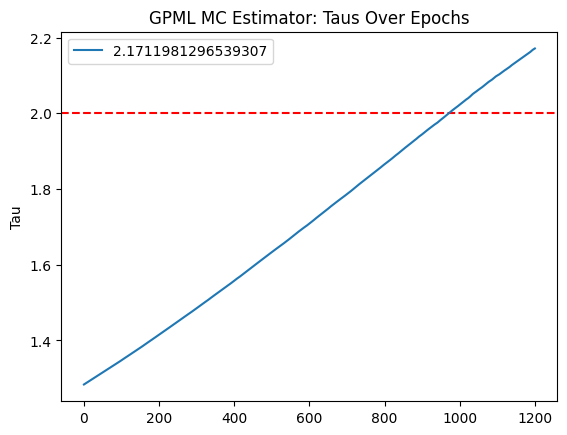

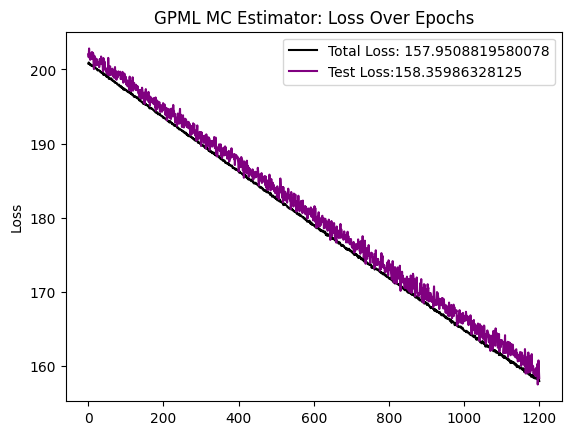

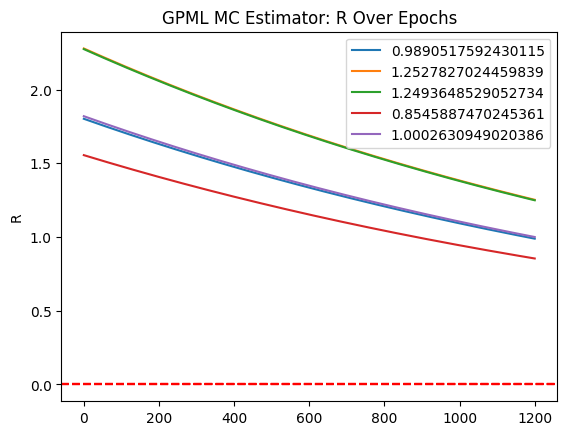

MC Fit:   1%|▏         | 1300/100000 [25:04<31:33:41,  1.15s/it]

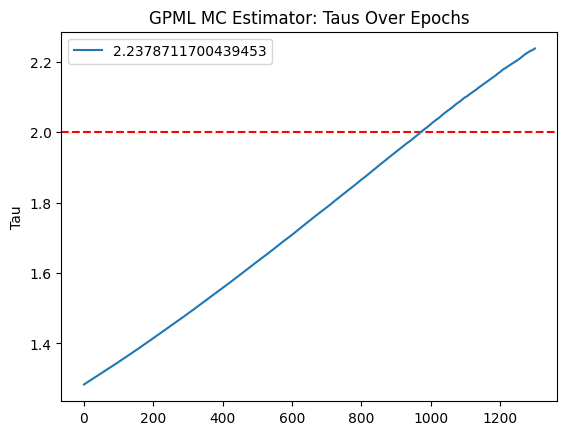

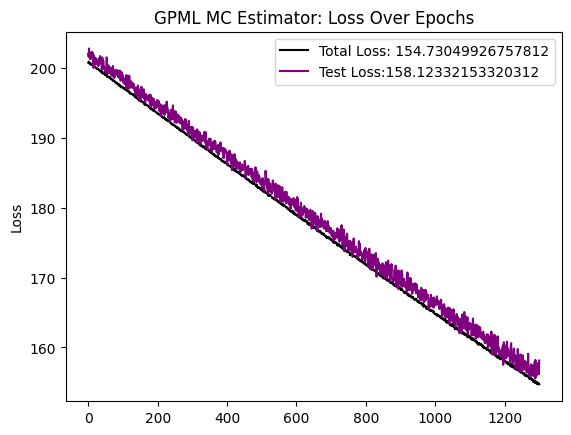

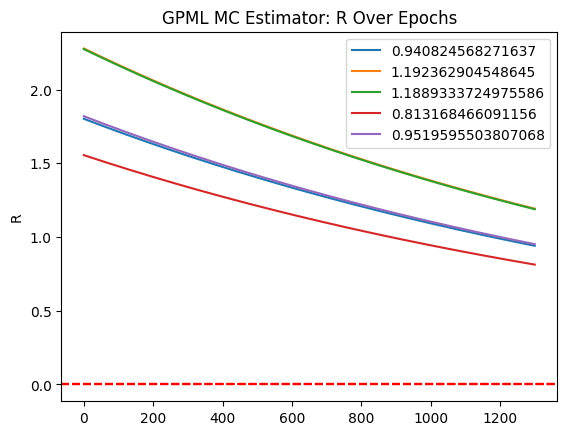

MC Fit:   1%|▏         | 1400/100000 [27:00<31:34:49,  1.15s/it]

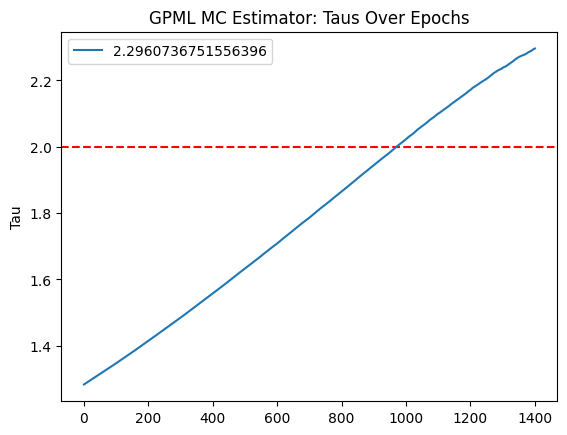

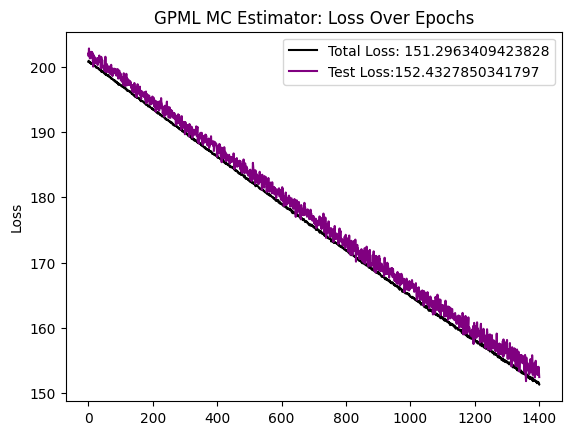

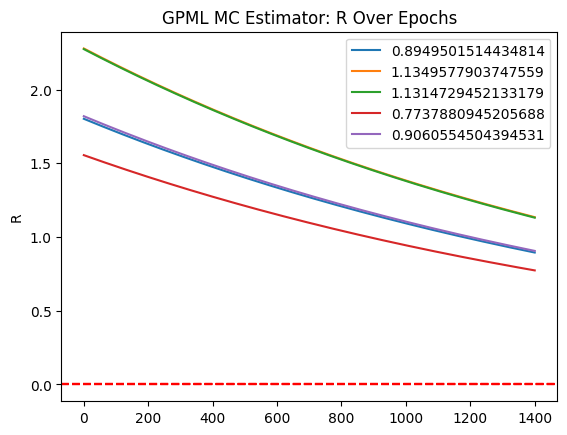

MC Fit:   2%|▏         | 1500/100000 [28:56<31:33:29,  1.15s/it]

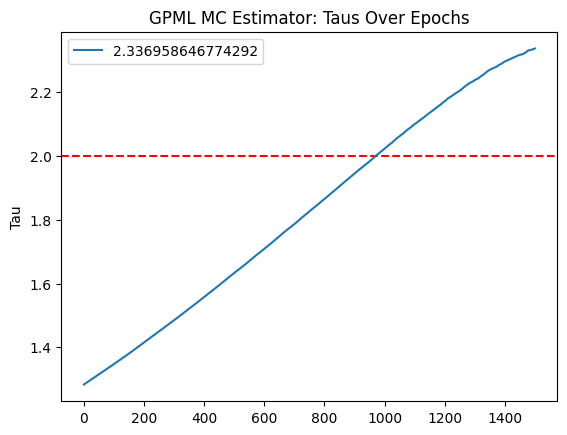

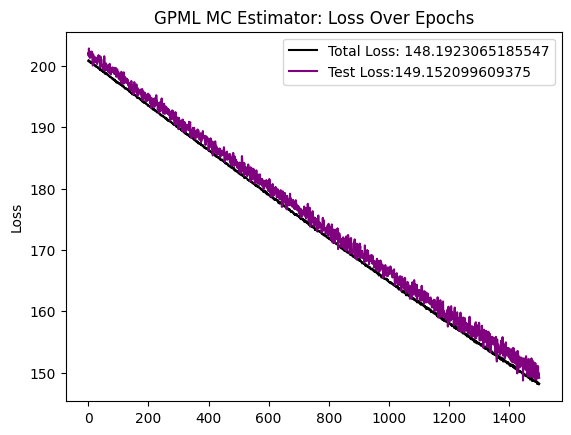

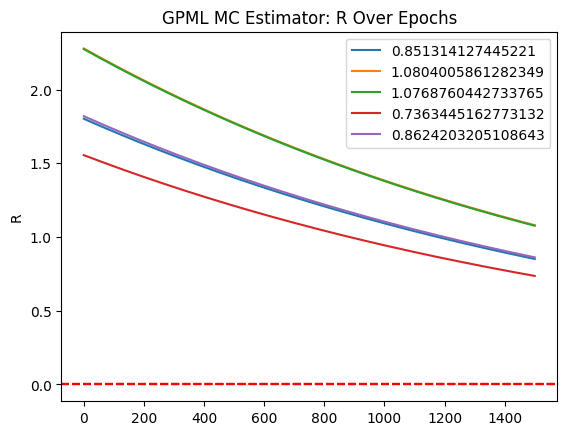

MC Fit:   2%|▏         | 1600/100000 [30:53<31:31:46,  1.15s/it]

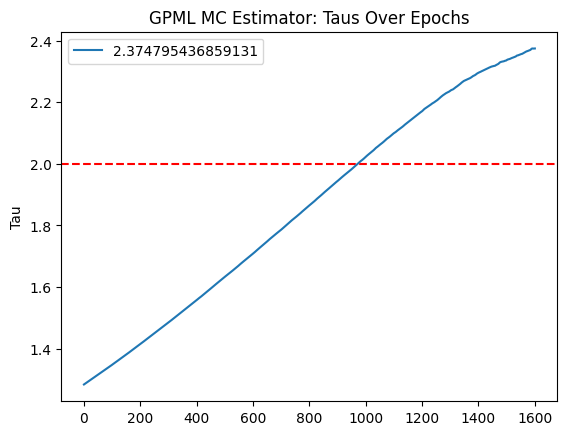

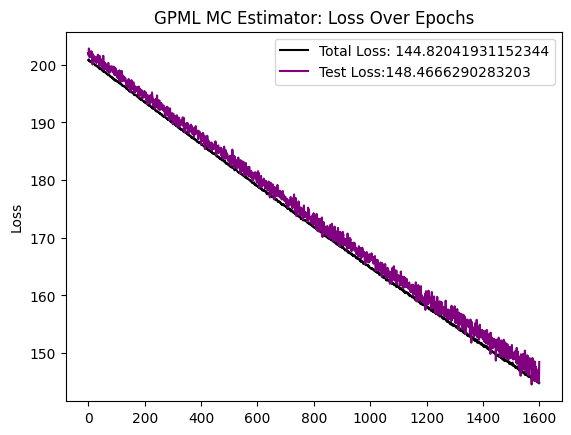

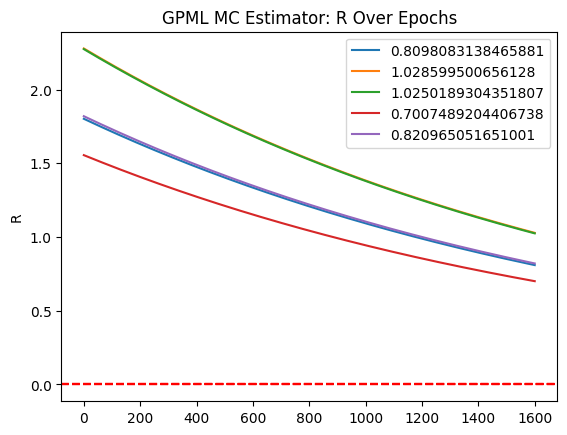

MC Fit:   2%|▏         | 1700/100000 [32:49<31:30:42,  1.15s/it]

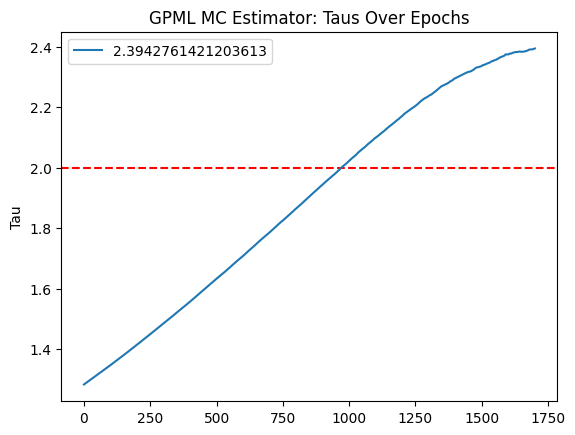

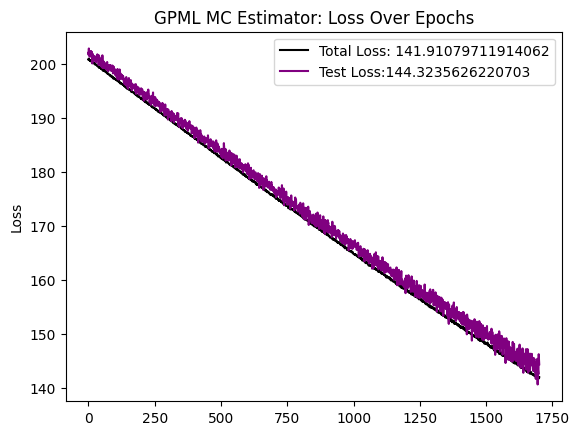

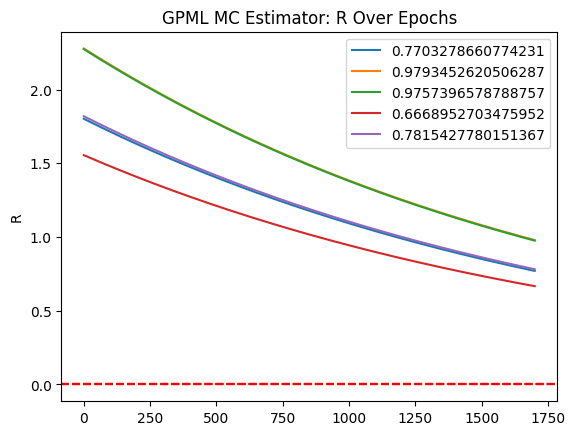

MC Fit:   2%|▏         | 1800/100000 [34:45<31:28:20,  1.15s/it]

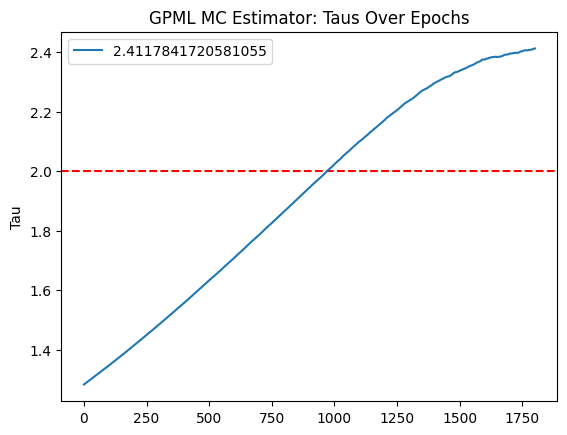

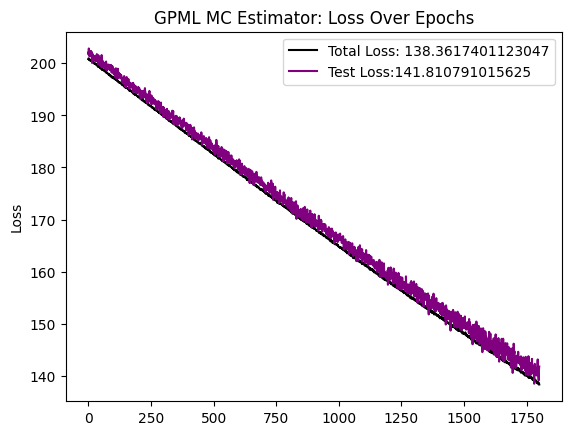

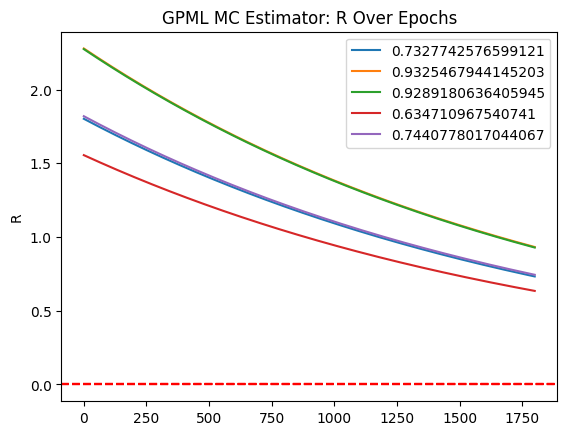

MC Fit:   2%|▏         | 1900/100000 [36:42<31:26:55,  1.15s/it]

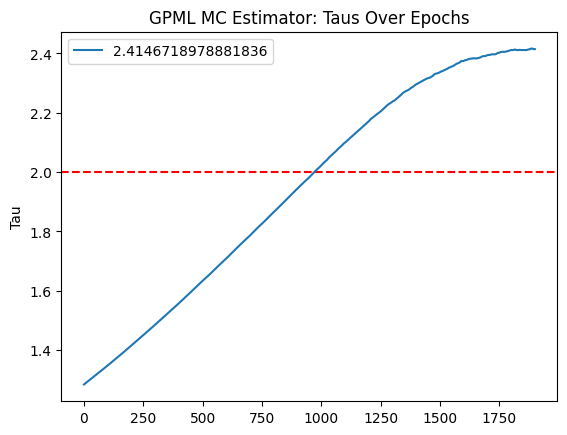

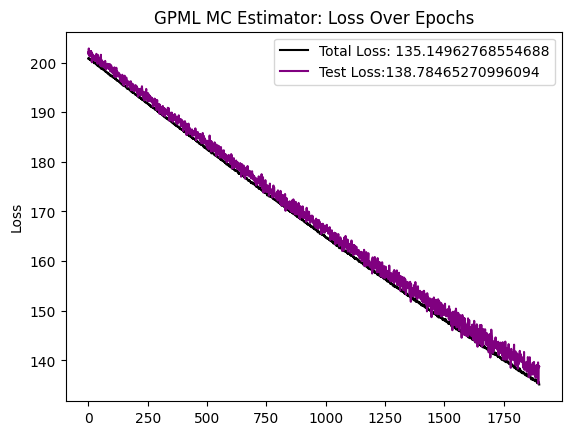

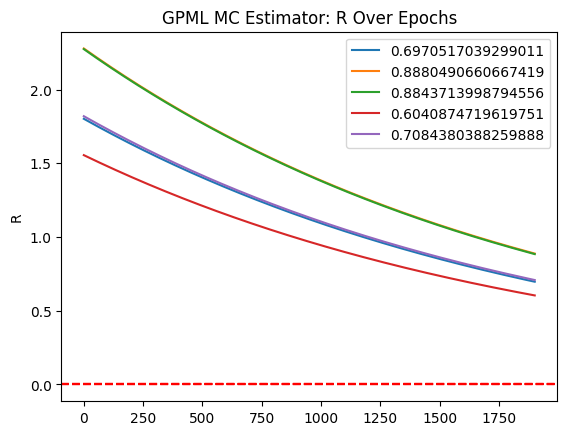

MC Fit:   2%|▏         | 2000/100000 [38:38<31:26:16,  1.15s/it]

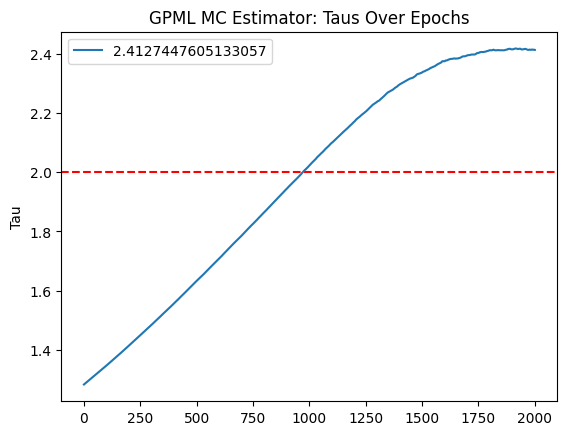

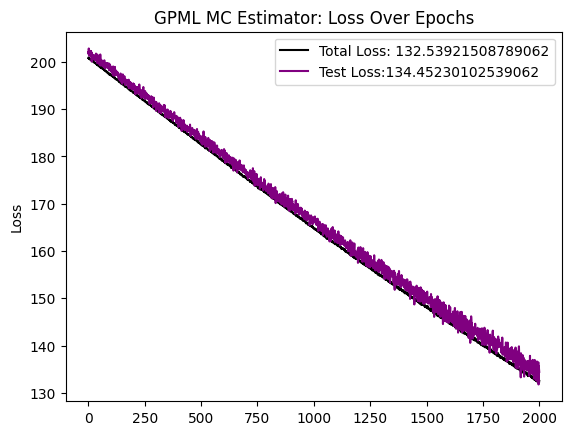

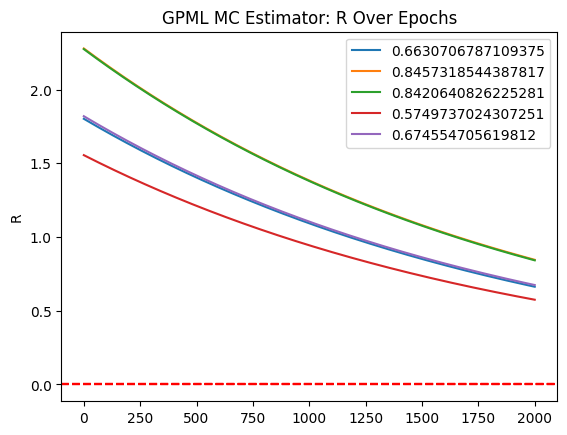

MC Fit:   2%|▏         | 2100/100000 [40:35<31:22:57,  1.15s/it]

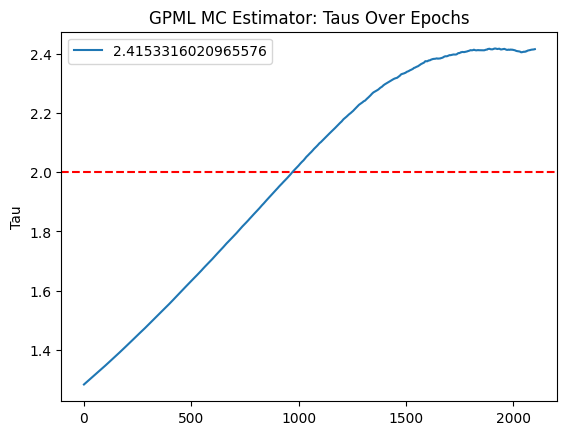

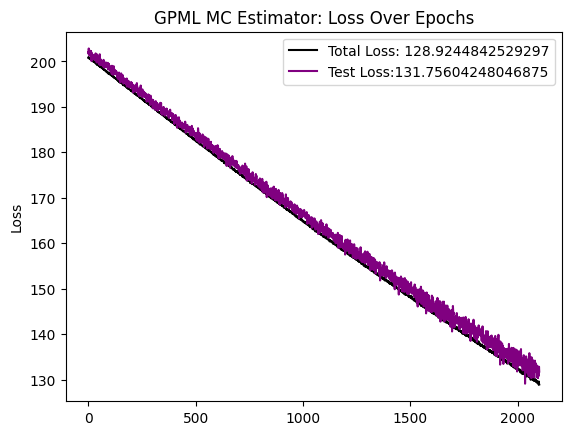

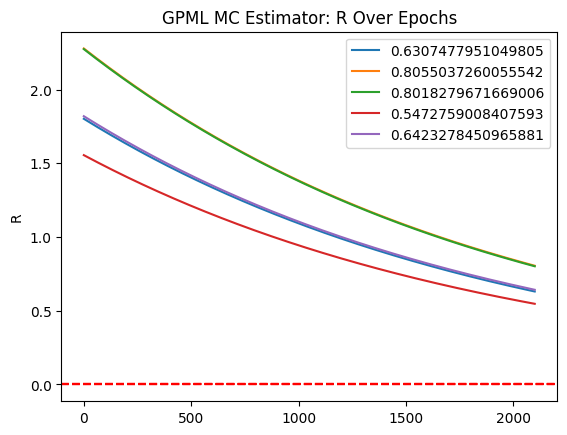

MC Fit:   2%|▏         | 2200/100000 [42:31<31:23:05,  1.16s/it]

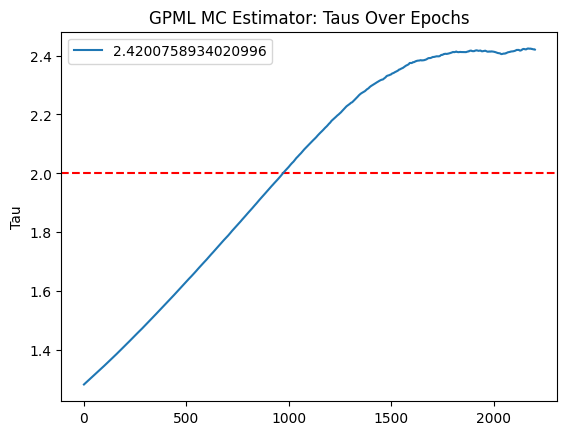

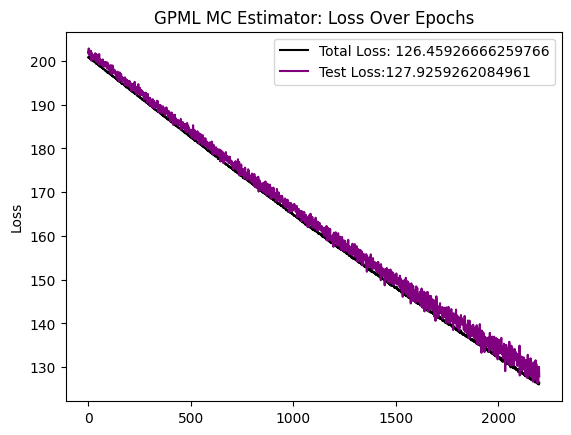

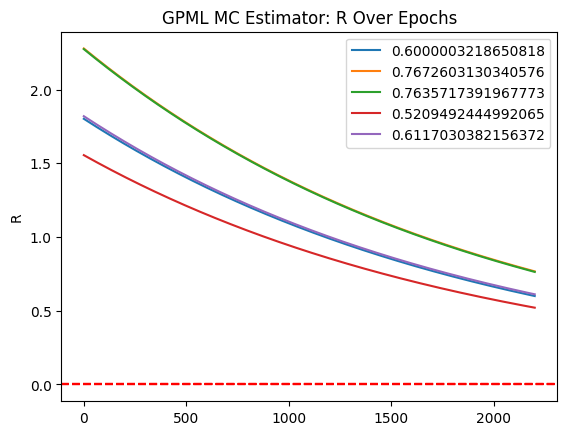

MC Fit:   2%|▏         | 2300/100000 [44:27<31:20:25,  1.15s/it]

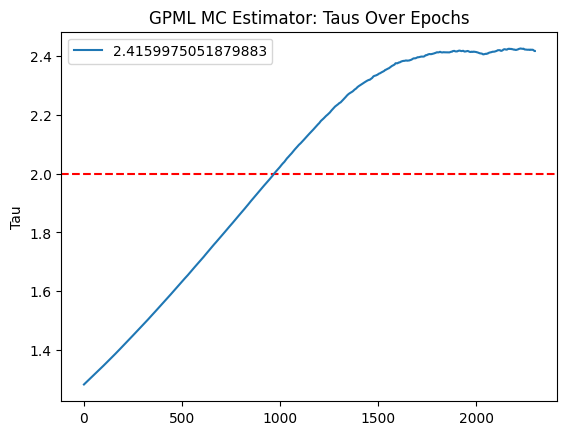

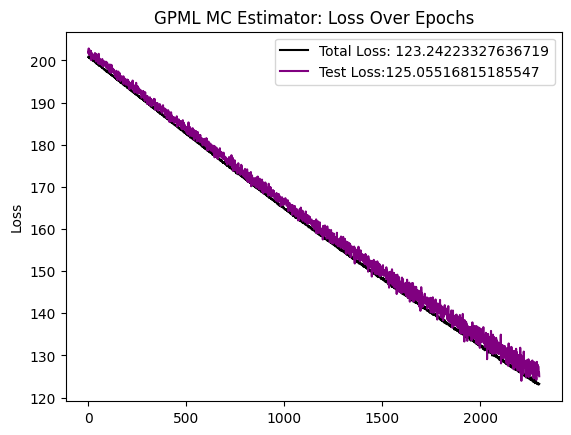

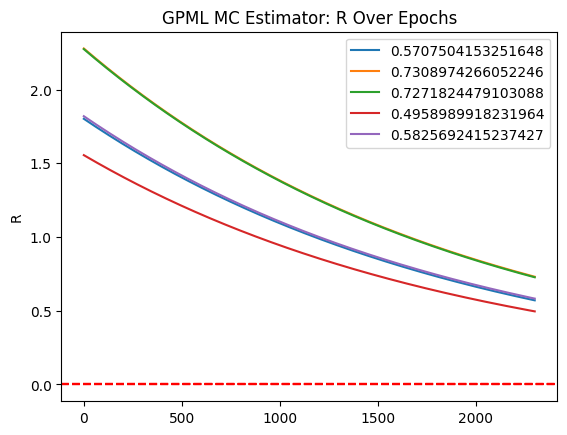

MC Fit:   2%|▏         | 2400/100000 [46:23<31:16:29,  1.15s/it]

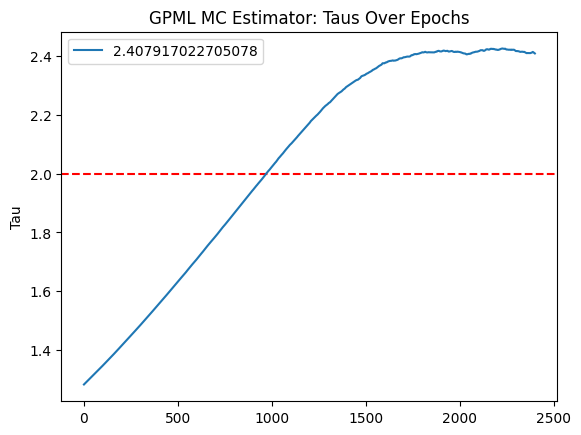

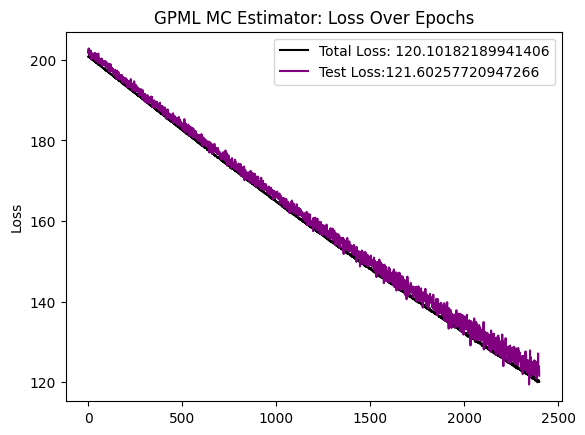

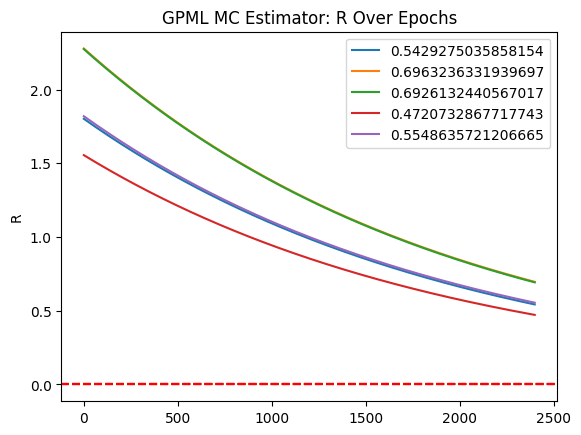

MC Fit:   2%|▎         | 2500/100000 [48:20<31:15:56,  1.15s/it]

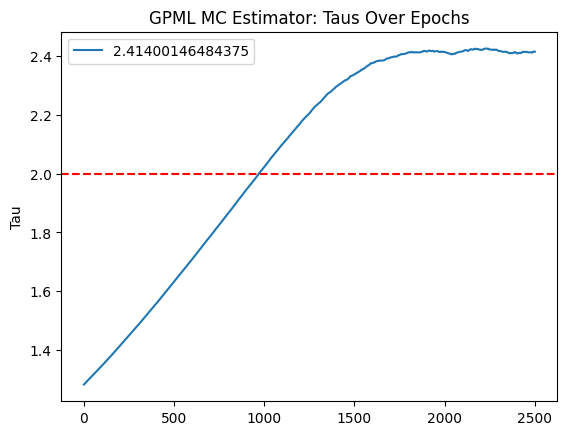

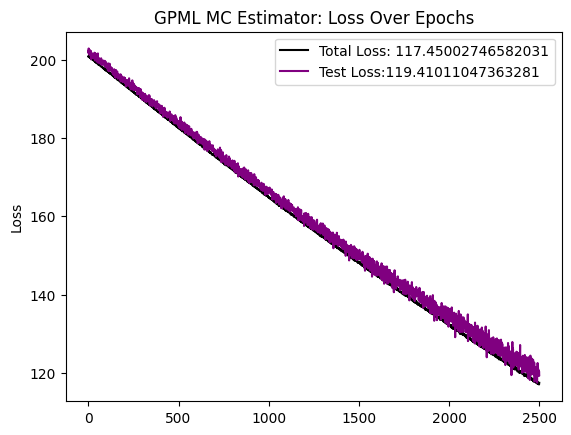

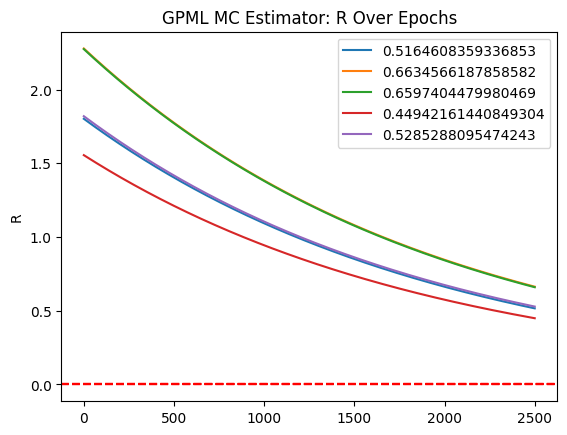

MC Fit:   3%|▎         | 2600/100000 [50:17<31:29:47,  1.16s/it]

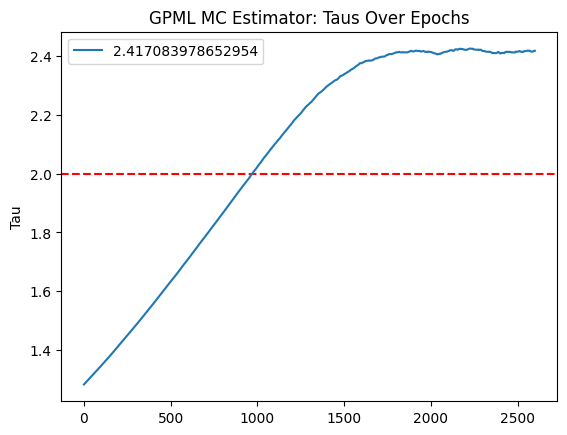

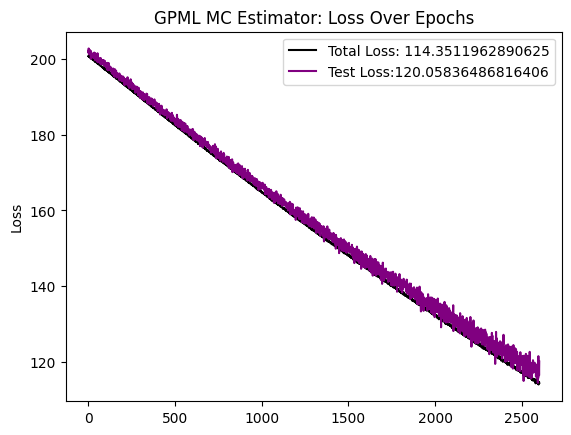

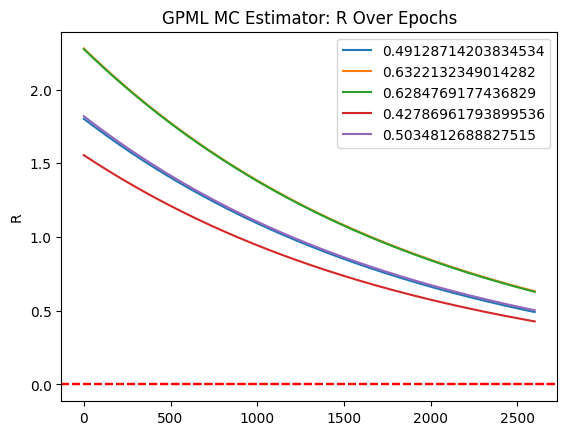

MC Fit:   3%|▎         | 2700/100000 [52:13<31:13:33,  1.16s/it]

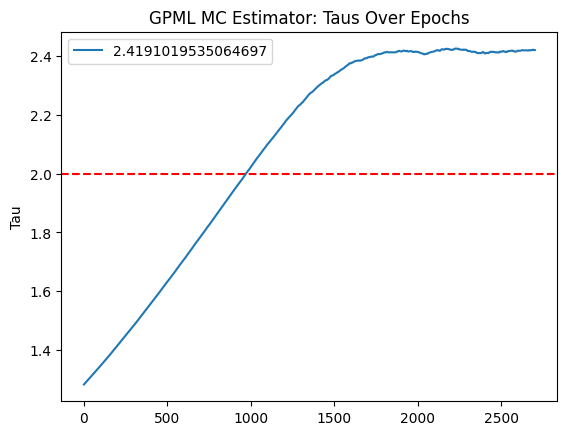

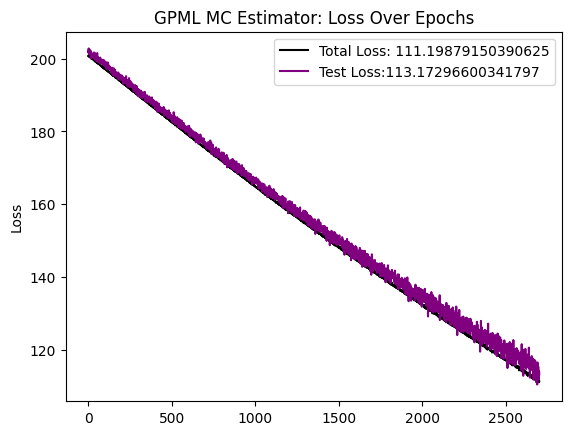

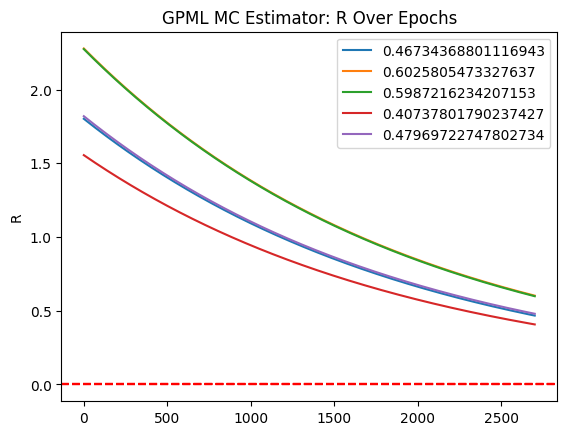

MC Fit:   3%|▎         | 2800/100000 [54:10<31:10:21,  1.15s/it]

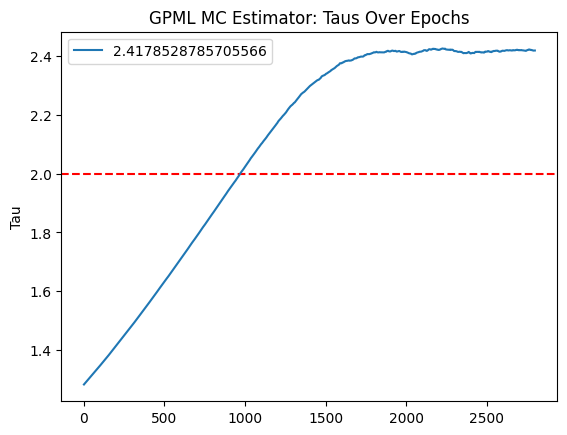

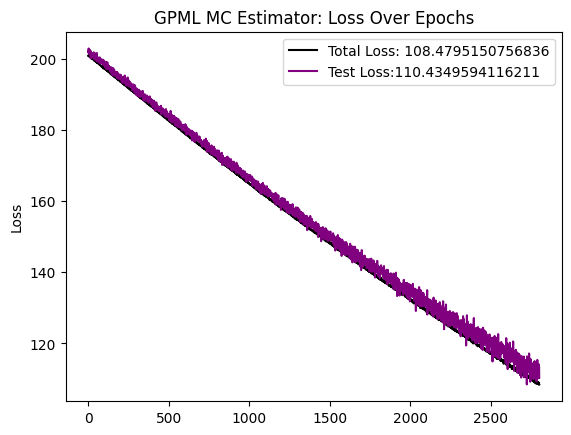

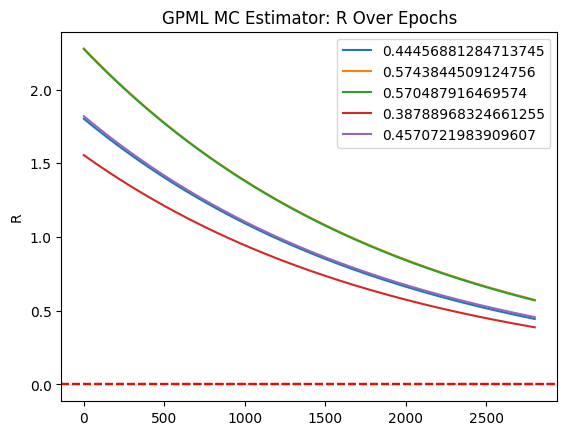

MC Fit:   3%|▎         | 2900/100000 [56:06<31:10:29,  1.16s/it]

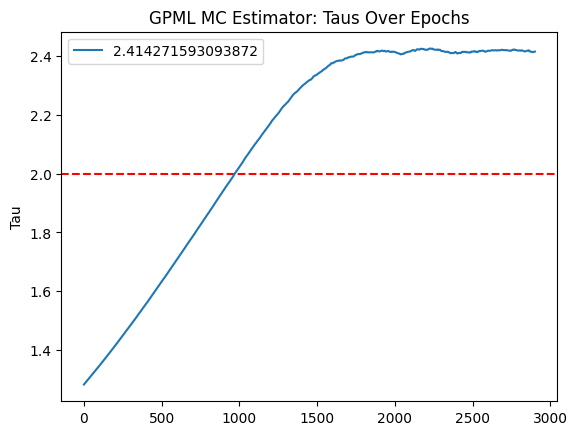

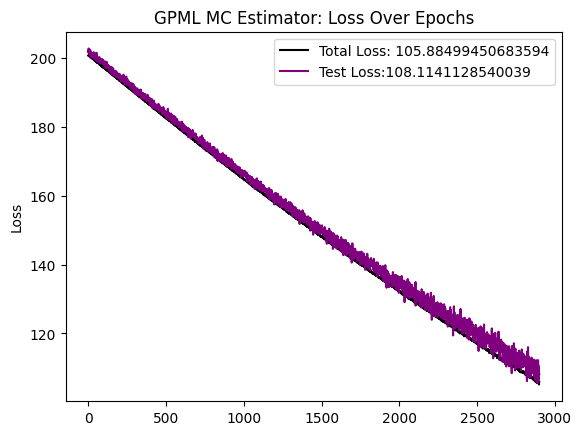

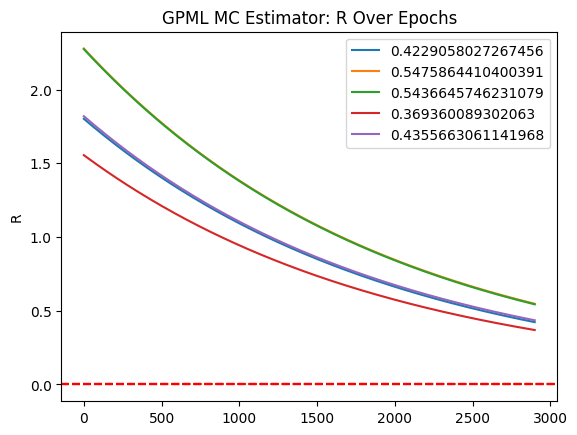

MC Fit:   3%|▎         | 3000/100000 [58:02<31:05:11,  1.15s/it]

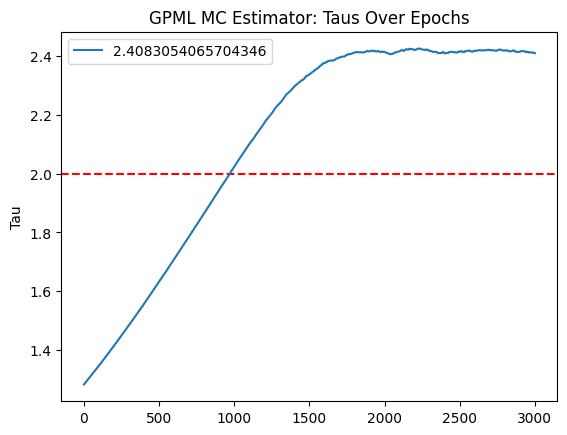

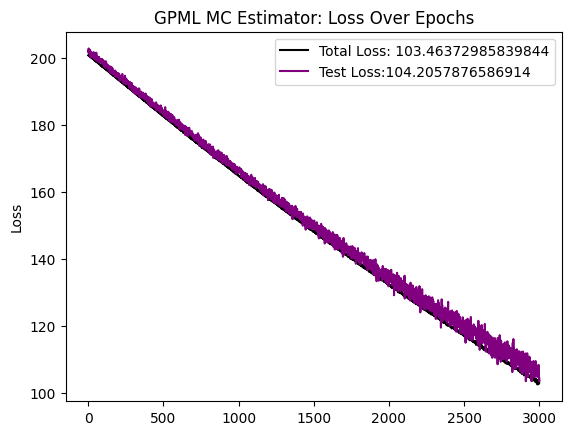

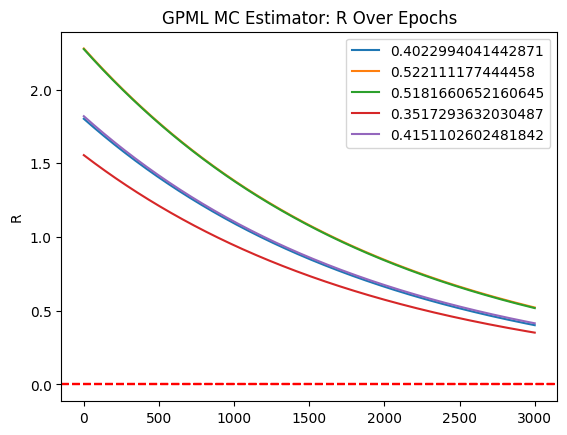

MC Fit:   3%|▎         | 3100/100000 [59:59<31:03:52,  1.15s/it]

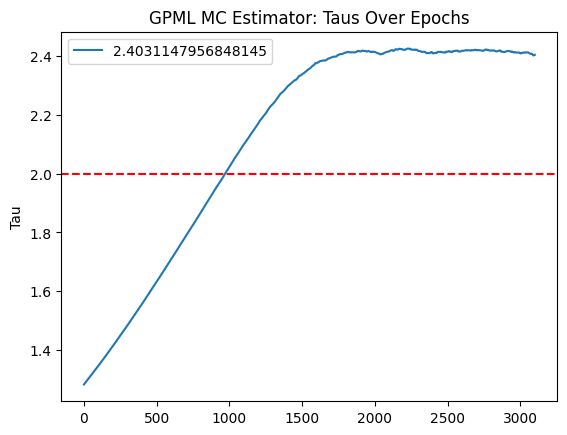

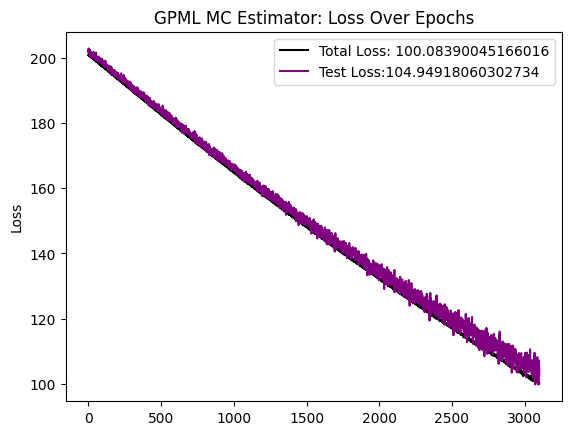

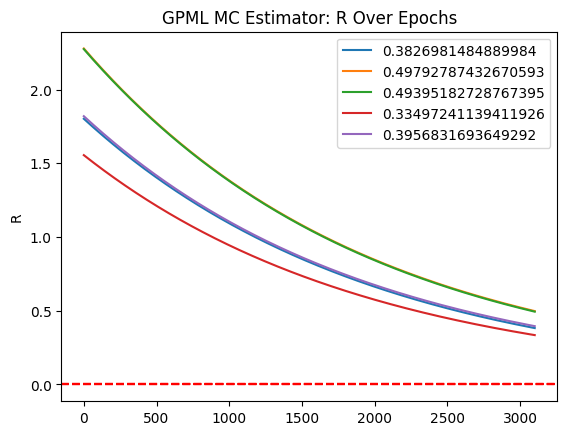

MC Fit:   3%|▎         | 3200/100000 [1:01:55<30:56:00,  1.15s/it]

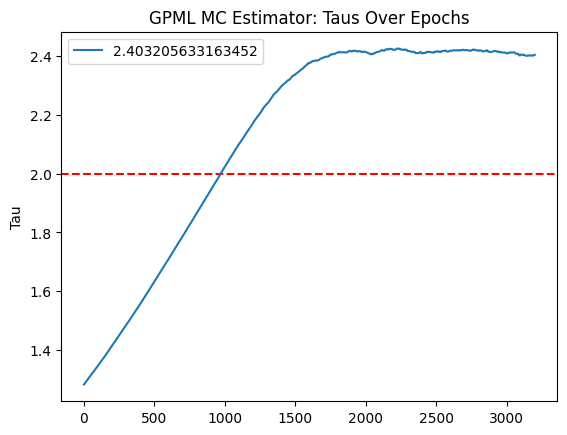

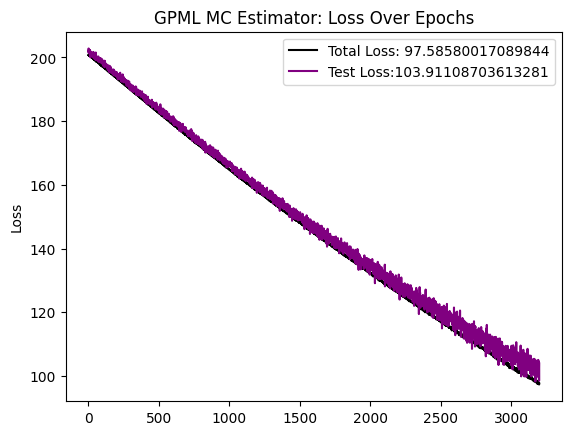

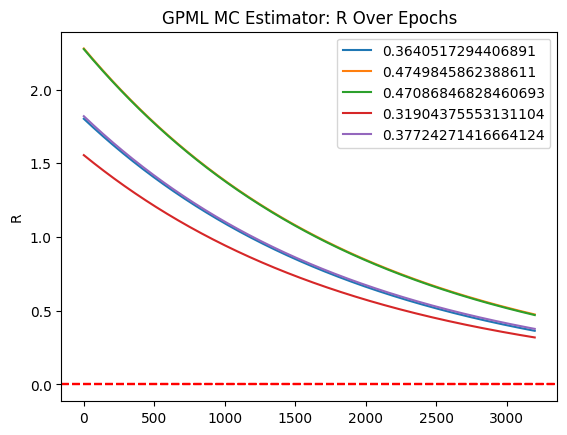

MC Fit:   3%|▎         | 3300/100000 [1:03:51<30:59:43,  1.15s/it]

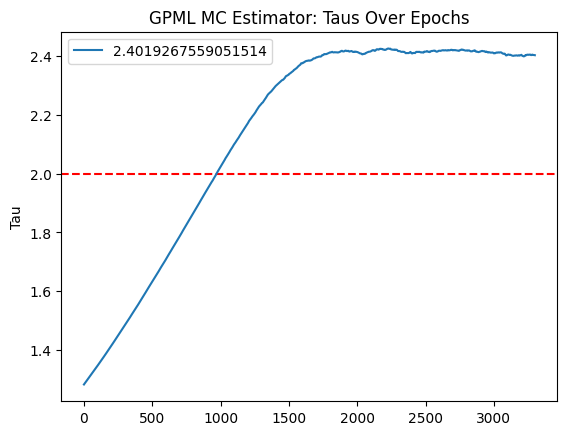

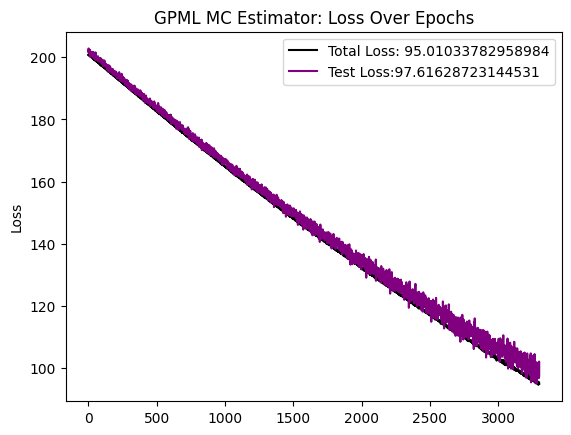

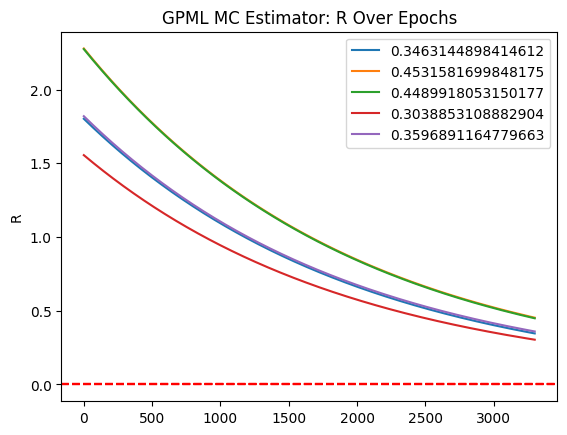

MC Fit:   3%|▎         | 3400/100000 [1:05:48<30:52:57,  1.15s/it]

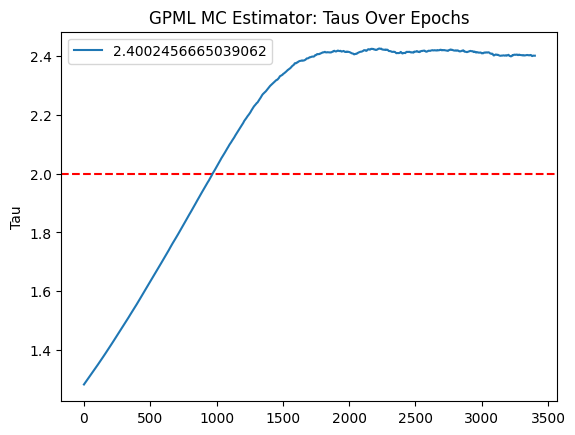

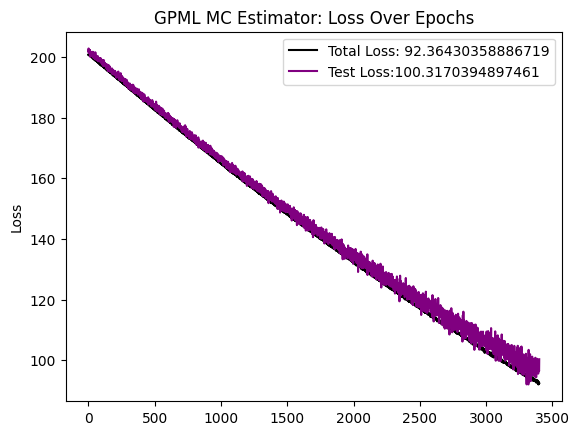

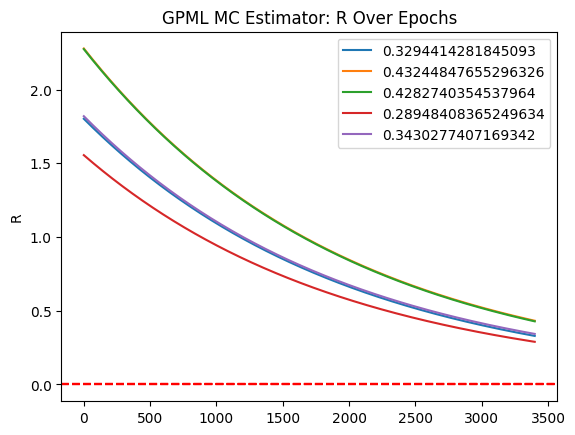

MC Fit:   4%|▎         | 3500/100000 [1:07:44<30:55:43,  1.15s/it]

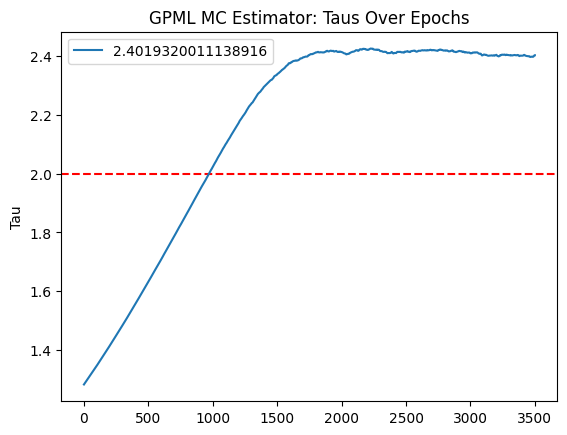

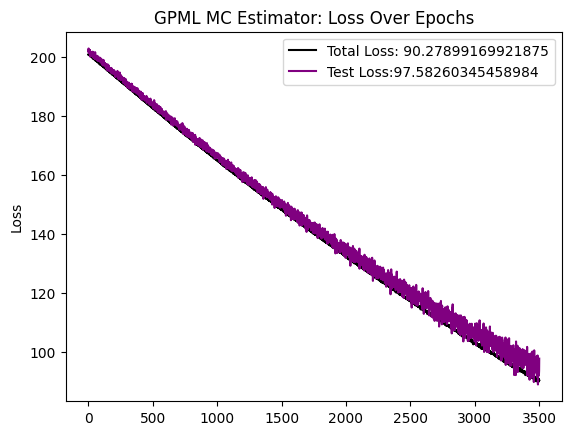

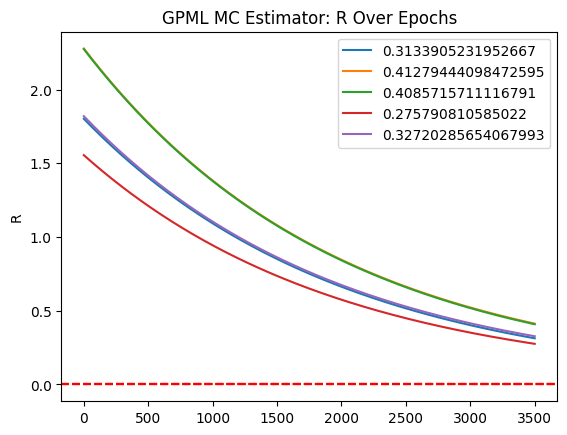

MC Fit:   4%|▎         | 3600/100000 [1:09:40<30:52:39,  1.15s/it]

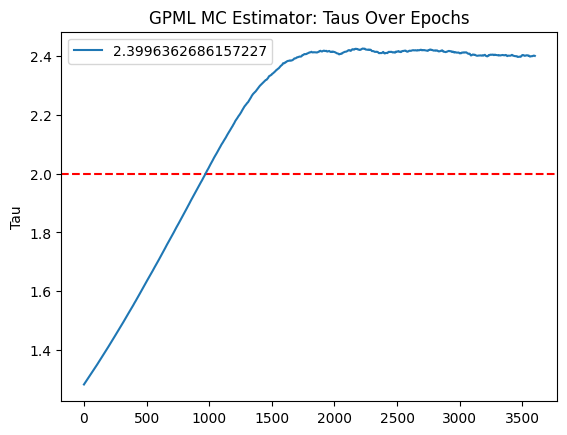

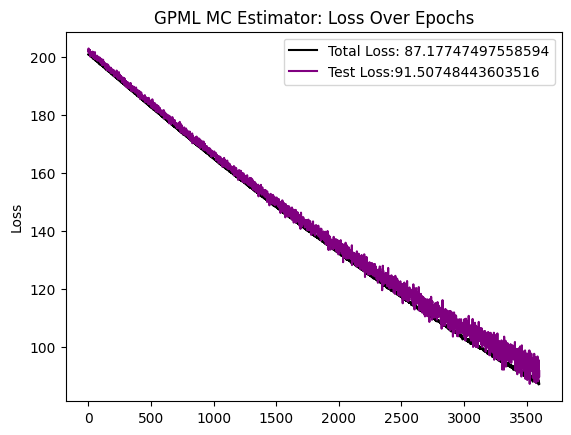

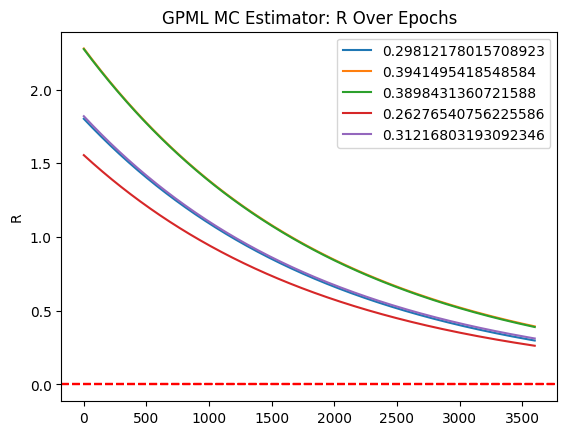

MC Fit:   4%|▎         | 3700/100000 [1:11:36<30:47:13,  1.15s/it]

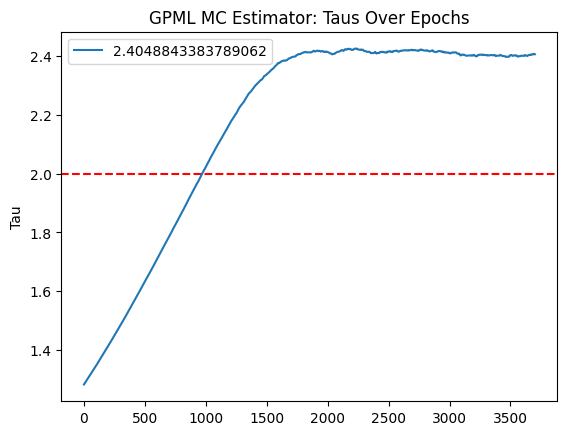

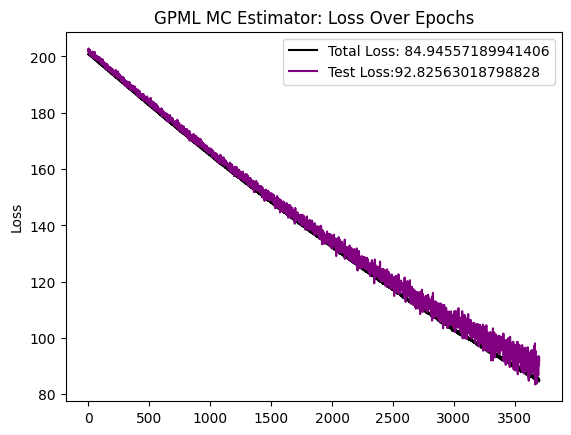

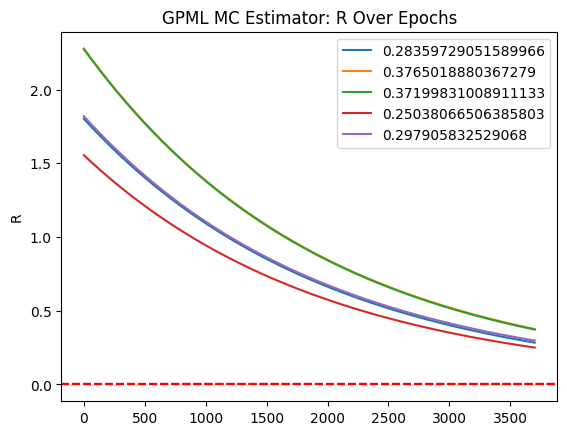

MC Fit:   4%|▍         | 3800/100000 [1:13:32<30:44:18,  1.15s/it]

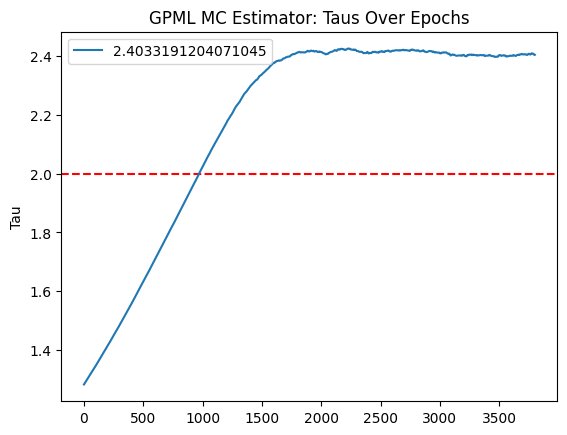

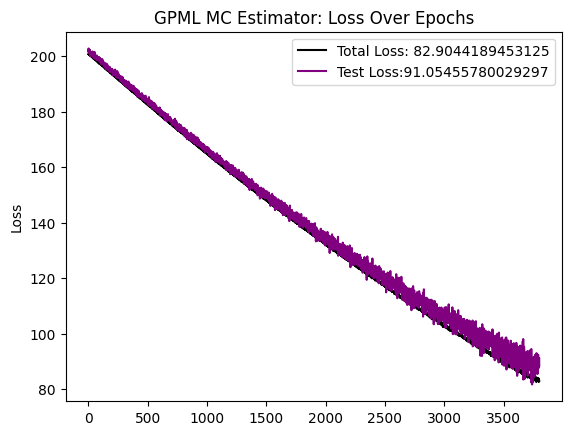

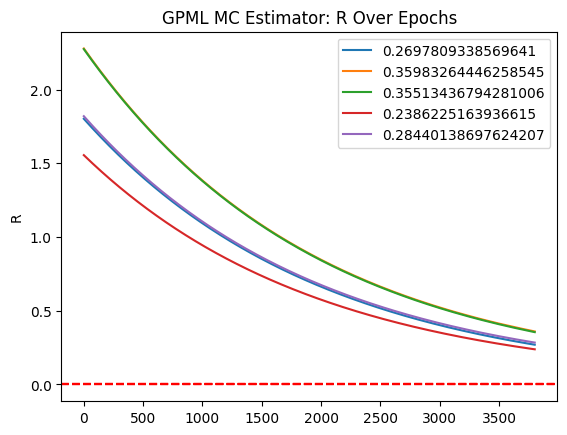

MC Fit:   4%|▍         | 3900/100000 [1:15:28<30:39:10,  1.15s/it]

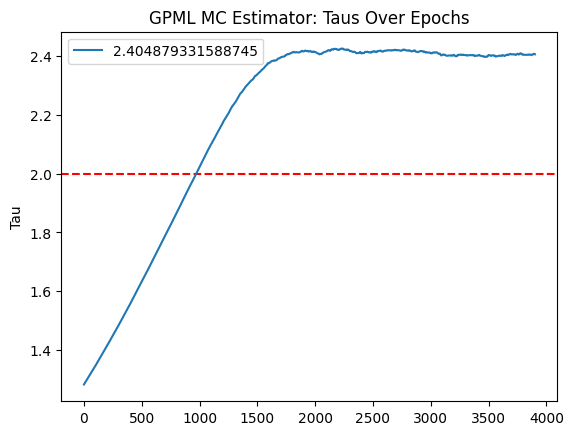

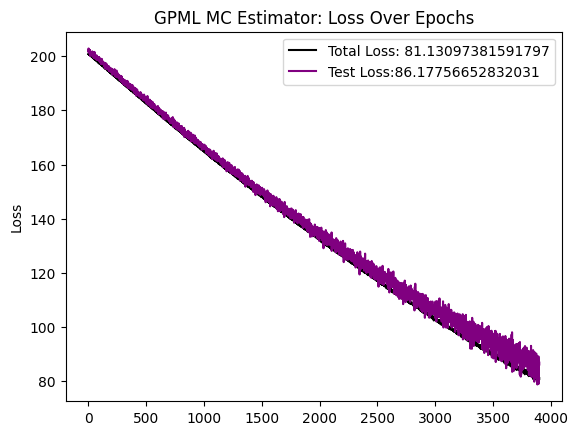

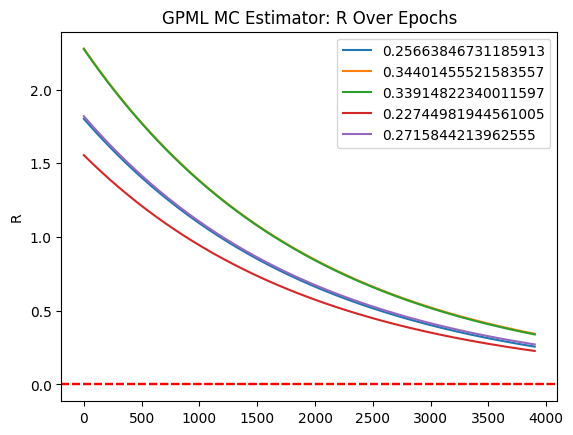

MC Fit:   4%|▍         | 4000/100000 [1:17:24<30:38:50,  1.15s/it]

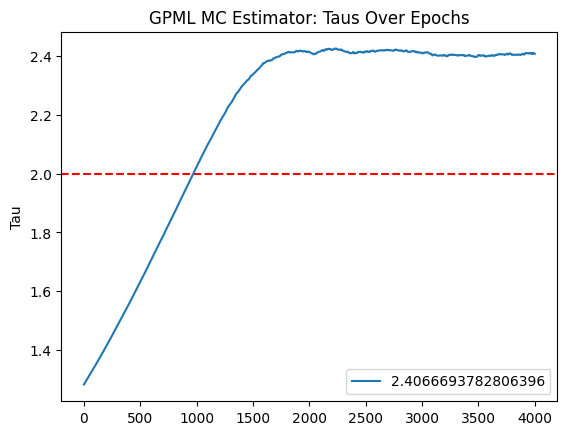

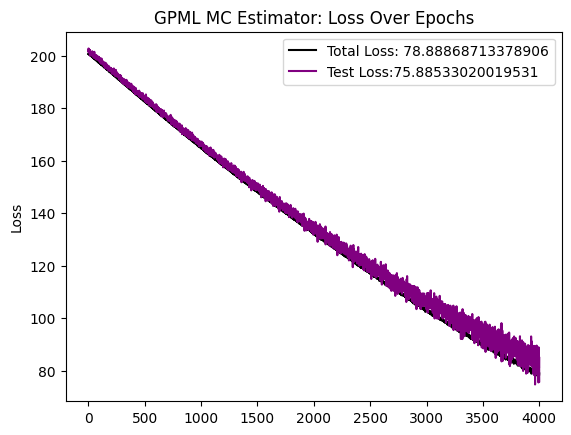

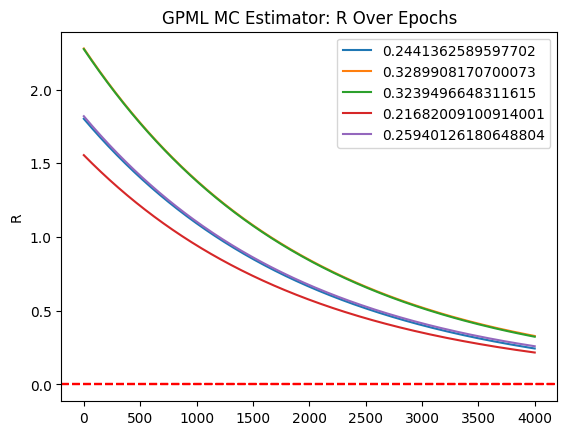

MC Fit:   4%|▍         | 4100/100000 [1:19:19<30:33:35,  1.15s/it]

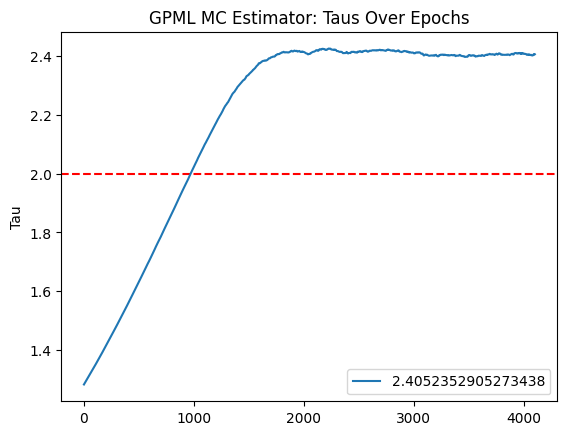

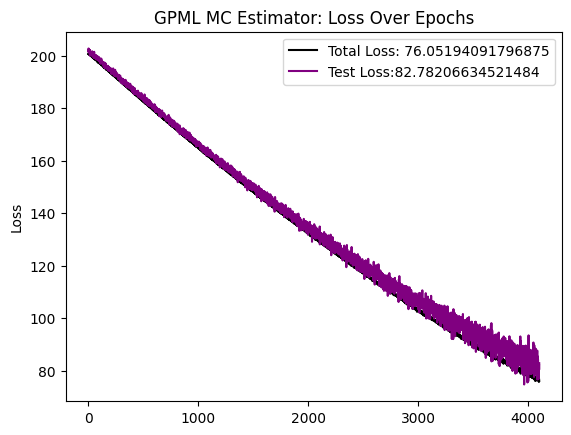

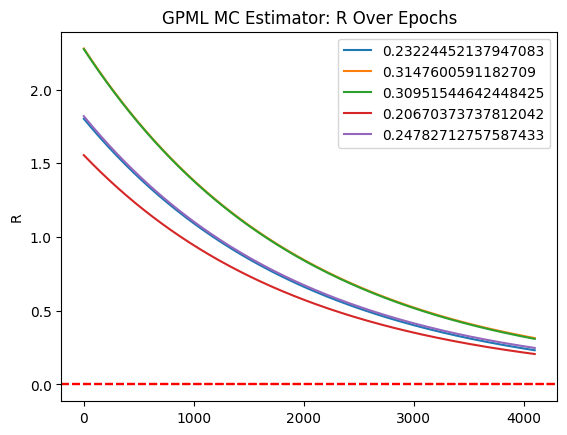

MC Fit:   4%|▍         | 4200/100000 [1:21:15<30:33:45,  1.15s/it]

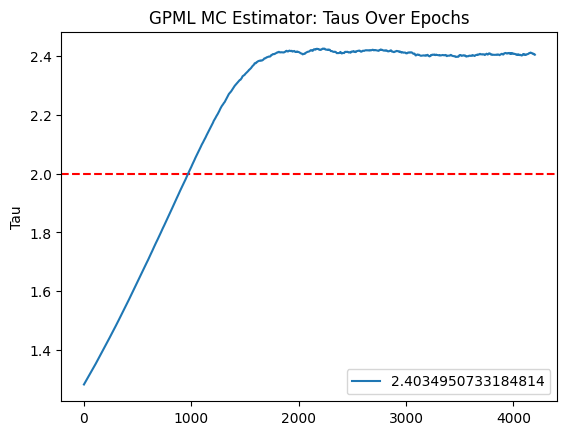

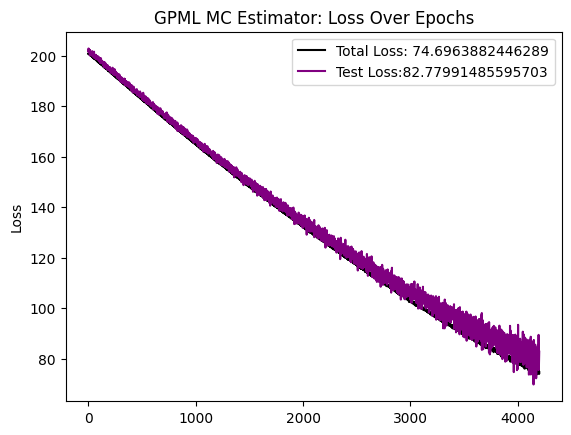

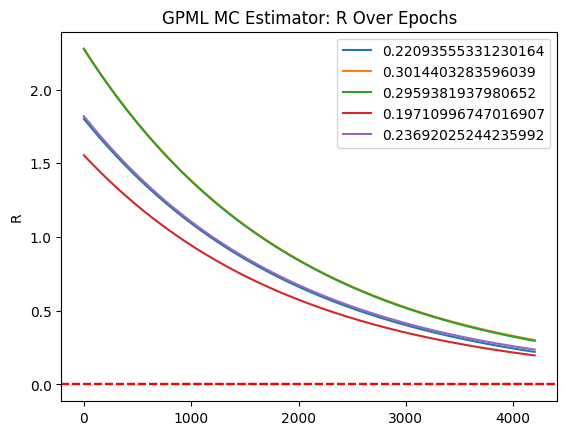

MC Fit:   4%|▍         | 4300/100000 [1:23:11<30:26:18,  1.15s/it]

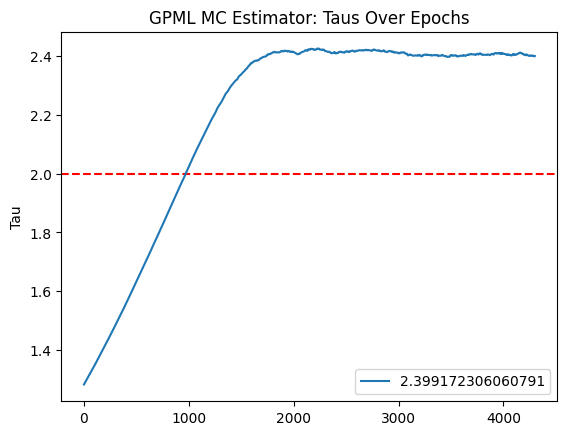

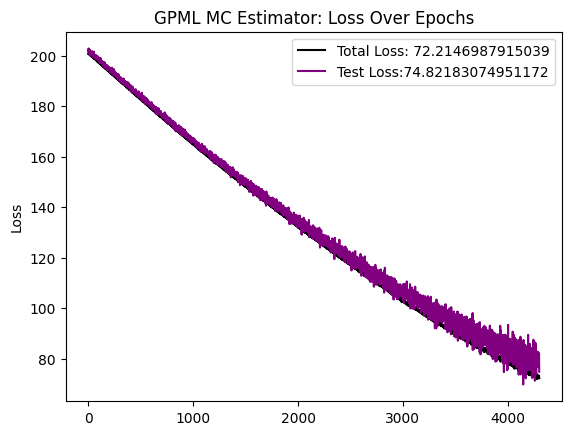

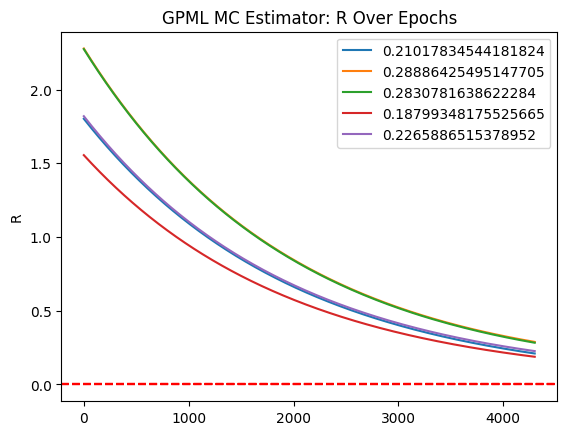

MC Fit:   4%|▍         | 4400/100000 [1:25:06<30:25:22,  1.15s/it]

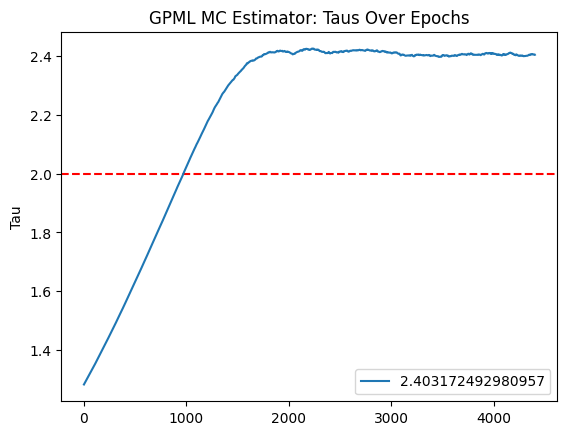

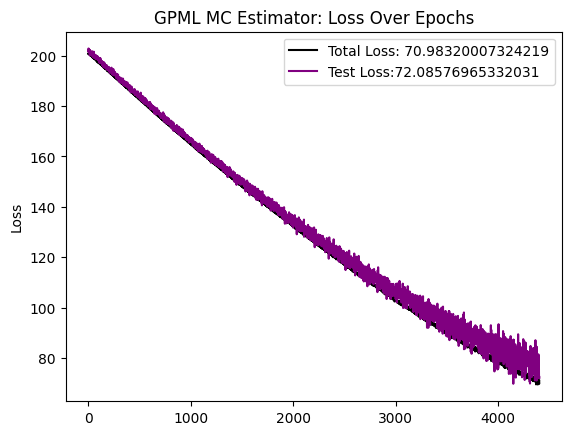

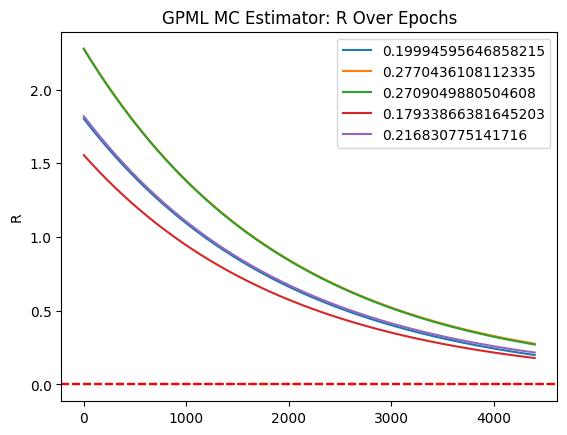

MC Fit:   4%|▍         | 4500/100000 [1:27:02<30:22:13,  1.14s/it]

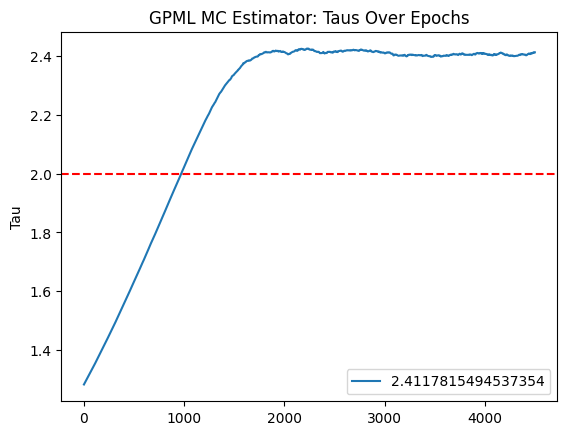

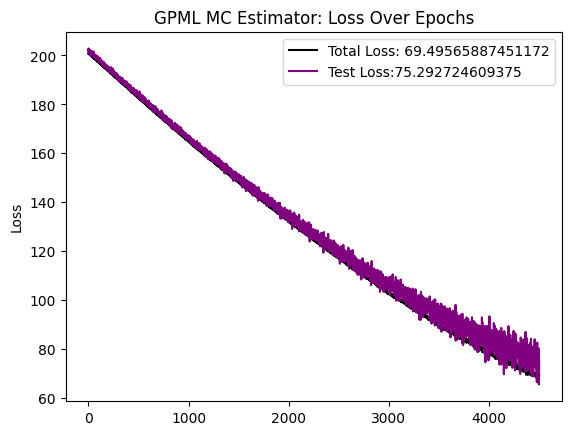

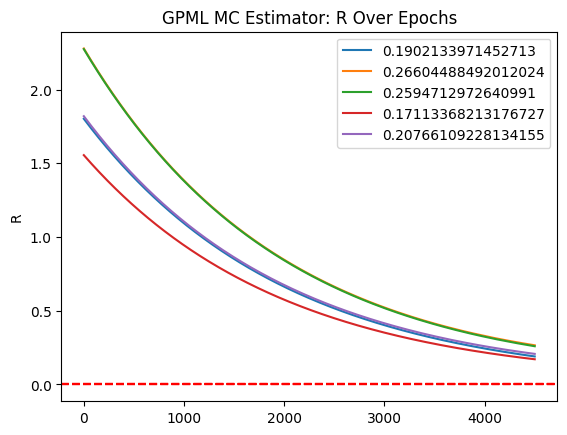

MC Fit:   5%|▍         | 4600/100000 [1:28:57<30:22:35,  1.15s/it]

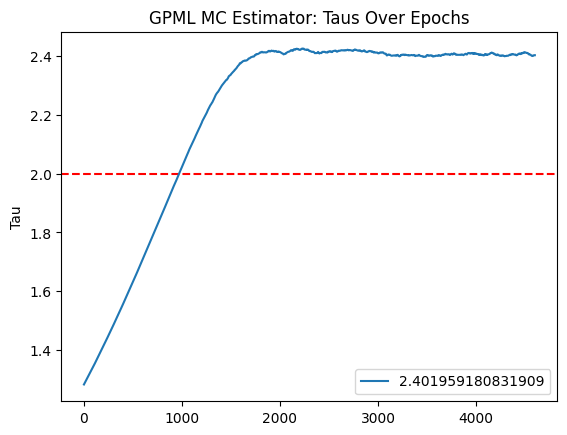

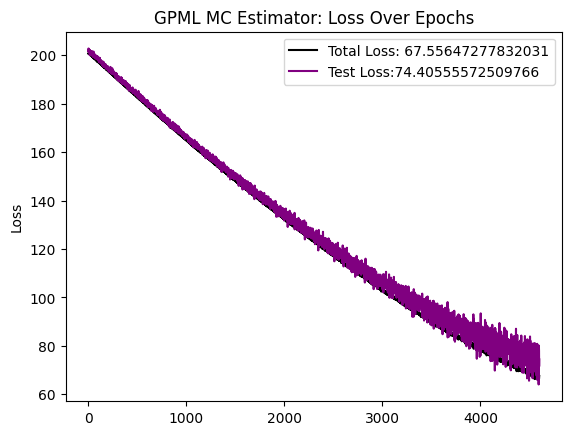

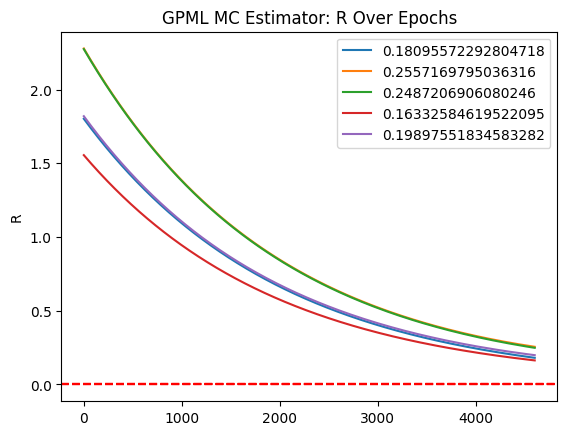

MC Fit:   5%|▍         | 4700/100000 [1:30:52<30:18:42,  1.15s/it]

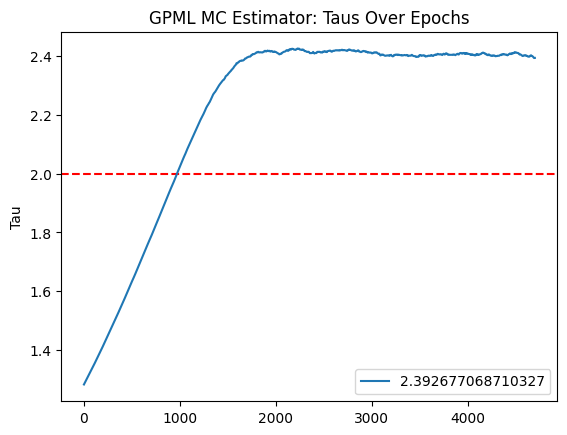

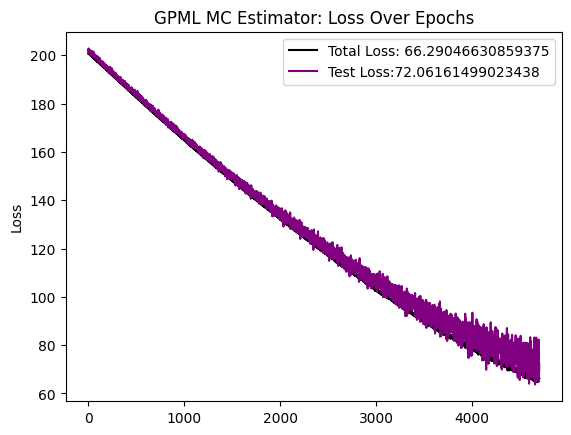

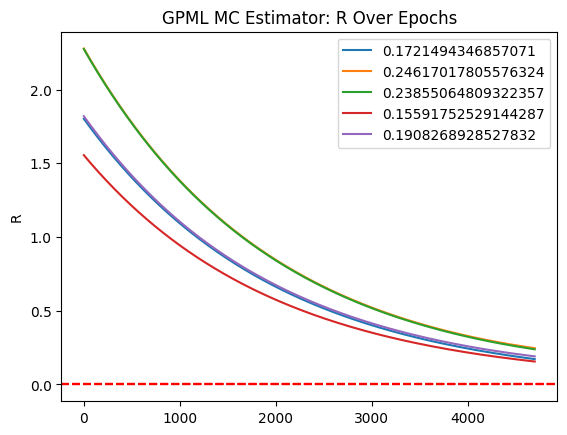

MC Fit:   5%|▍         | 4800/100000 [1:32:48<30:17:19,  1.15s/it]

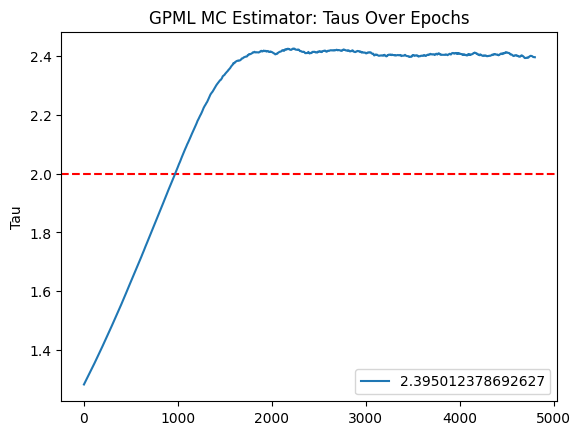

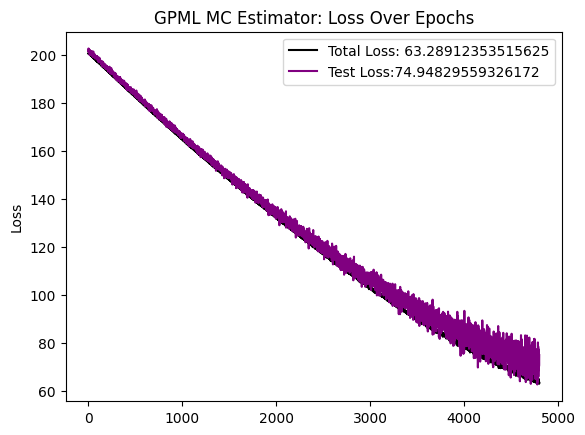

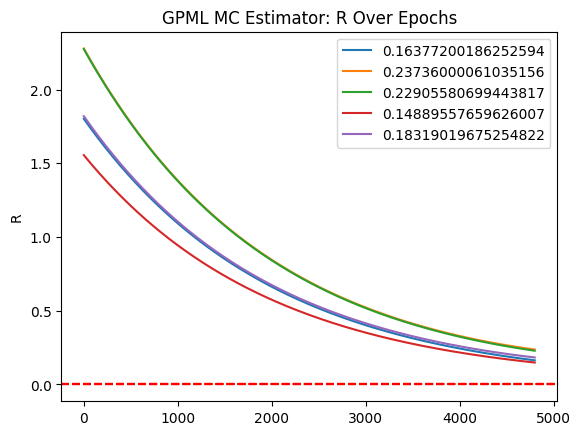

MC Fit:   5%|▍         | 4900/100000 [1:34:43<30:12:27,  1.14s/it]

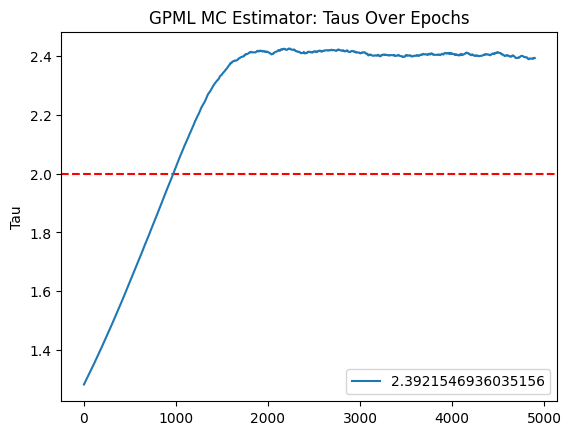

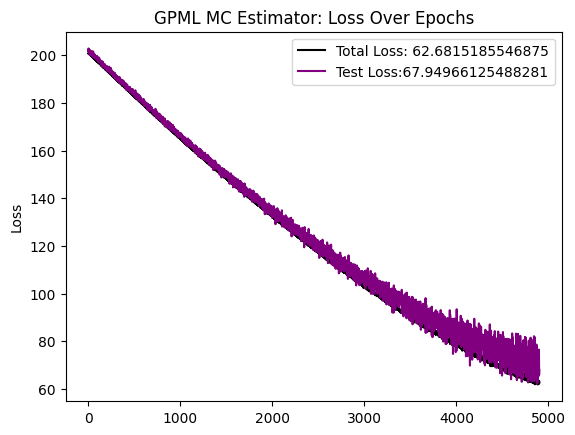

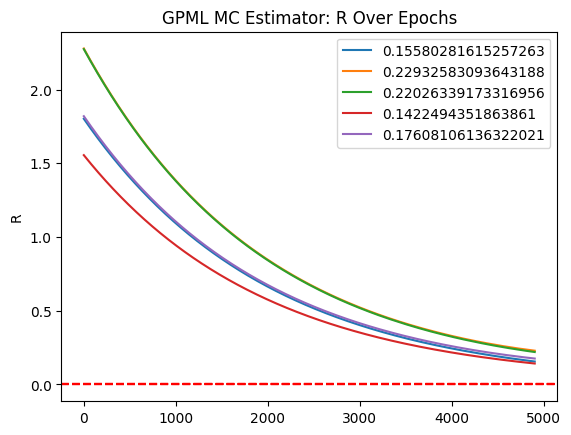

MC Fit:   5%|▌         | 5000/100000 [1:36:39<30:13:12,  1.15s/it]

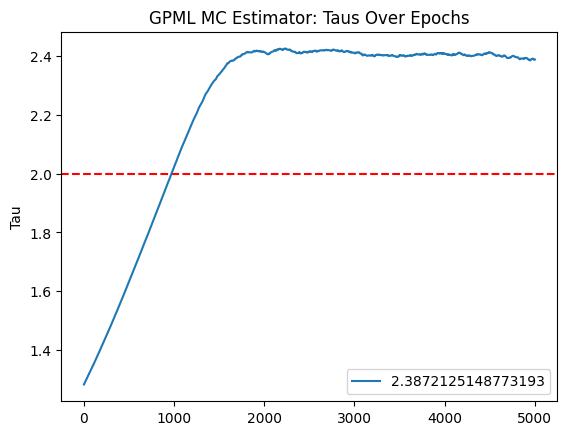

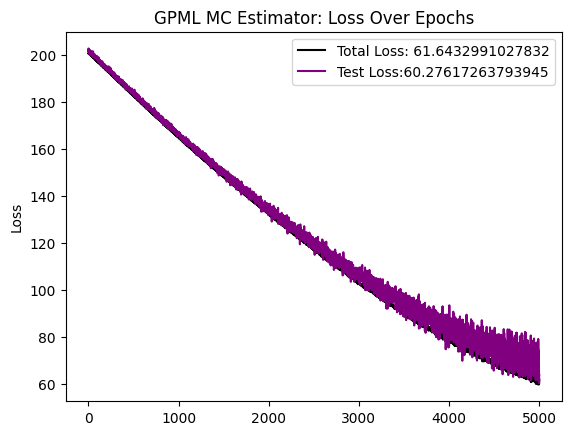

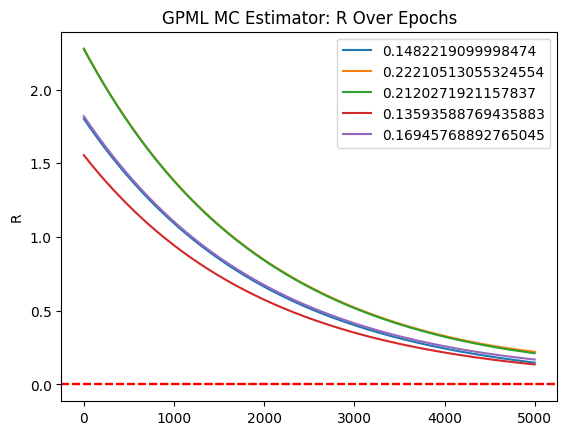

MC Fit:   5%|▌         | 5100/100000 [1:38:34<30:08:28,  1.14s/it]

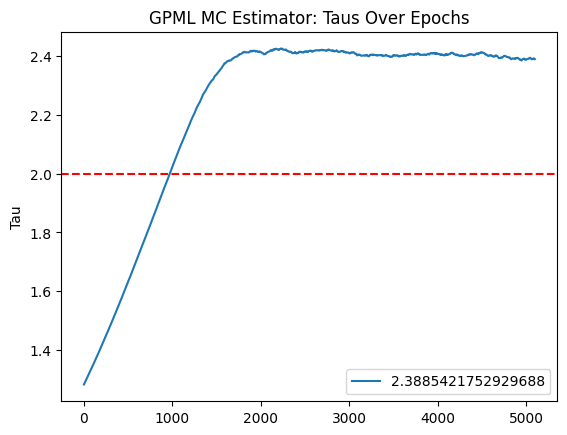

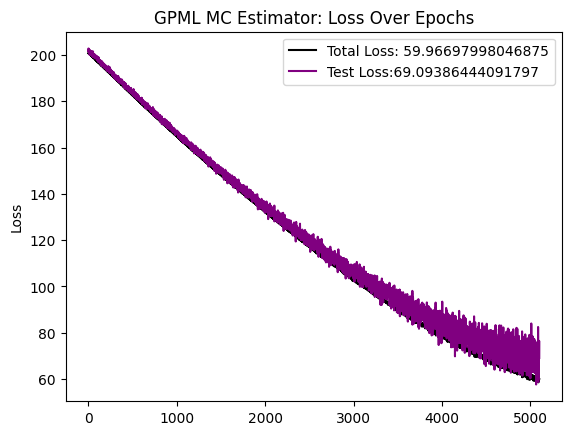

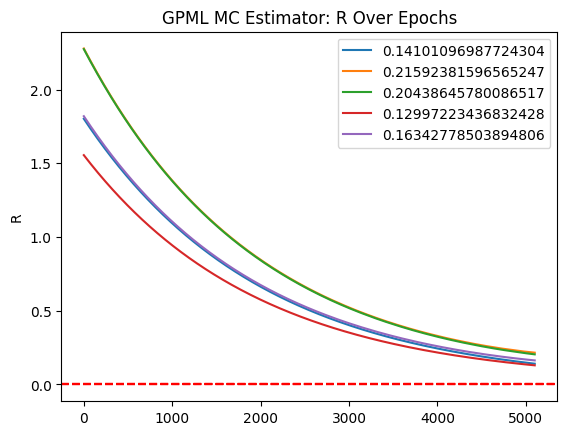

MC Fit:   5%|▌         | 5200/100000 [1:40:30<30:08:02,  1.14s/it]

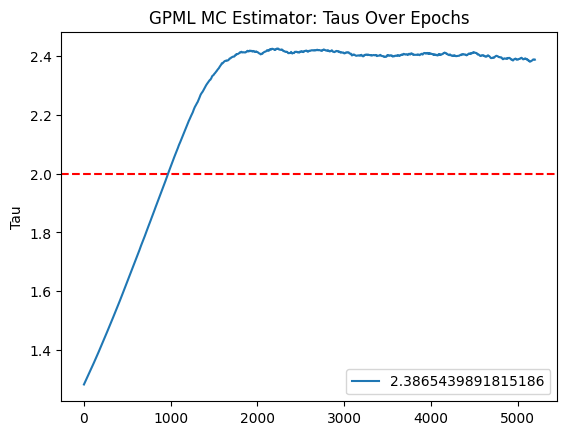

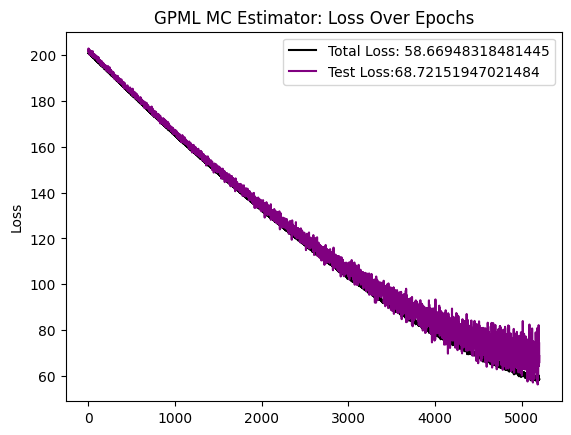

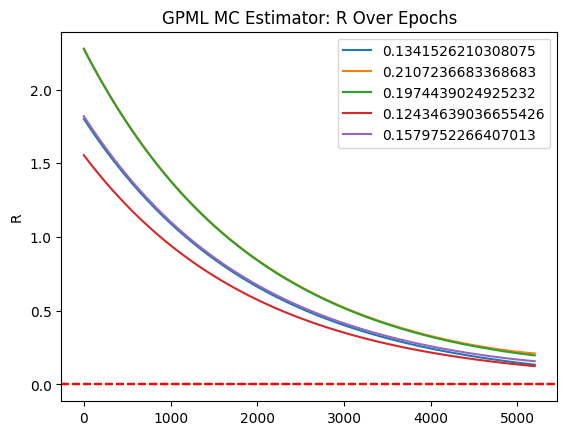

MC Fit:   5%|▌         | 5300/100000 [1:42:26<30:03:36,  1.14s/it]

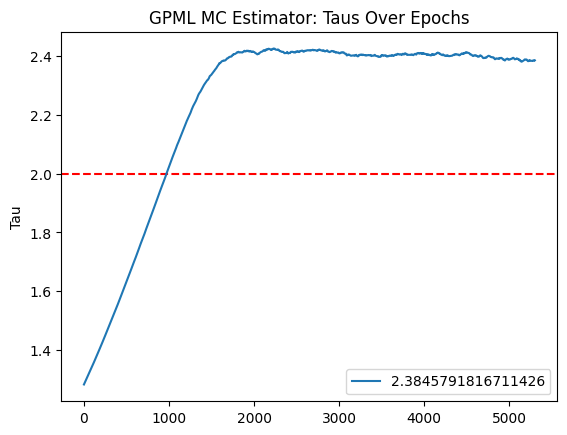

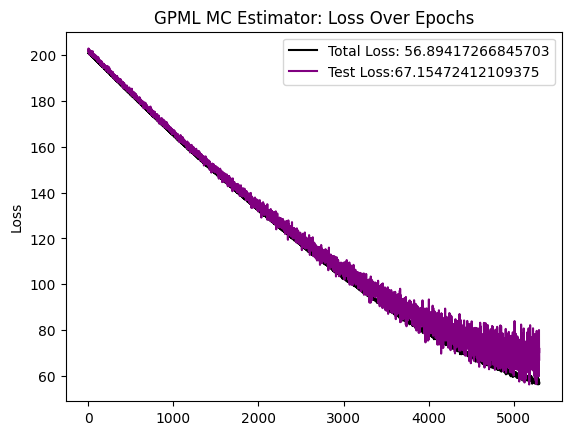

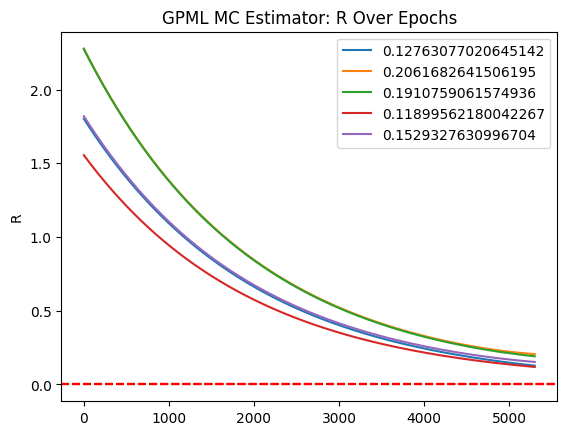

MC Fit:   5%|▌         | 5400/100000 [1:44:21<30:03:35,  1.14s/it]

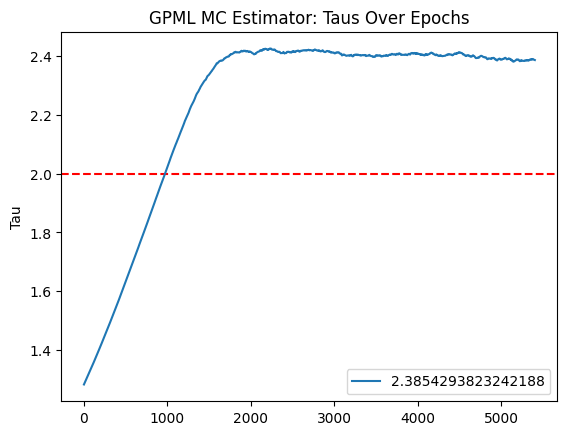

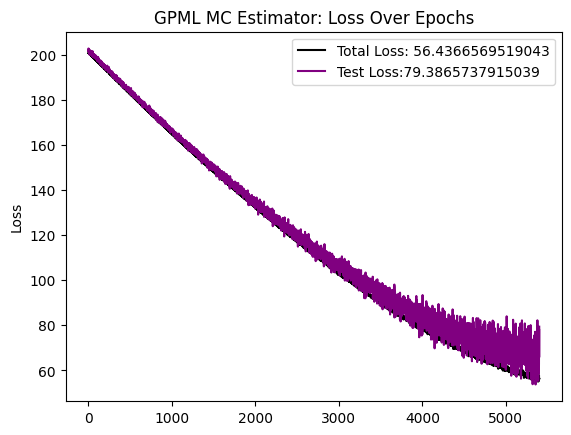

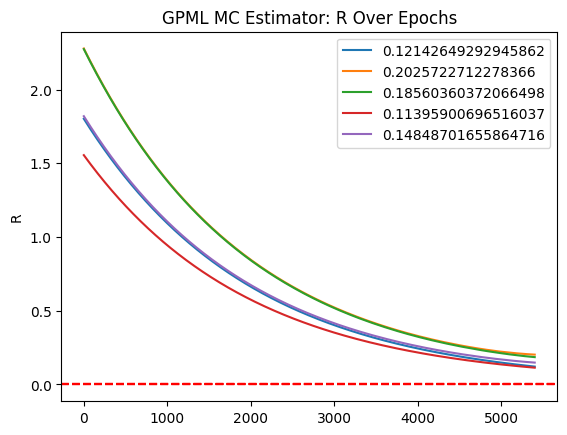

MC Fit:   6%|▌         | 5500/100000 [1:46:16<30:03:44,  1.15s/it]

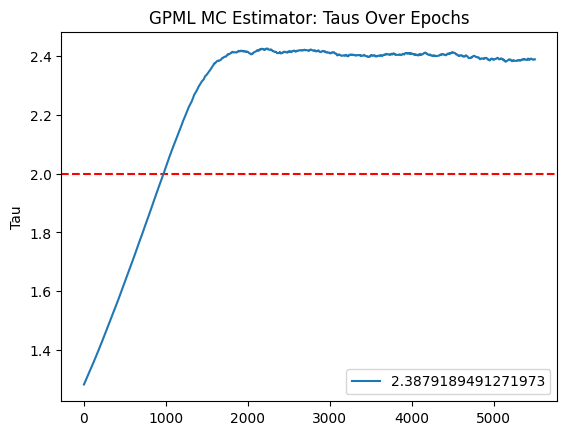

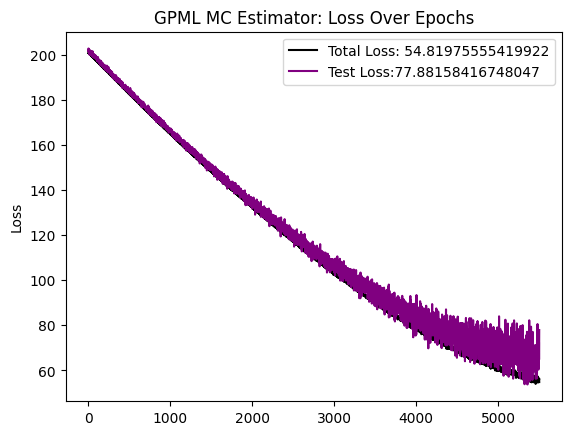

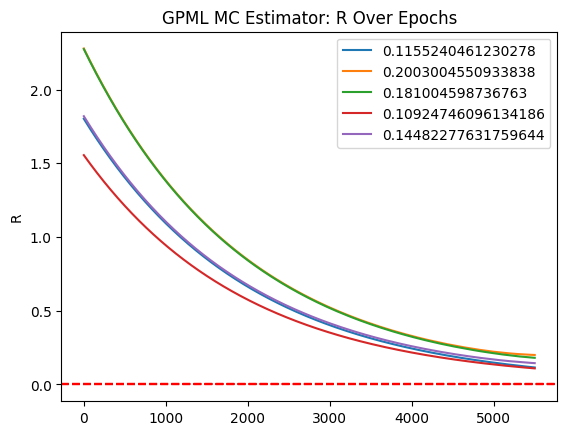

MC Fit:   6%|▌         | 5600/100000 [1:48:11<30:02:44,  1.15s/it]

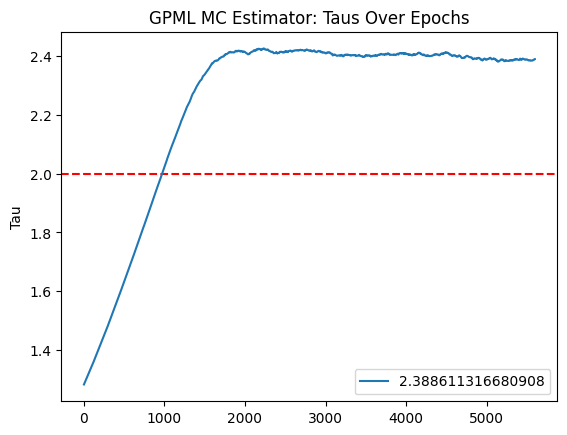

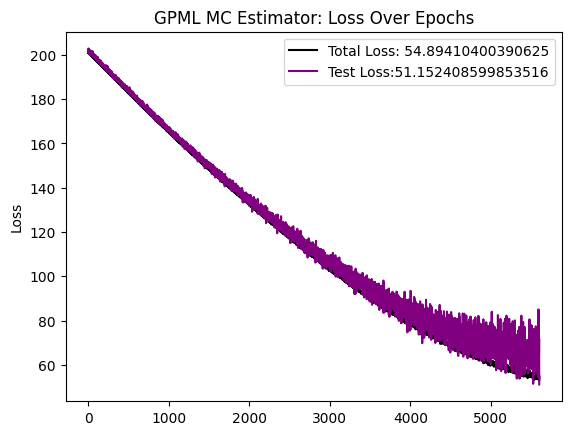

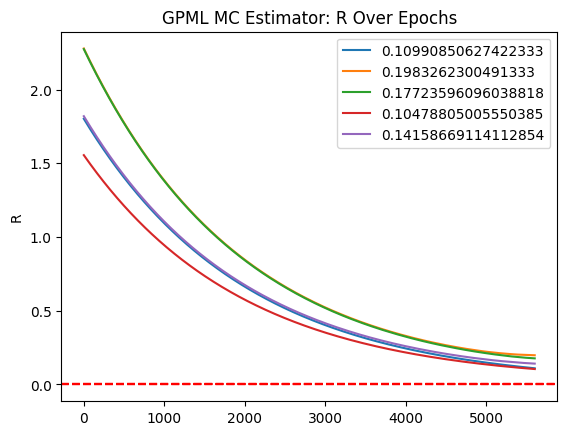

MC Fit:   6%|▌         | 5700/100000 [1:50:07<29:59:43,  1.15s/it]

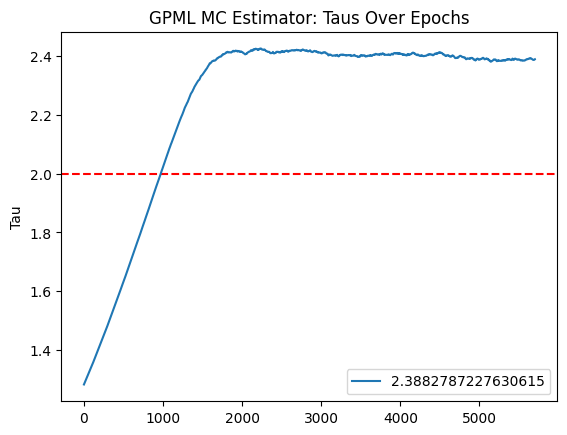

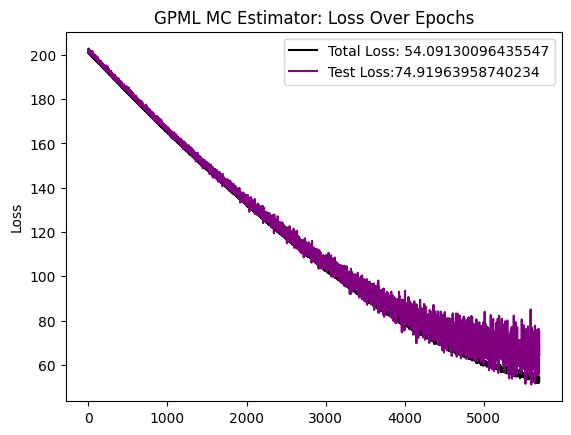

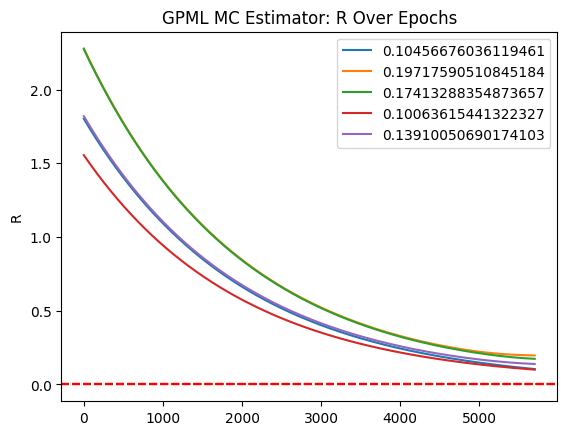

MC Fit:   6%|▌         | 5800/100000 [1:52:02<29:54:15,  1.14s/it]

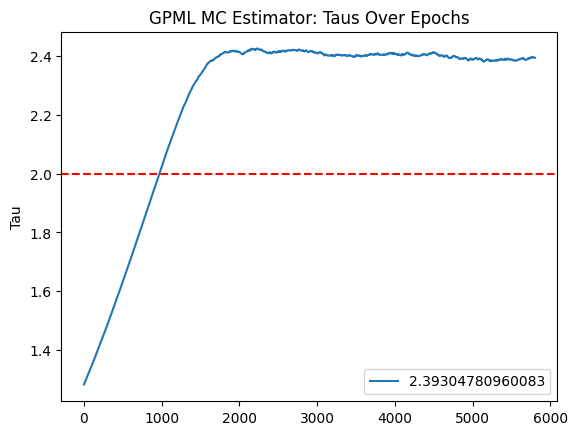

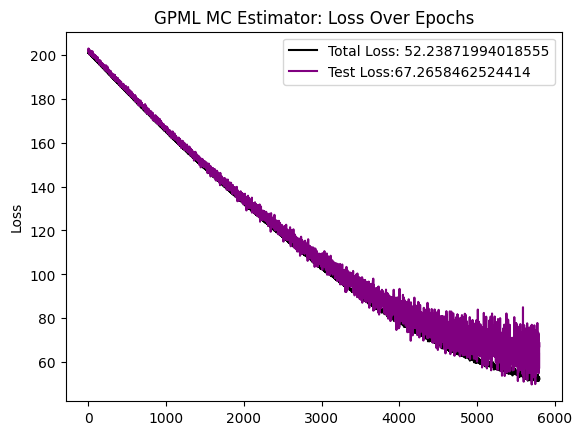

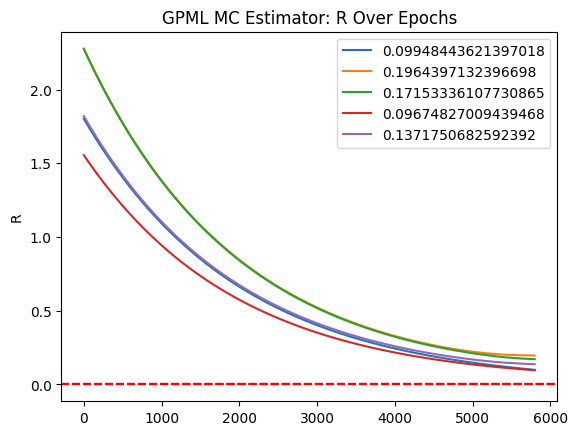

MC Fit:   6%|▌         | 5900/100000 [1:53:57<29:50:46,  1.14s/it]

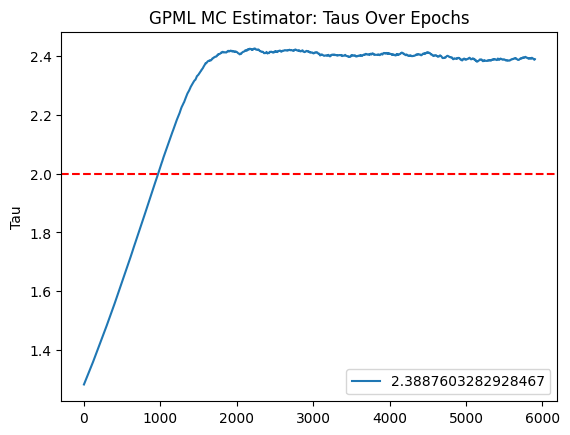

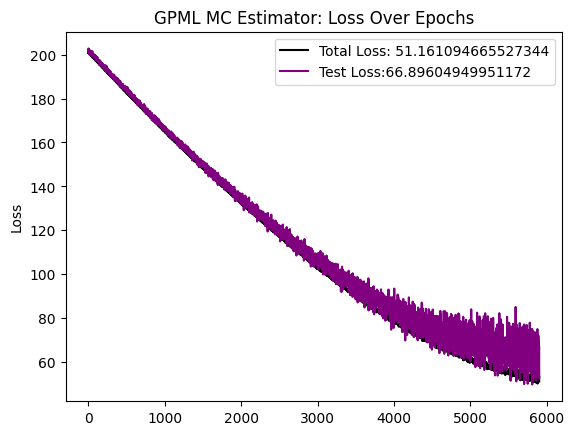

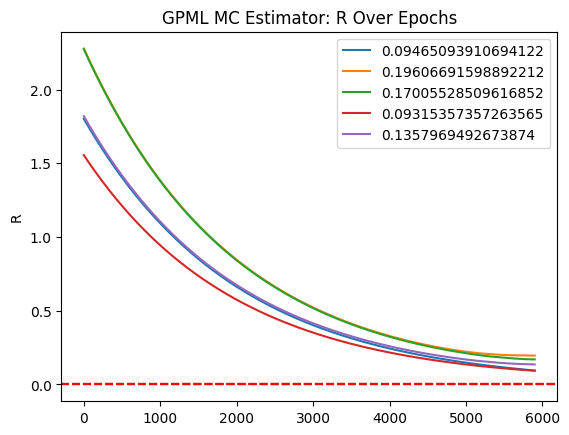

MC Fit:   6%|▌         | 6000/100000 [1:55:53<29:50:36,  1.14s/it]

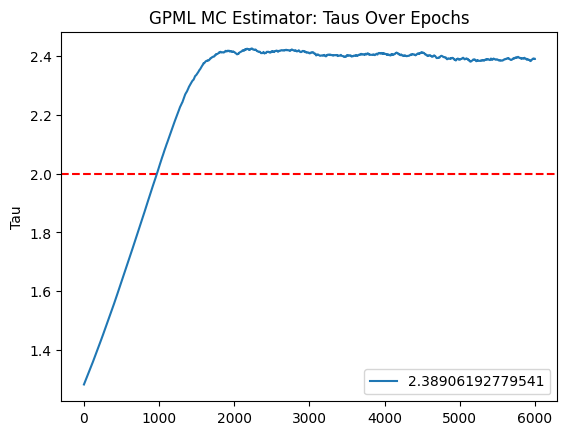

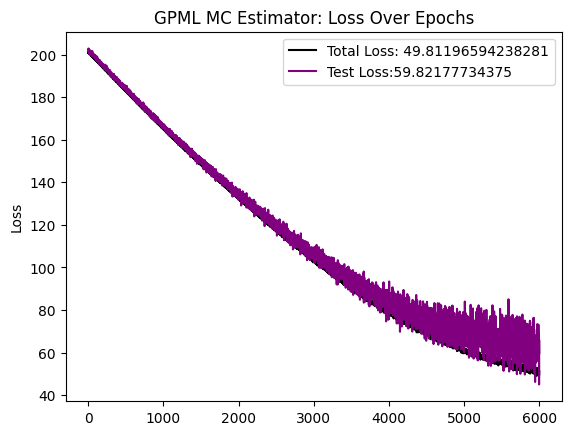

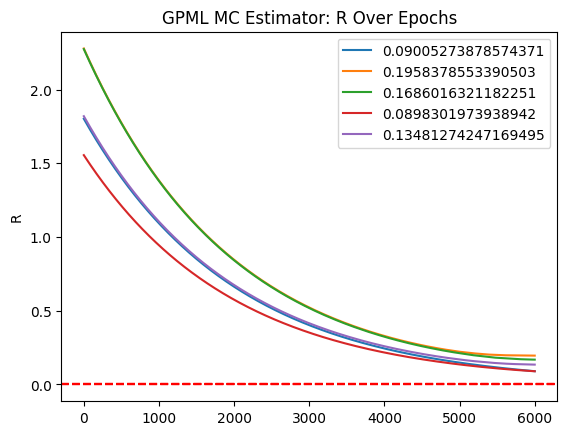

MC Fit:   6%|▌         | 6100/100000 [1:57:48<29:52:01,  1.15s/it]

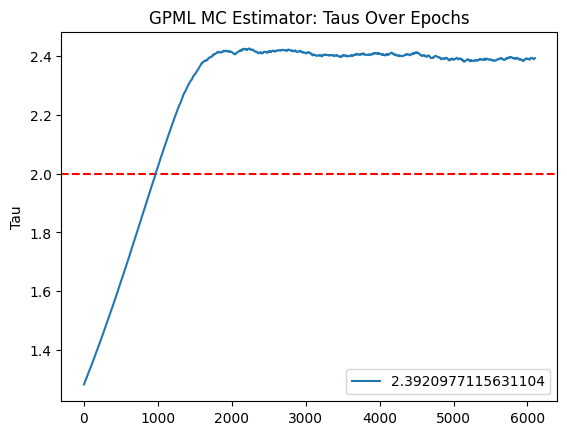

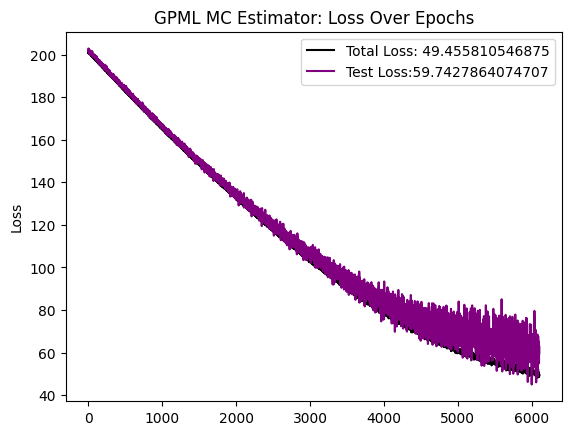

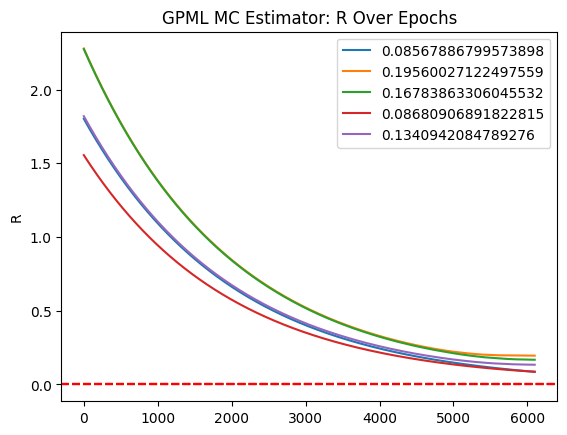

MC Fit:   6%|▌         | 6200/100000 [1:59:43<29:44:28,  1.14s/it]

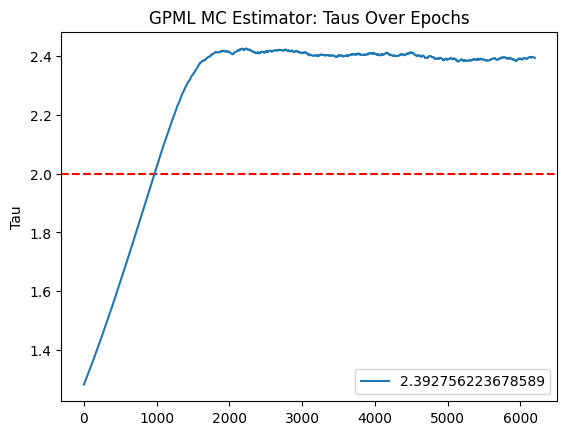

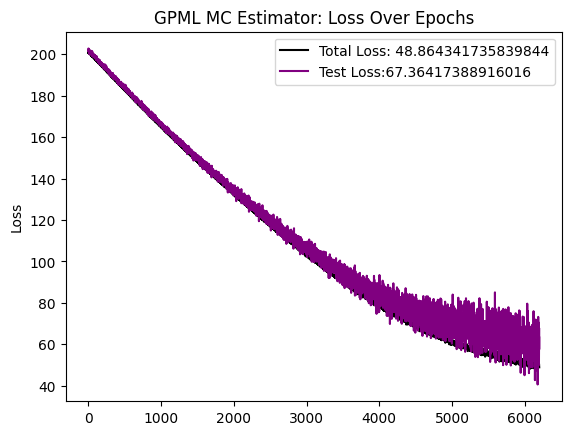

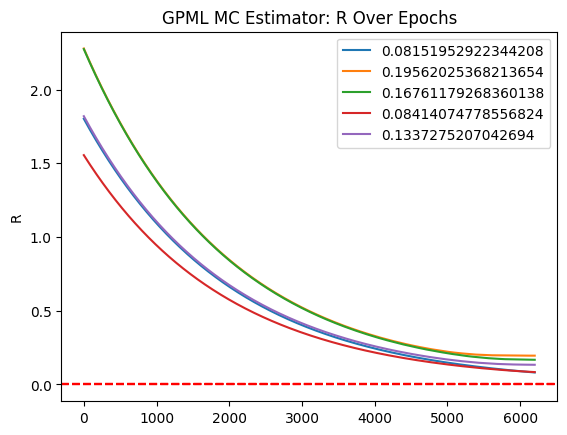

MC Fit:   6%|▋         | 6300/100000 [2:01:38<29:43:06,  1.14s/it]

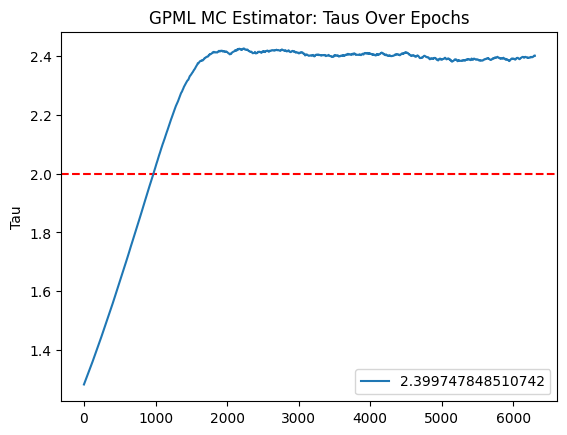

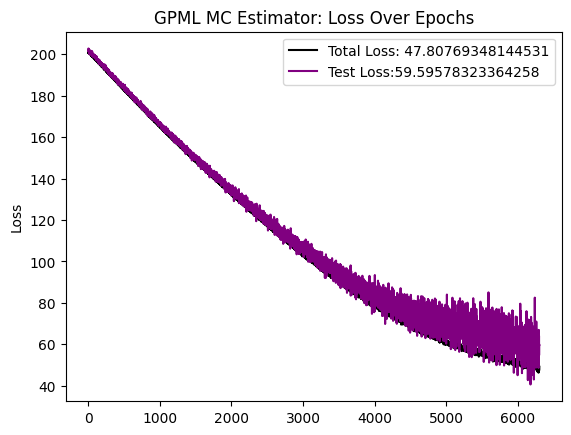

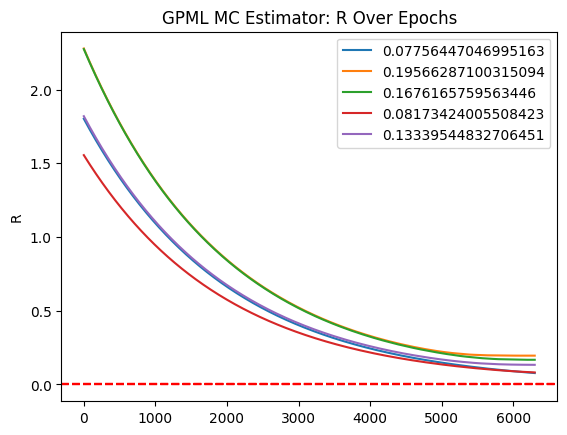

MC Fit:   6%|▋         | 6400/100000 [2:03:33<29:43:40,  1.14s/it]

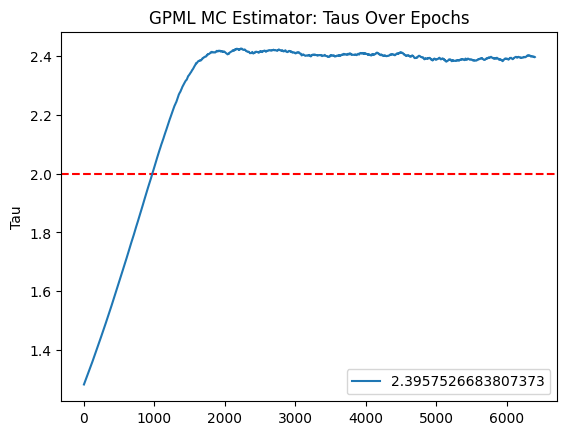

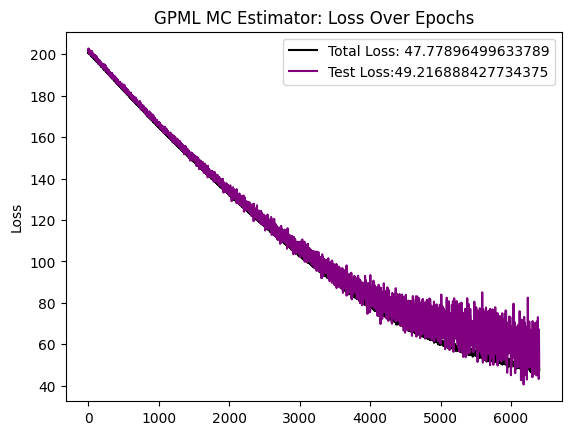

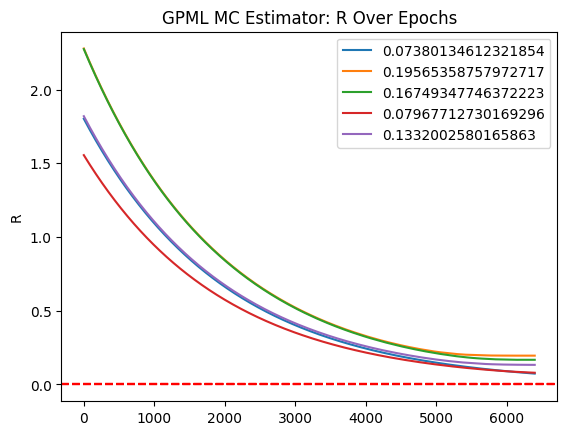

MC Fit:   6%|▋         | 6500/100000 [2:05:29<29:42:01,  1.14s/it]

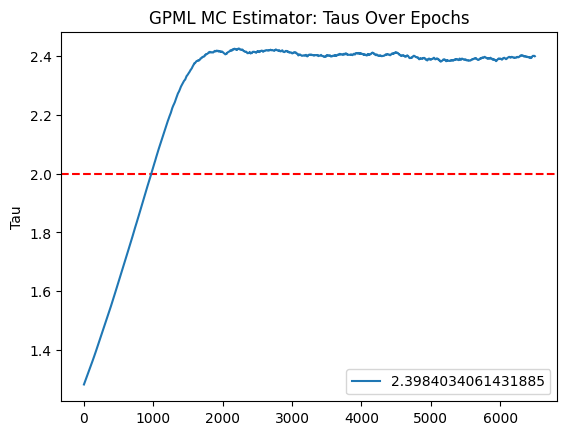

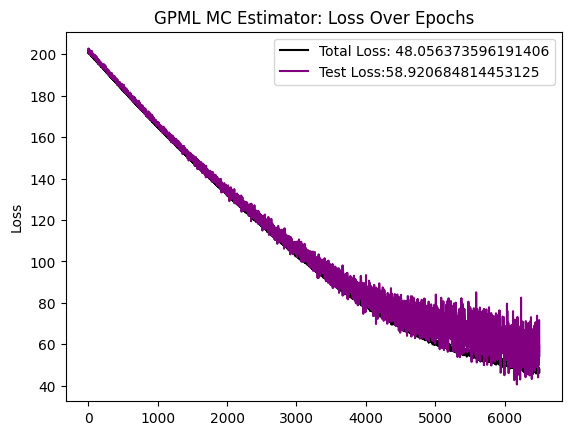

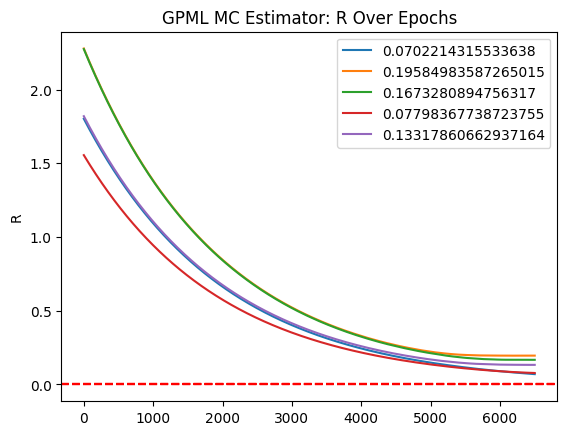

MC Fit:   7%|▋         | 6600/100000 [2:07:24<29:38:35,  1.14s/it]

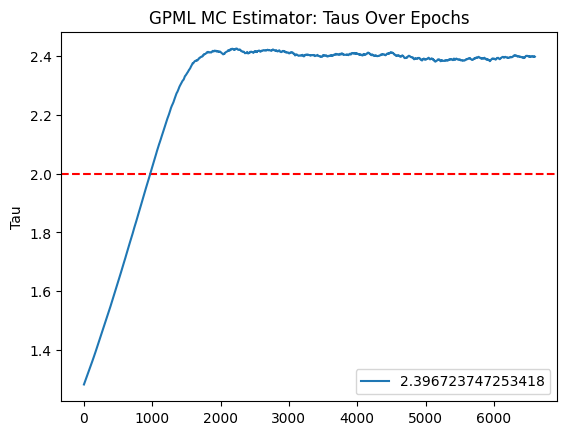

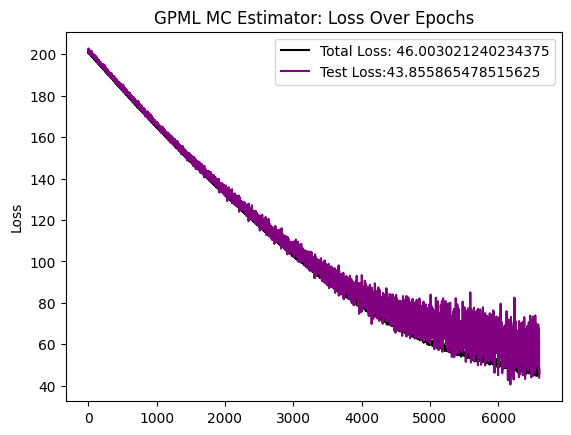

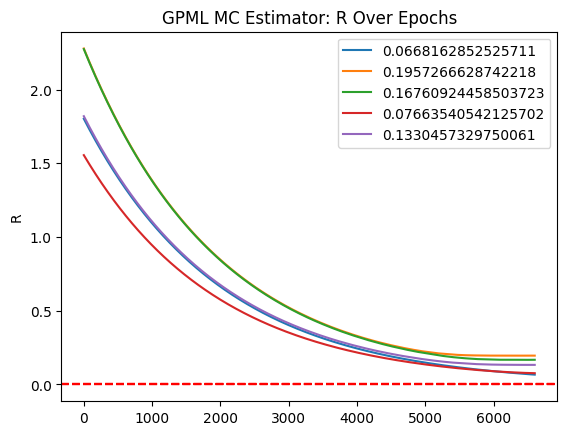

MC Fit:   7%|▋         | 6700/100000 [2:09:20<29:41:10,  1.15s/it]

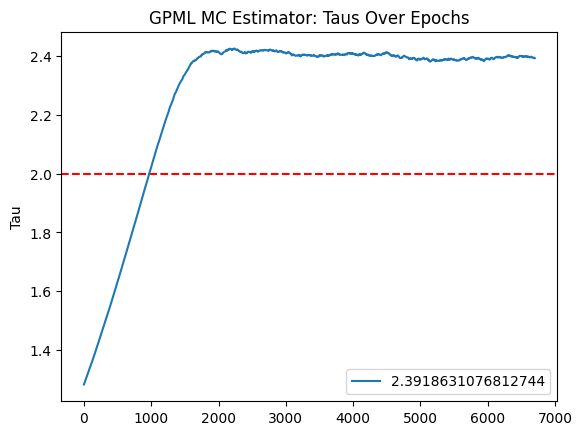

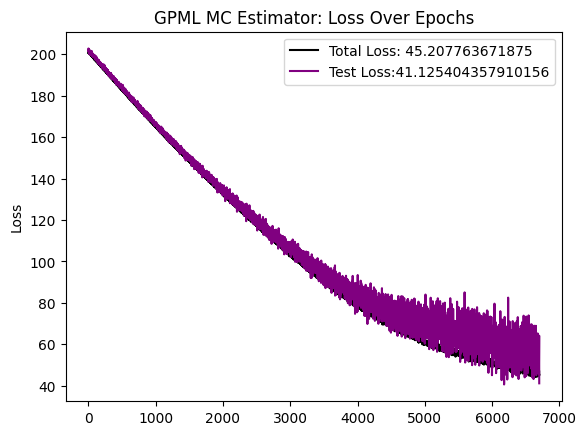

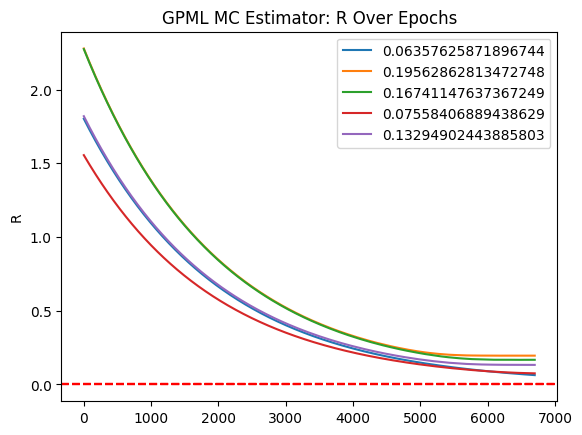

MC Fit:   7%|▋         | 6800/100000 [2:11:15<29:36:21,  1.14s/it]

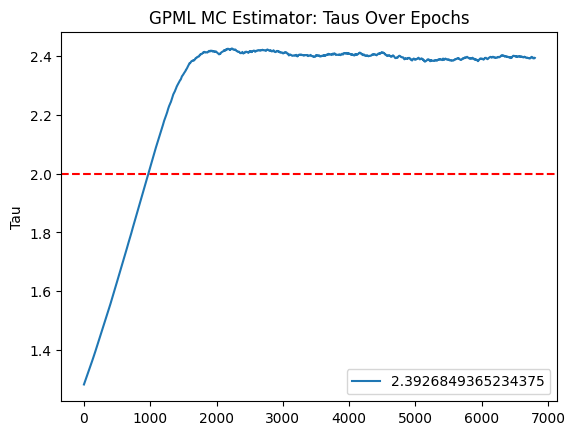

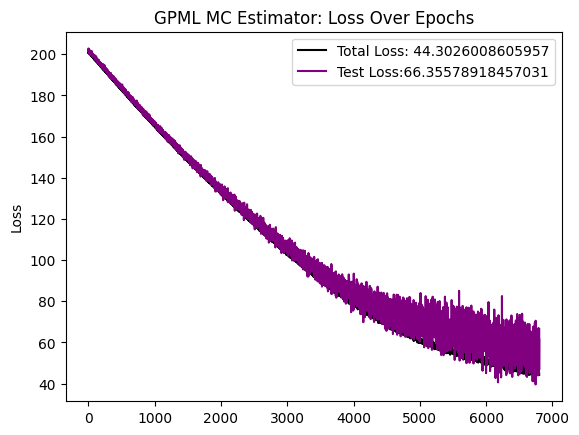

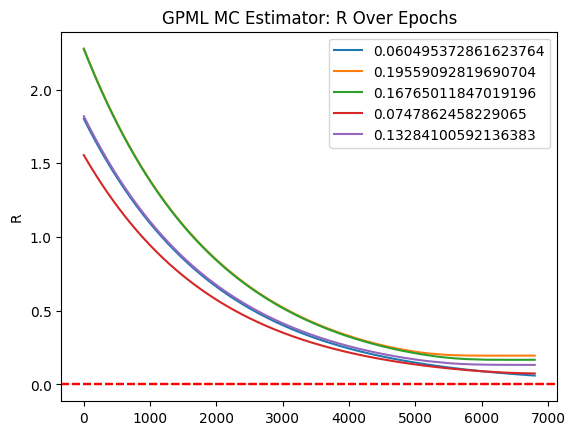

MC Fit:   7%|▋         | 6900/100000 [2:13:11<29:33:12,  1.14s/it]

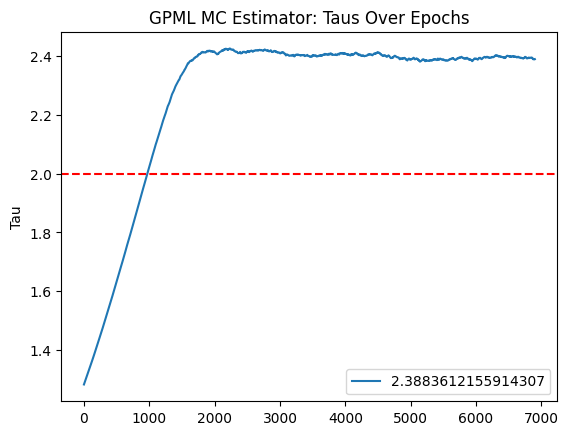

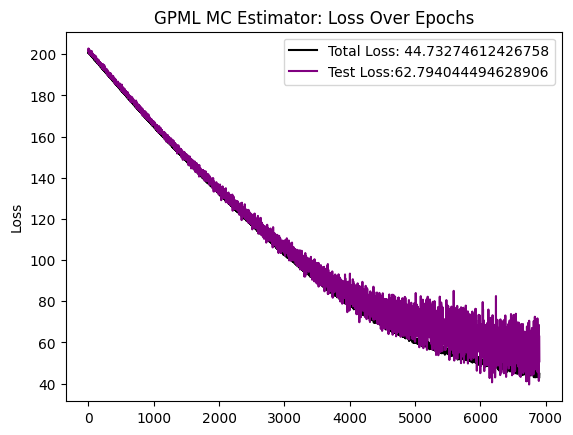

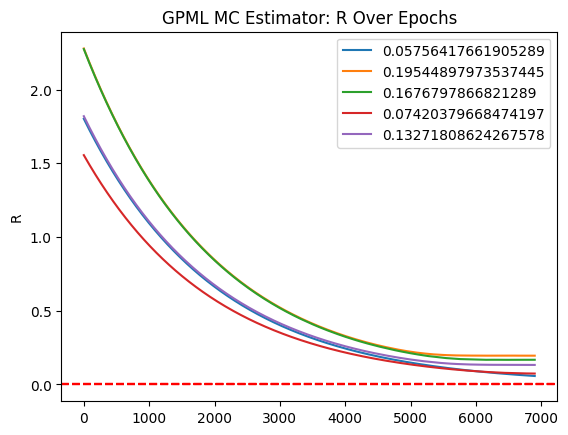

MC Fit:   7%|▋         | 7000/100000 [2:15:06<29:31:40,  1.14s/it]

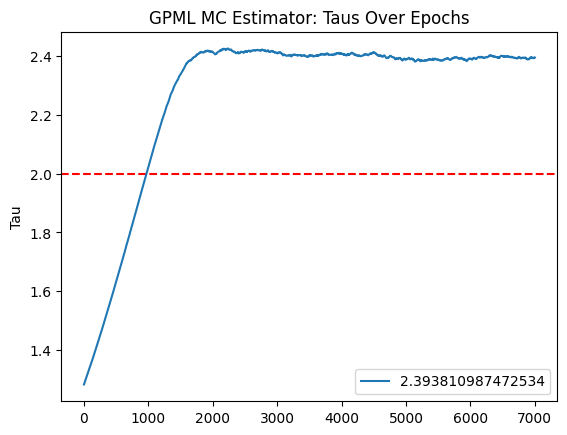

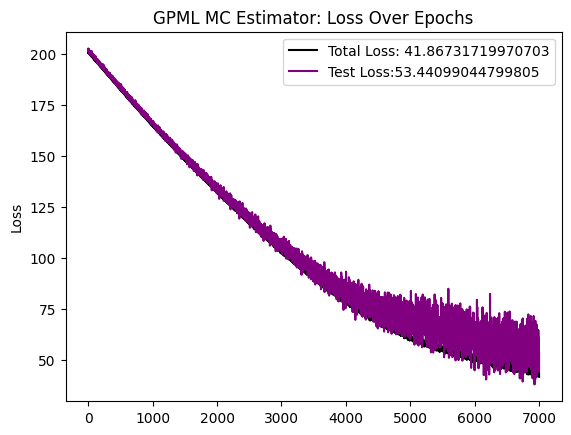

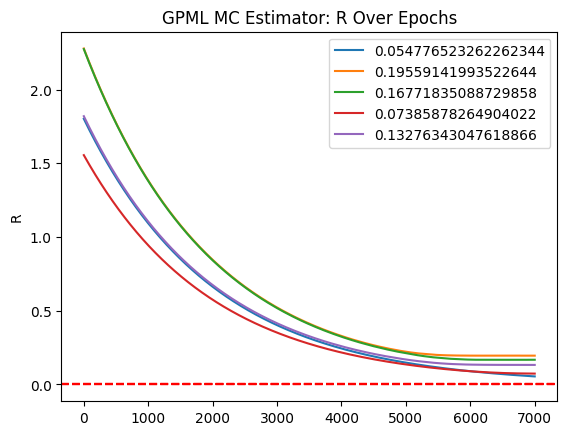

MC Fit:   7%|▋         | 7100/100000 [2:17:01<29:30:07,  1.14s/it]

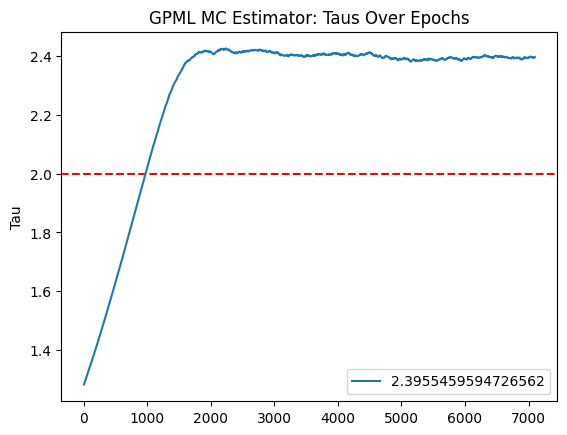

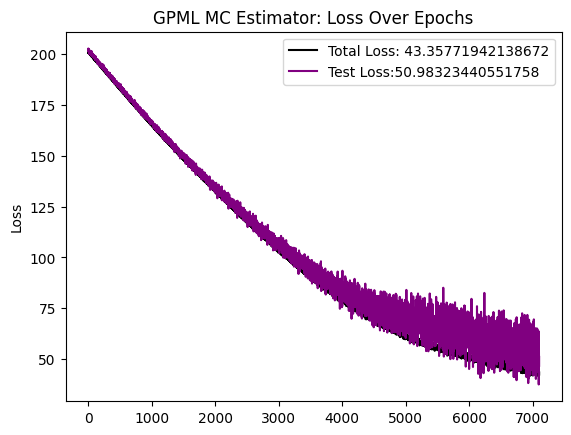

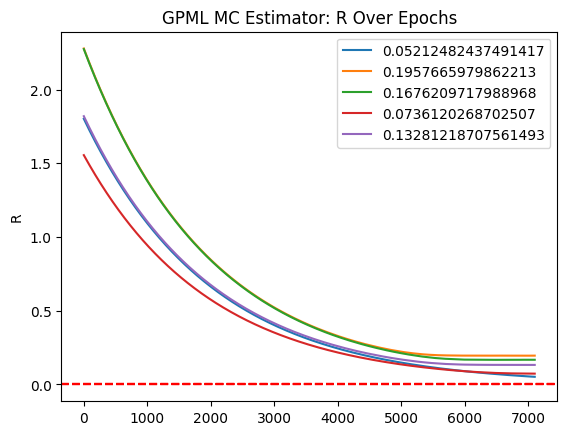

MC Fit:   7%|▋         | 7200/100000 [2:18:57<29:32:15,  1.15s/it]

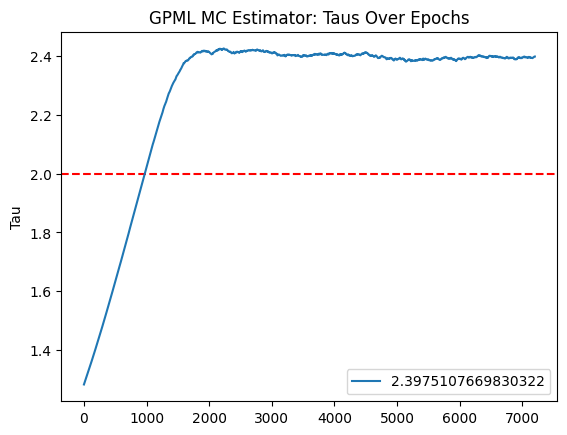

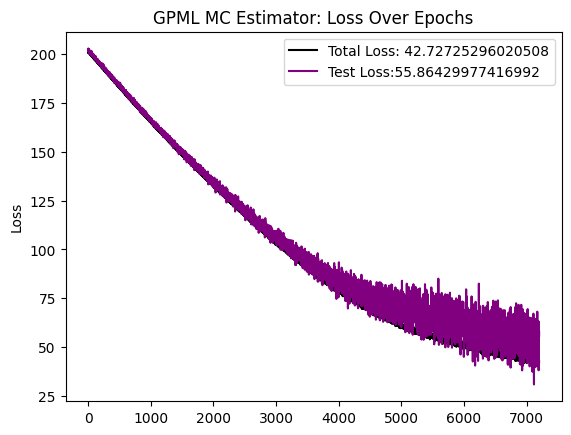

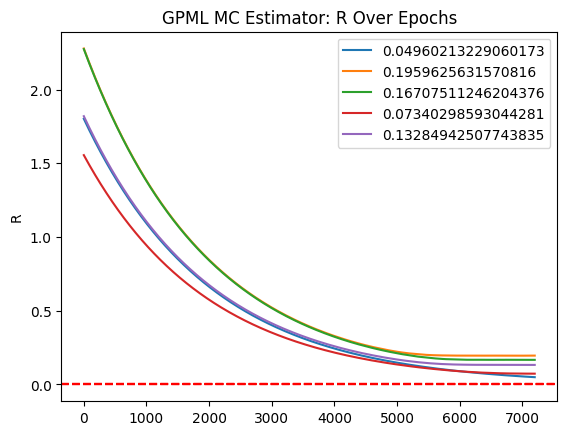

MC Fit:   7%|▋         | 7300/100000 [2:20:52<29:24:57,  1.14s/it]

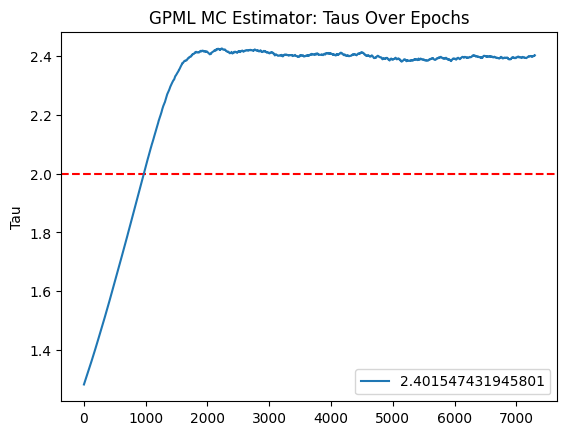

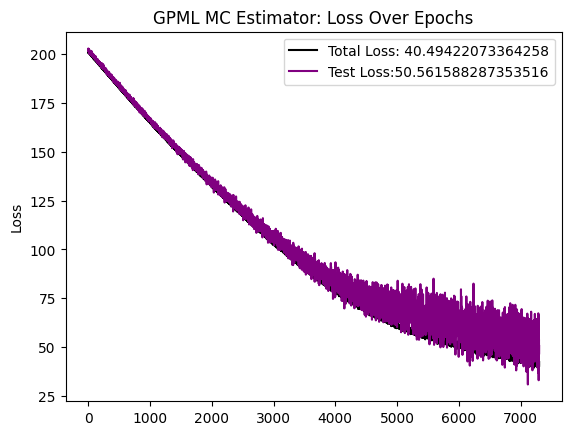

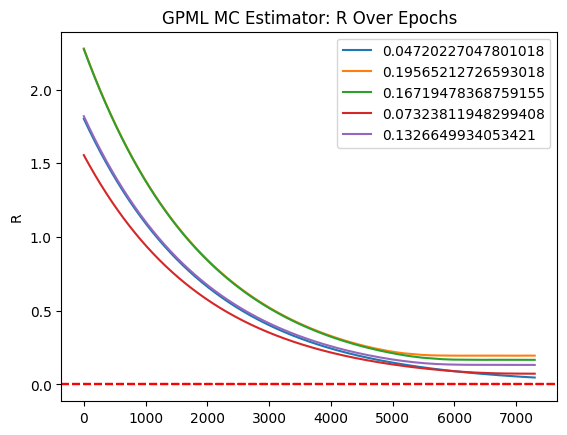

MC Fit:   7%|▋         | 7400/100000 [2:22:47<29:24:15,  1.14s/it]

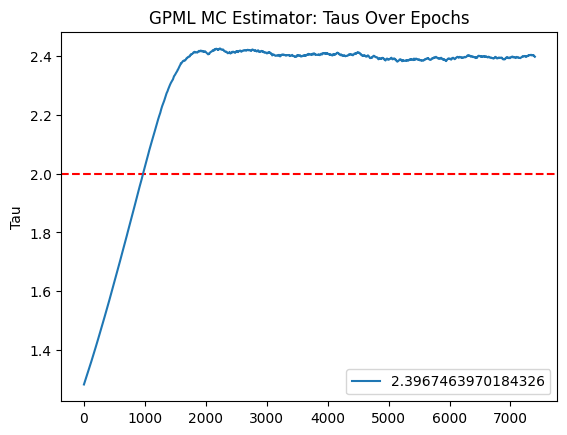

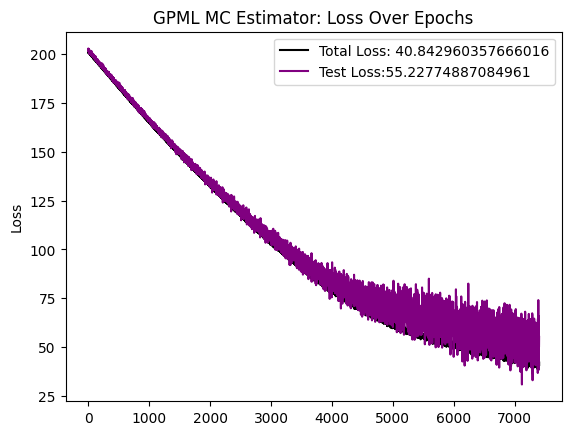

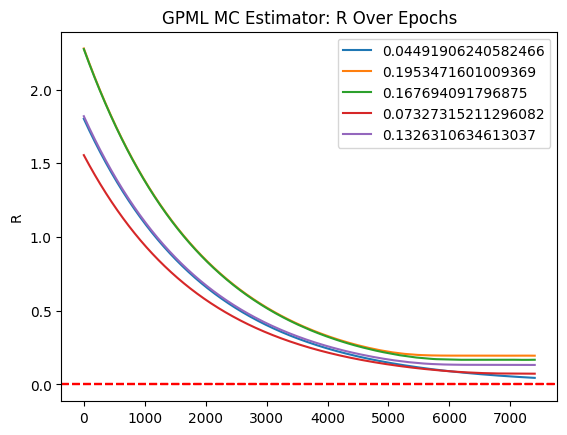

MC Fit:   8%|▊         | 7500/100000 [2:24:43<29:23:52,  1.14s/it]

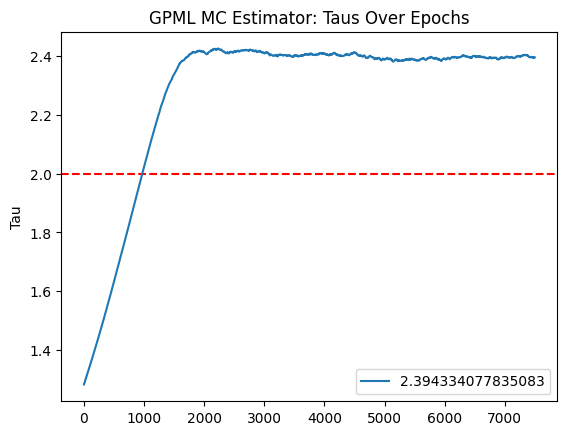

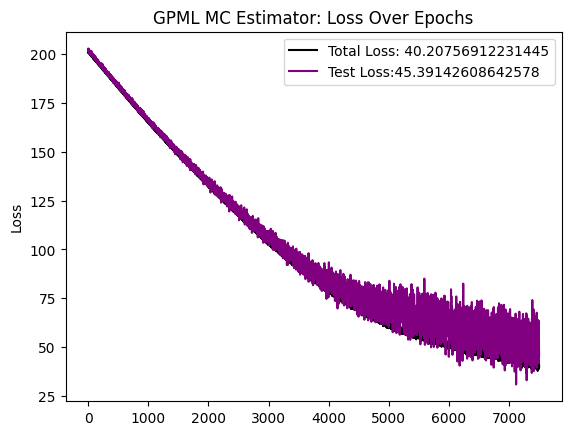

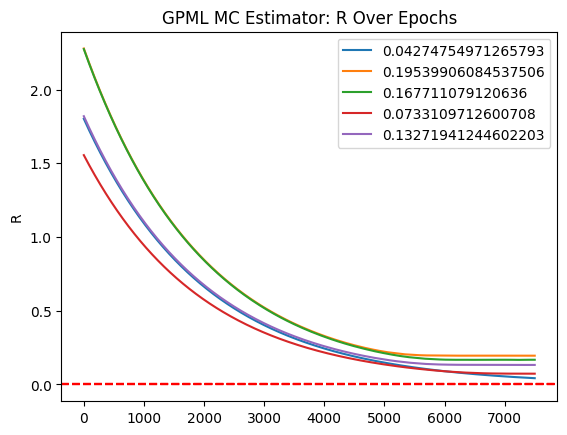

MC Fit:   8%|▊         | 7600/100000 [2:26:38<29:19:40,  1.14s/it]

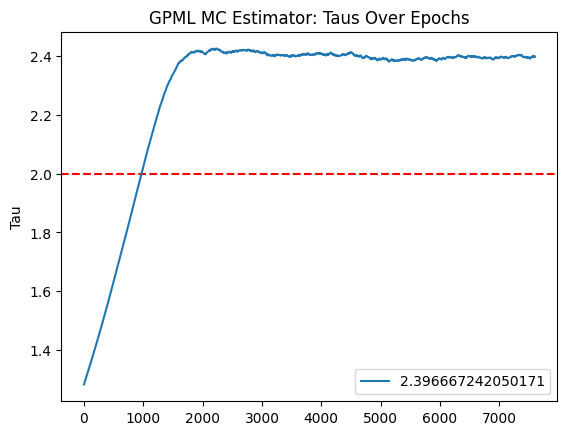

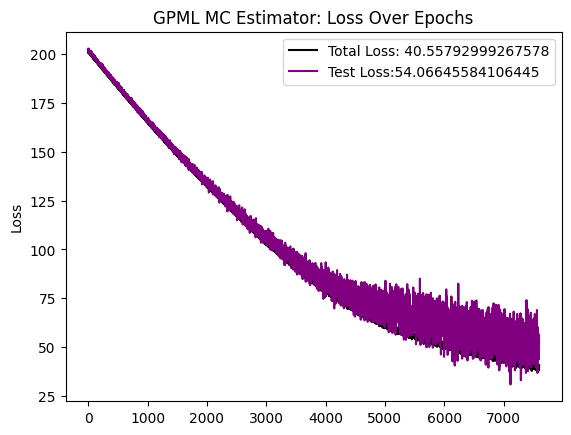

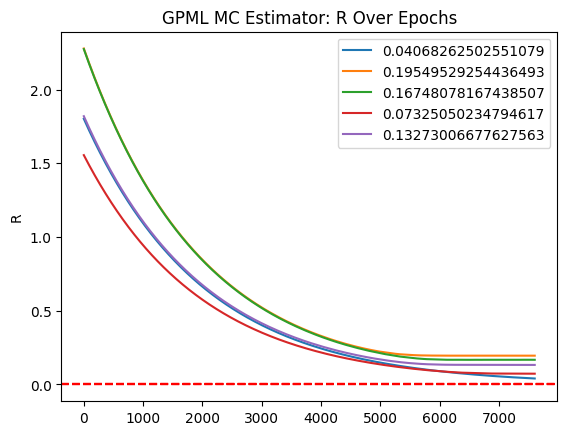

MC Fit:   8%|▊         | 7700/100000 [2:28:34<29:22:09,  1.15s/it]

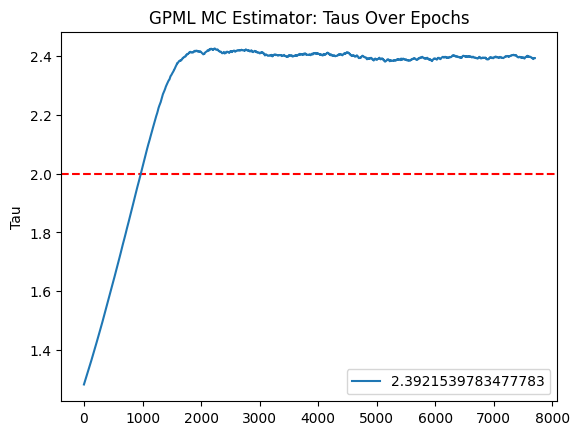

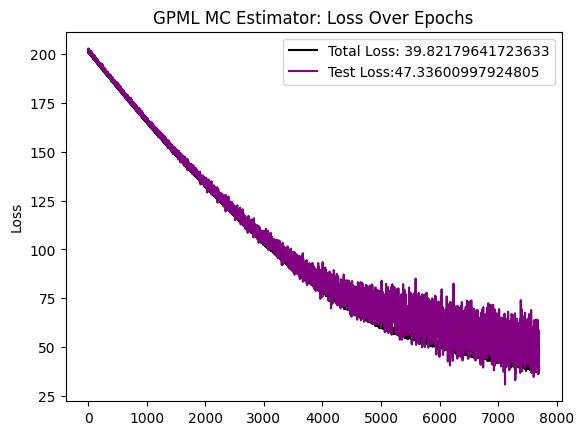

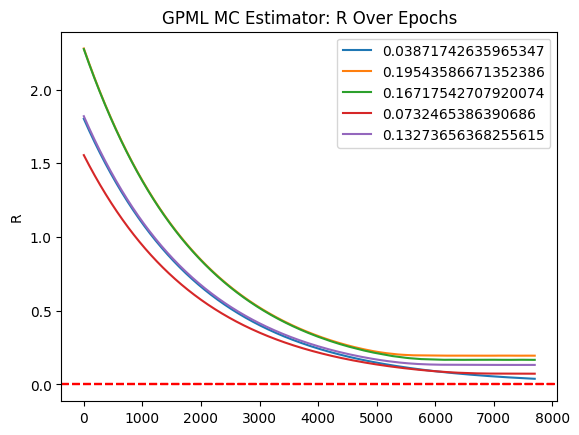

MC Fit:   8%|▊         | 7800/100000 [2:30:29<29:13:57,  1.14s/it]

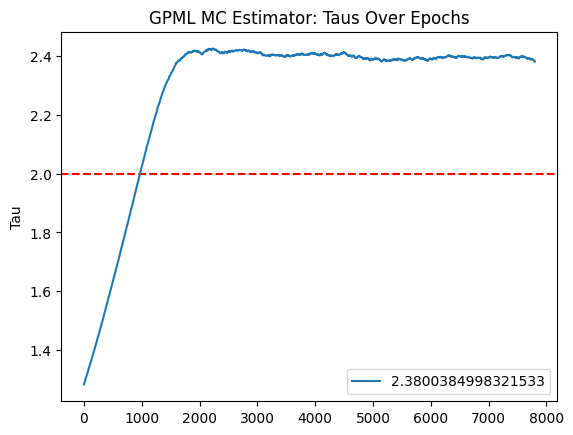

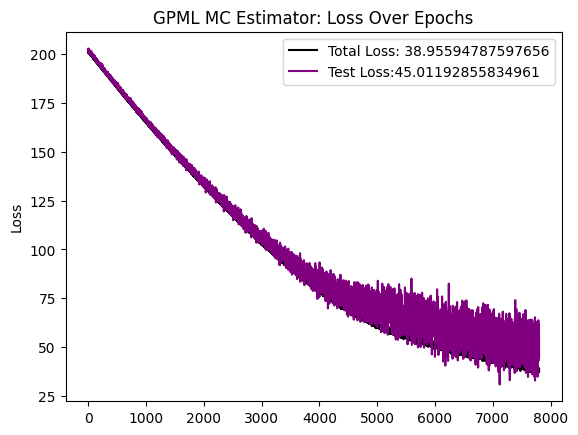

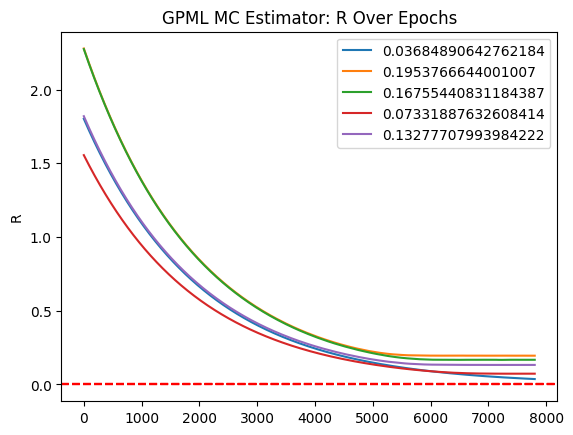

MC Fit:   8%|▊         | 7900/100000 [2:32:25<29:15:00,  1.14s/it]

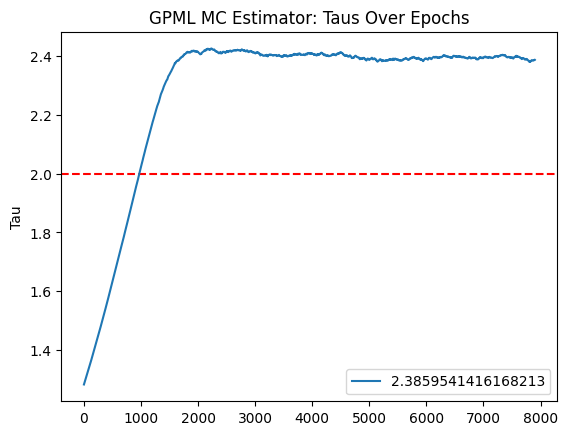

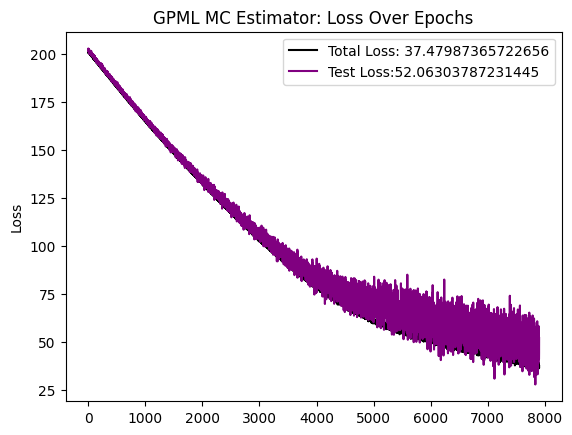

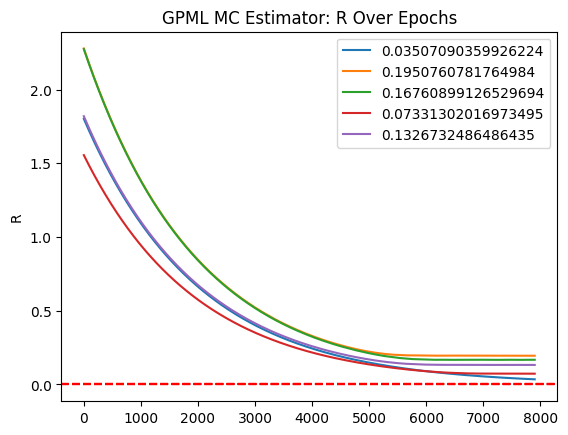

MC Fit:   8%|▊         | 8000/100000 [2:34:20<29:12:43,  1.14s/it]

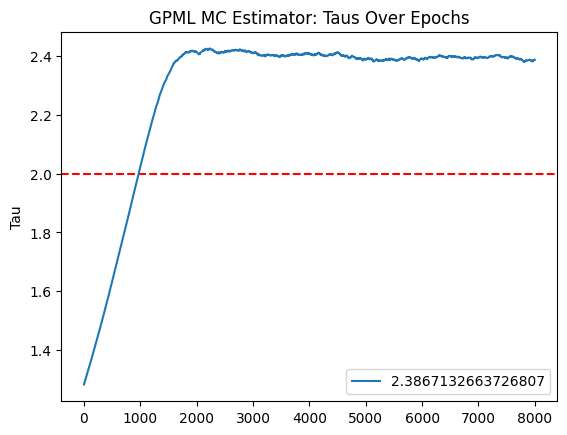

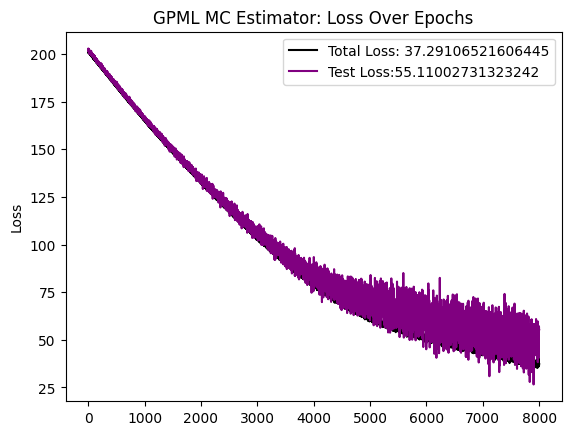

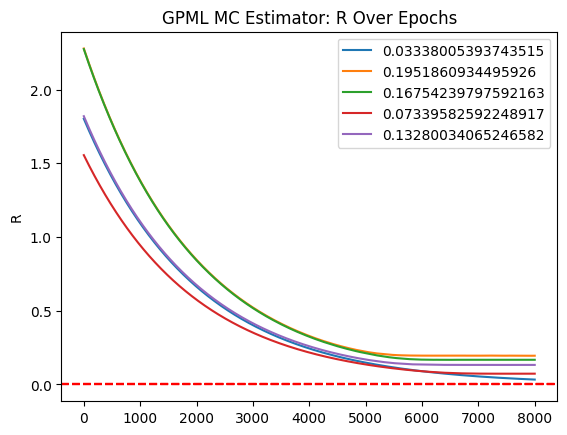

MC Fit:   8%|▊         | 8100/100000 [2:36:16<29:14:55,  1.15s/it]

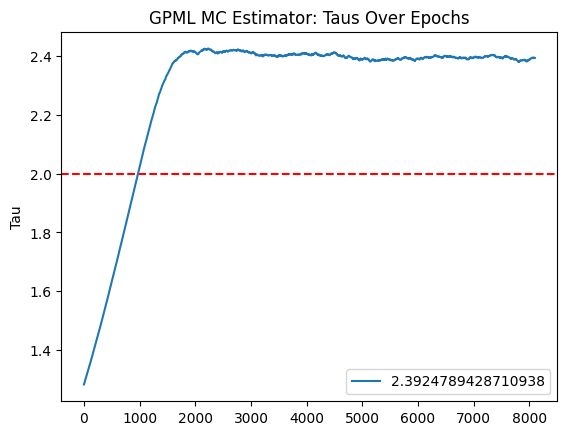

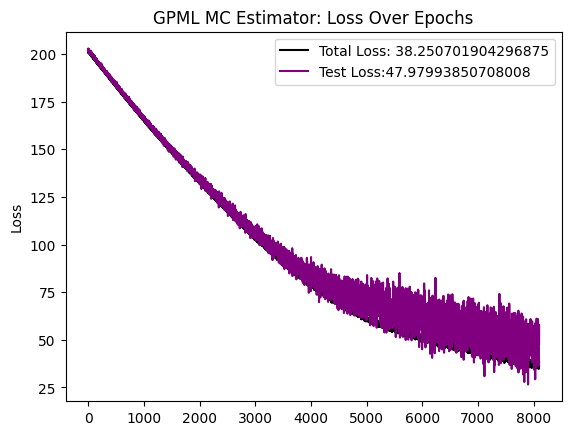

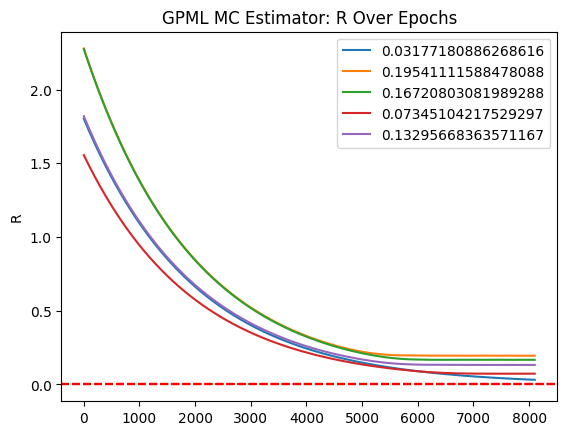

MC Fit:   8%|▊         | 8200/100000 [2:38:11<29:08:21,  1.14s/it]

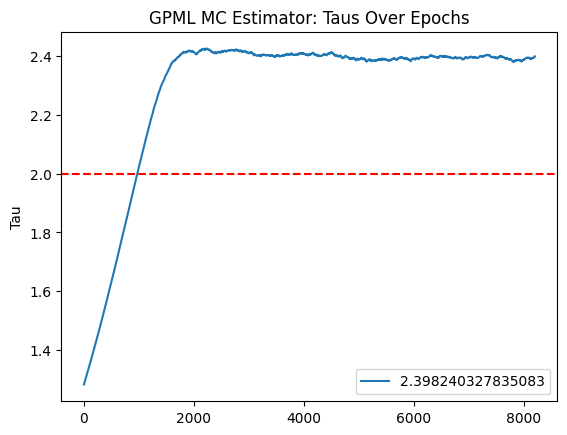

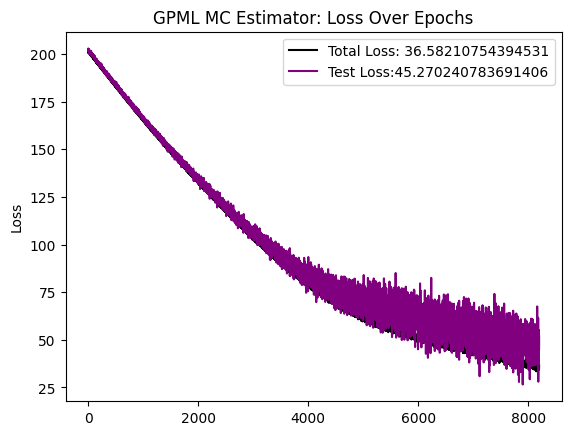

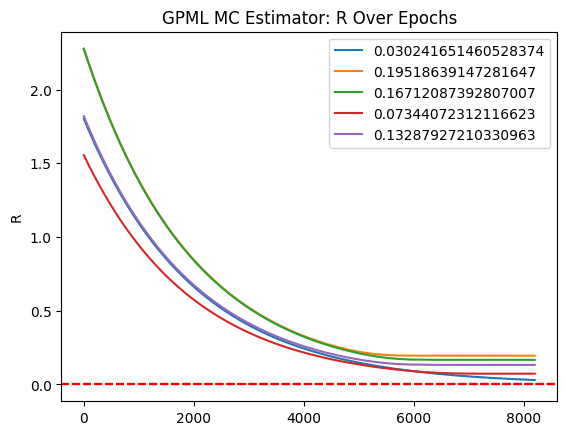

MC Fit:   8%|▊         | 8300/100000 [2:40:06<29:07:39,  1.14s/it]

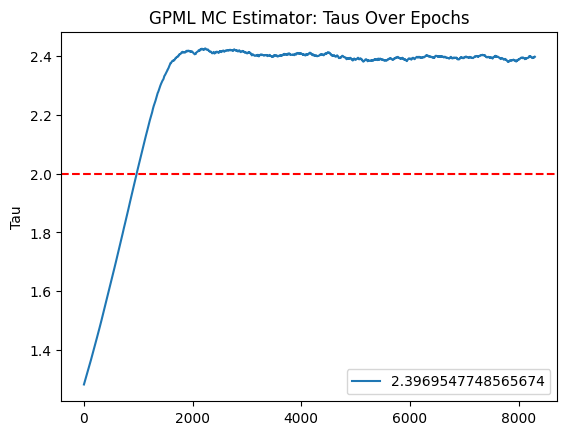

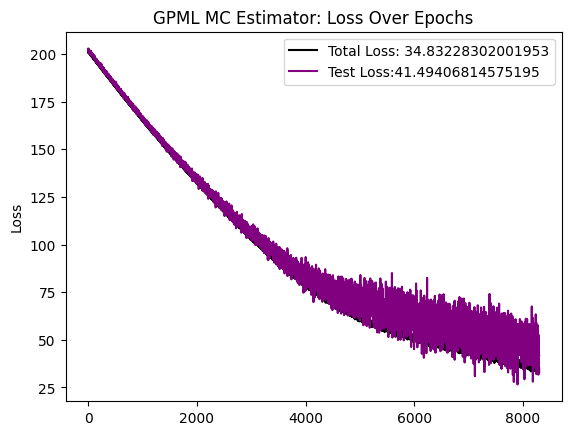

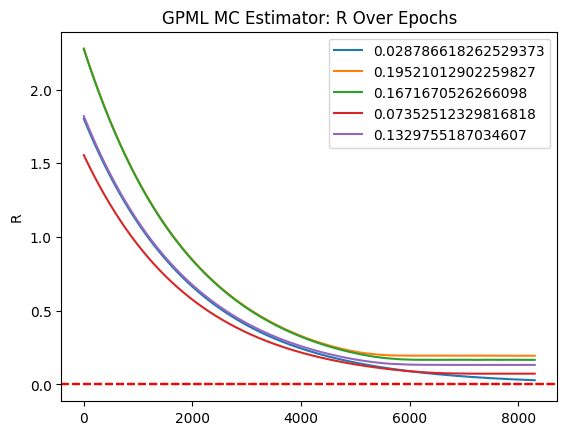

MC Fit:   8%|▊         | 8400/100000 [2:42:02<29:07:14,  1.14s/it]

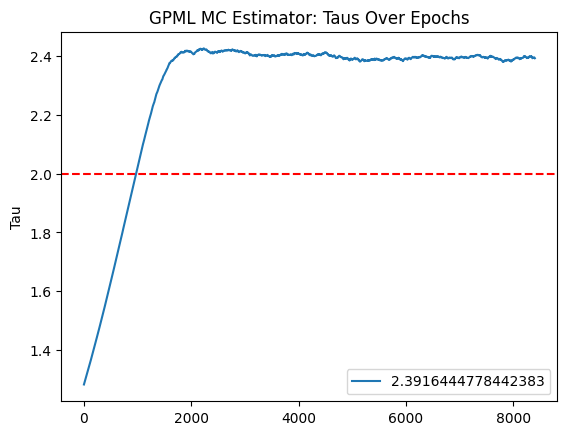

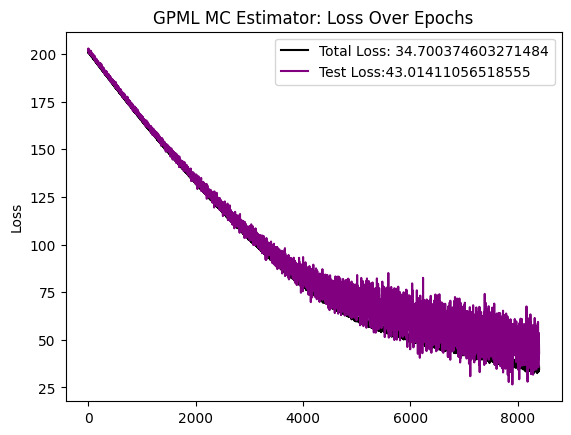

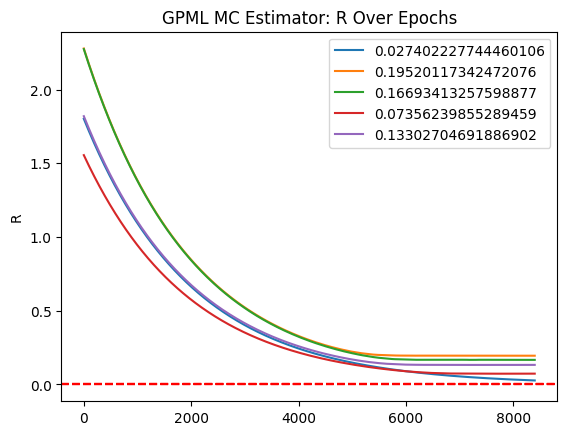

MC Fit:   8%|▊         | 8500/100000 [2:43:57<29:09:13,  1.15s/it]

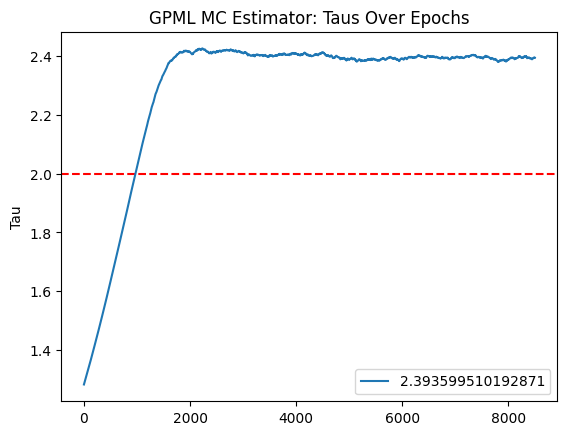

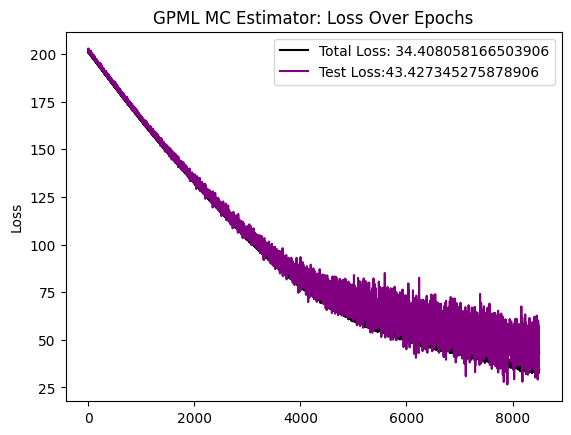

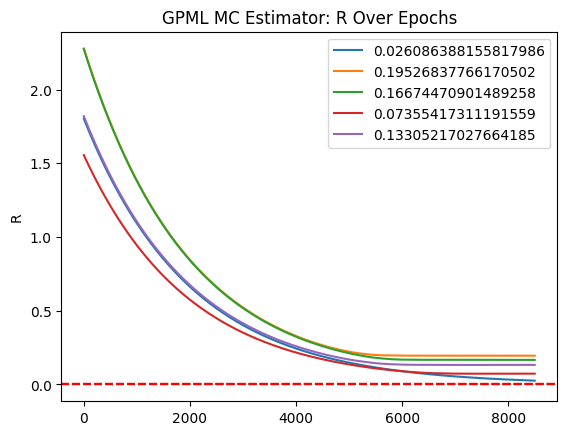

MC Fit:   9%|▊         | 8600/100000 [2:45:53<29:00:25,  1.14s/it]

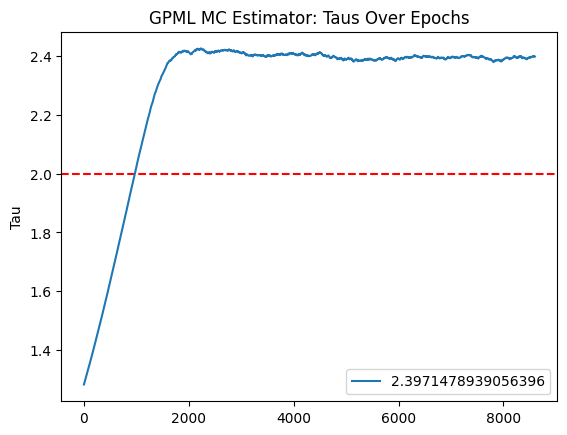

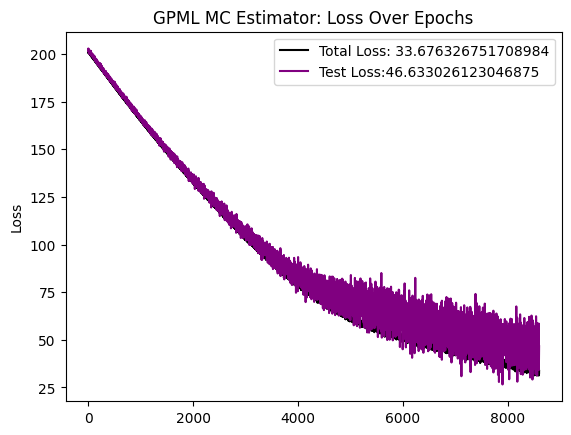

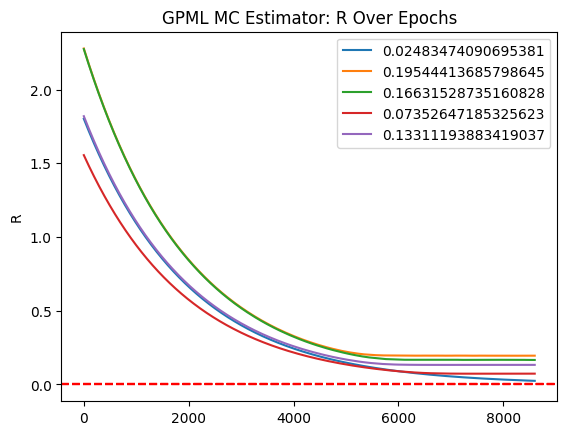

MC Fit:   9%|▊         | 8700/100000 [2:47:48<29:01:48,  1.14s/it]

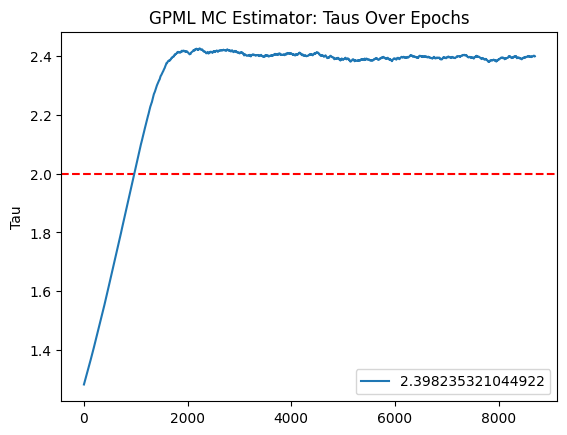

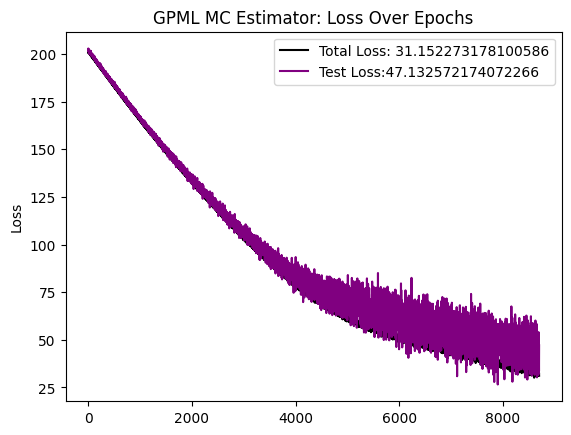

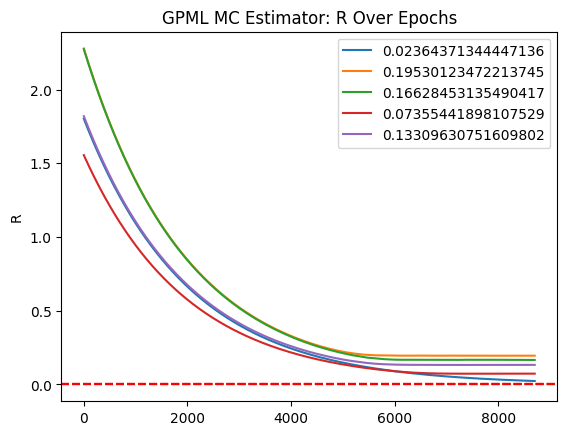

MC Fit:   9%|▉         | 8772/100000 [2:49:12<29:01:57,  1.15s/it]Process ForkProcess-2:
Traceback (most recent call last):
  File "/usr/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
Process ForkProcess-1:
  File "/usr/lib/python3.10/concurrent/futures/process.py", line 240, in _process_worker
    call_item = call_queue.get(block=True)
  File "/usr/lib/python3.10/multiprocessing/queues.py", line 102, in get
    with self._rlock:
  File "/usr/lib/python3.10/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
Traceback (most recent call last):
  Fil

KeyboardInterrupt: 

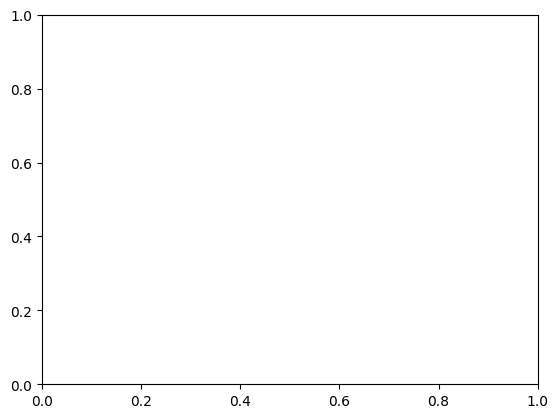

In [ ]:
class HighDParabolaDecoder(nn.Module):
    def __init__(self,latent_dims,observation_dims,device="cpu",alpha=1.0):
        super().__init__()
        self.alpha = torch.nn.Parameter(torch.tensor(alpha,requires_grad=True,device=device))
        self.parabola_to_embedding_layer = nn.Linear(latent_dims+1,observation_dims,device=device)
        self.parabola_mixing = nn.Linear(latent_dims,latent_dims,device=device)

    def forward(self,Z):
        '''takes in a k dimensional latent variable and embeds it into an n d parabola
        Z - tensor of shape [batch_size,samples, timesteps, dims_in]
        returns X a tensor of shape [batch_size, samples, timesteps, dims_in+1]
        '''
        extra_dim = torch.linalg.norm(Z,dim=-1)**2
        #mixing_Z = self.parabola_mixing(Z)
        parabola = torch.cat((Z,self.alpha*extra_dim.unsqueeze(-1)),dim=-1)
        out = self.parabola_to_embedding_layer(parabola)
        return out

class LinearDecoder(nn.Module):
    def __init__(self,latent_dim,observed_dim,init_vals = None,device="cpu"):
        super().__init__()
        self.weights = nn.Linear(latent_dim,observed_dim,device=device)
        if not init_vals is None:
            with torch.no_grad():
                self.weights.weight.copy_(init_vals)
    def forward(self,z):
        return self.weights(z)

def dataset_constructor(forward_model,latent_dims,observed_dims,time_start=0.0,time_end=10.0,time_divisions=10,
            R_diag = [0.1,0.1,0.1],taus=[2.0,5.0],signal_sds = 0.99,
            noise_sds = 0.01,samples = 1000,device="cpu"):
    times = torch.linspace(time_start,time_end,time_divisions,device=device,requires_grad=False)
    true_model = GPMLDataStruct(latent_dims,observed_dims,taus,R_diag,
                                [signal_sds]*latent_dims,[noise_sds]*latent_dims,
                                forward_model,device=device)
    Z,X = true_model.sample_model(samples,times)
    variable_dict = {"times":times,"X":X,"taus":torch.tensor(taus,device=device,requires_grad=False),
                     "R_diag":torch.tensor(R_diag,device=device,requires_grad=False),"Z":Z,"model":true_model}
    return variable_dict

def get_mean_var(data):
    #data = [batch_size, timesteps, latents]
    batch_size,timesteps,latents = data.shape
    batch_collapsed = data.reshape(batch_size*timesteps,latents)
    variances = torch.var(batch_collapsed,dim=0)
    means = torch.mean(batch_collapsed,dim=0)
    return means, variances

def plot_dataset(dataset, index):
    plt.title("Example Latent Sample")
    plt.xlabel("Time")
    plt.ylabel("Z")
    latent = dataset["Z"][index]
    for i in range(latent.shape[1]):
        plt.plot(dataset["times"].cpu(),latent[:,i].cpu(),label=f"Tau: {dataset['taus'][i]}")
    plt.legend()
    plt.show()
    #plt.savefig(f"./logs/Z_sample{index}.png")
    plt.cla()

    plt.title("Example X Sample")
    plt.xlabel("Time")
    plt.ylabel("Square Root Spike Counts")
    X = dataset["X"][index]
    for i in range(X.shape[1]):
        plt.plot(dataset["times"].cpu(),X[:,i].cpu(),label=f"neuron {i}")
    plt.legend()
    plt.show()
    #plt.savefig(f"./logs/X_sample{index}.png")
    plt.cla()

def tester_parabola():
    device = "cuda"
    observation_dims = 5
    true_taus = [2.0]
    true_R_diag = 0.0001
    latent_dims = len(true_taus)
    hetero_r = True
    if hetero_r:
        true_R_diag = [true_R_diag]*observation_dims
    signal_sds = 0.99
    noise_sds = 1 - signal_sds

    with torch.no_grad():
        forward_model = HighDParabolaDecoder(latent_dims,observation_dims,device=device,alpha=1.0)
        parabola_train_dataset = dataset_constructor(forward_model,latent_dims, observation_dims,taus = true_taus,R_diag=true_R_diag,
                                               samples=500,time_divisions=30,time_end=20.0,signal_sds=signal_sds,
                                               noise_sds=noise_sds,device=device)
        parabola_test_dataset = dataset_constructor(forward_model,latent_dims, observation_dims,taus = true_taus,R_diag=true_R_diag,
                                        samples=10,time_divisions=30,time_end=20.0,signal_sds=signal_sds,
                                        noise_sds=noise_sds,device=device)
    #plots latent
    plot_dataset(parabola_train_dataset,0)
    fit_decoder =  FeedforwardNNDecoder([(80, nn.LeakyReLU())],latent_dims=latent_dims,observed_dims=observation_dims,device=device)
    #                                    observed_dims=observation_dims,device=device)
    #FeedforwardNNDecoder([(30, nn.LeakyReLU()),(30, nn.LeakyReLU())],latent_dims=latent_dims,
    #                                    observed_dims=observation_dims,device=device)
    #FeedforwardNNDecoder([(30, nn.LeakyReLU()),(30, nn.LeakyReLU())],latent_dims=latent_dims,observed_dims=observation_dims)
    #ConvexFeedforward([30],[30],latent_dims,observation_dims)
    #if didnt work, try with correct decoder
    #try fixing R and decoder, see if taus go correct
    model = GPML_LLF(device,latent_dims,observation_dims,parabola_train_dataset["times"],forward_model,
                   train_decoder=False,train_R_diag=True,train_taus=True,
                   signal_sds=[signal_sds]*latent_dims,noise_sds=[noise_sds]*latent_dims)
    #c_model = torch.compile(model)
    model.compile()
    model.fit(parabola_train_dataset["X"],parabola_test_dataset["X"],lr=0.0001,epochs=100000,
              batch_size=100,approx_log_likelihood_loss_samples=10000,true_plot_taus=true_taus,
              true_R_diag=true_R_diag)
torch.manual_seed(0)
tester_parabola()
